# SVM MAIZE PEST AND DISEASE CLASSIFICATION

## Step 1: Load Images and Extract Labels

### Dataset Description
- The dataset is called CCMT, which is a dataset for crop pest and disease detection. Here is the link:https://www.sciencedirect.com/science/article/pii/S2352340923004250
- The Crop pest and disease datasets were collected using a high-resolution camera device.
- - The original .jpg images were in varied dimensions, namely; (400 × 400), (487 × 1080), (1080 × 518), (3024 × 4032), and (4032 × 3024).
  -  There are 22 classes in total.
  -  Cashew has 5 classes: anthracnose, gummosis, healthy, leaf miner, and red rust.
  -  Cassava has 5 classes: bacterial blight, brown spot, green mite, healthy, and mosaic.
  -   Maize has 7 classes: fall armyworm, grasshopper, healthy, leaf beetle, leaf blight, leaf spot, and streak virus.
  -   Tomato also has 5 classes: healthy, leaf blight, leaf curl, septoria leaf spot, and verticillium wilt.
- The images were captured under various conditions and with different backgrounds such as white, dark, illuminated, and real backgrounds.
- The dataset  contains raw (24,881 images) and augmented (102,976 
images) color images and consist of twenty-two (22) classes
-  The images are in varied sizes o 
(400 × 400), (487 × 1080), (1080 × 518), (3024 × 4032), and (4032 × 3024
-  mages. The raw images can be downloaded as a 1.22 GB zi  file
Raw Da
- - a.zip. After unzipping, the Raw data folder contains a subfolder named CCMT  ataset
which also contains the Four (4)  olders; Cashew, Cassava, Maize and
-   Tomato. Meanwh le, the
augmented dataset can be downloaded as a 6.81 GB zip file CCMT Dat
- - set.zip. After u zipping,
the main folder CCMT contains the Four (4) folders; Cashew, Cassava, Maize and To ato. Each
of the folders have 
- - ubfolders. The first folder which is Cashew contains five (5) subfolders; Anthracnose, Gummosis, Healthy, Leaf miner, an
  -  Red rust. The second folder, Cassava co tains five
(5) folders which are Bacterial blight, Brown spot, Green mite, Healthy,
  - and Mosai . The Maize
subfolder also contains seven (7) subfolders namely, Fall armyworm, Grasshopper,  ealthy, Leaf
beetle, Leaf blight, Leaf spot, and
  - Streak virus. The Tomato subfolder contains five ( ) subfolders;
Healthy, Leaf blight, Leaf curl, Septoria leaf spot, and Verective classes.
-).

## Import All Libraries needed for the analysis

In [1]:
#!pip install opencv-python pandas 

In [2]:
#!pip install tensorflow

In [3]:
import os
import cv2
import pandas as pd
import base64
import matplotlib.pyplot as plt
from io import BytesIO
from PIL import Image, ImageOps, ImageEnhance
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ReduceLROnPlateau
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.preprocessing import LabelEncoder
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Flatten

## LOAD AND READ THE DATA FROM THE LOCAL DIRECTORY

In [4]:
# Directory where images are stored
image_dir = r"C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize"

# Directory to save valid images
valid_image_dir = r"C:\Users\Diana\Downloads\Valid_Images"

# Create directory to save valid images
os.makedirs(valid_image_dir, exist_ok=True)

def extract_label_from_path(file_path):
    """
    Function to extract crop and disease label from file path.
    Modify this function based on your specific path structure and naming convention.
    """
    parts = file_path.split(os.sep)
    crop = parts[-3]   # crop is the third to last part
    disease = parts[-2]  # disease is the second to last part
    label = f"{crop}_{disease}"
    return label

def validate_and_save_images(image_dir, valid_image_dir):
    """
    Function to validate images, drop corrupted ones, save valid ones,
    and collect their file paths and labels.
    """
    corrupted_count = 0  # Counter for corrupted images
    total_images = 0     # Counter for total images processed
    valid_image_paths = []  # List to store valid image paths
    labels = []  # List to store corresponding labels

    for root, _, files in os.walk(image_dir):
        for file_name in files:
            file_path = os.path.join(root, file_name)
            
            # Check if file is an image
            if file_name.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif', '.tiff')):
                total_images += 1
                try:
                    # Attempt to open the image to check if it's corrupted
                    with Image.open(file_path) as img:
                        img.load()  # Load the image to check if it is valid
                        print(f"Valid image: {file_path}")
                        
                        # Extract label from path
                        label = extract_label_from_path(file_path)
                        
                        # Save valid image to a new directory
                        valid_image_path = os.path.join(valid_image_dir, file_name)
                        img.save(valid_image_path)  # Save the image
                        
                        # Add the valid image path and label to the lists
                        valid_image_paths.append(valid_image_path)
                        labels.append(label)
                        
                except (IOError, SyntaxError) as e:
                    corrupted_count += 1
                    print(f"Corrupted or unreadable image: {file_path} - {e}")

    # Create a DataFrame with valid image paths and labels
    df = pd.DataFrame({
        'file_path': valid_image_paths,
        'label': labels
    })
    
    # Save DataFrame to a CSV file
    df.to_csv('valid_image_labels.csv', index=False)

    # Print summary
    print(f"Total images processed: {total_images}")
    print(f"Total corrupted or unreadable images: {corrupted_count}")
    print(f"Total valid images: {len(valid_image_paths)}")

# Run the function to validate and save images
validate_and_save_images(image_dir, valid_image_dir)


Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\fall armyworm\fall armyworm100_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\fall armyworm\fall armyworm101_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\fall armyworm\fall armyworm102_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\fall armyworm\fall armyworm103_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\fall armyworm\fall ar

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\fall armyworm\fall armyworm138_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\fall armyworm\fall armyworm139_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\fall armyworm\fall armyworm13_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\fall armyworm\fall armyworm140_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\fall armyworm\fall arm

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\fall armyworm\fall armyworm178_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\fall armyworm\fall armyworm179_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\fall armyworm\fall armyworm17_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\fall armyworm\fall armyworm180_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\fall armyworm\fall arm

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\fall armyworm\fall armyworm217_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\fall armyworm\fall armyworm218_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\fall armyworm\fall armyworm219_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\fall armyworm\fall armyworm21_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\fall armyworm\fall arm

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\fall armyworm\fall armyworm262_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\fall armyworm\fall armyworm263_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\fall armyworm\fall armyworm264_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\fall armyworm\fall armyworm265_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\fall armyworm\fall ar

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\fall armyworm\fall armyworm53_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\fall armyworm\fall armyworm54_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\fall armyworm\fall armyworm55_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\fall armyworm\fall armyworm56_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\fall armyworm\fall armywo

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\fall armyworm\fall armyworm97_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\fall armyworm\fall armyworm98_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\fall armyworm\fall armyworm99_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\fall armyworm\fall armyworm9_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\fall armyworm\leaf blight8

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\grasshoper\grasshoper127_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\grasshoper\grasshoper128_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\grasshoper\grasshoper129_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\grasshoper\grasshoper12_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\grasshoper\grasshoper130_.jpg
Valid image: C:\

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\grasshoper\grasshoper167_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\grasshoper\grasshoper168_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\grasshoper\grasshoper169_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\grasshoper\grasshoper16_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\grasshoper\grasshoper170_.jpg
Valid image: C:\

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\grasshoper\grasshoper20_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\grasshoper\grasshoper210_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\grasshoper\grasshoper211_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\grasshoper\grasshoper212_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\grasshoper\grasshoper213_.jpg
Valid image: C:\

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\grasshoper\grasshoper256_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\grasshoper\grasshoper257_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\grasshoper\grasshoper258_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\grasshoper\grasshoper259_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\grasshoper\grasshoper25_.jpg
Valid image: C:\

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\grasshoper\grasshoper298_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\grasshoper\grasshoper299_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\grasshoper\grasshoper29_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\grasshoper\grasshoper2_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\grasshoper\grasshoper300_.jpg
Valid image: C:\Us

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\grasshoper\grasshoper336_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\grasshoper\grasshoper337_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\grasshoper\grasshoper338_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\grasshoper\grasshoper339_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\grasshoper\grasshoper33_.jpg
Valid image: C:\

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\grasshoper\grasshoper379_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\grasshoper\grasshoper37_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\grasshoper\grasshoper380_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\grasshoper\grasshoper381_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\grasshoper\grasshoper382_.jpg
Valid image: C:\

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\grasshoper\grasshoper419_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\grasshoper\grasshoper41_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\grasshoper\grasshoper420_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\grasshoper\grasshoper421_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\grasshoper\grasshoper422_.jpg
Valid image: C:\

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\grasshoper\grasshoper45_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\grasshoper\grasshoper460_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\grasshoper\grasshoper461_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\grasshoper\grasshoper462_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\grasshoper\grasshoper463_.jpg
Valid image: C:\

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\grasshoper\grasshoper502_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\grasshoper\grasshoper503_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\grasshoper\grasshoper504_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\grasshoper\grasshoper505_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\grasshoper\grasshoper506_.jpg
Valid image: C:

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\grasshoper\grasshoper546_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\grasshoper\grasshoper547_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\grasshoper\grasshoper548_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\grasshoper\grasshoper549_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\grasshoper\grasshoper54_.jpg
Valid image: C:\

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\grasshoper\grasshoper589_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\grasshoper\grasshoper58_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\grasshoper\grasshoper590_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\grasshoper\grasshoper591_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\grasshoper\grasshoper592_.jpg
Valid image: C:\

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\grasshoper\grasshoper630_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\grasshoper\grasshoper631_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\grasshoper\grasshoper632_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\grasshoper\grasshoper633_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\grasshoper\grasshoper634_.jpg
Valid image: C:

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\grasshoper\grasshoper66_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\grasshoper\grasshoper670_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\grasshoper\grasshoper671_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\grasshoper\grasshoper672_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\grasshoper\grasshoper673_.jpg
Valid image: C:\

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\healthy\healthy101_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\healthy\healthy102_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\healthy\healthy103_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\healthy\healthy104_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\healthy\healthy105_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis 

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\healthy\healthy145_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\healthy\healthy146_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\healthy\healthy147_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\healthy\healthy148_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\healthy\healthy149_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis 

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\healthy\healthy188_.jpg
Corrupted or unreadable image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\healthy\healthy189_.jpg - broken data stream when reading image file
Corrupted or unreadable image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\healthy\healthy18_.jpg - cannot identify image file 'C:\\Users\\Diana\\Downloads\\Thesis stuff\\Dataset for Crop Pest and Disease Detection\\Dataset for Crop Pest and Disease Detection\\Raw Data\\CCMT Dataset\\Maize\\healthy\\healthy18_.jpg'
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\healthy\healthy38_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\healthy\healthy39_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\healthy\healthy3_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\healthy\healthy40_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\healthy\healthy41_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\healthy\healthy84_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\healthy\healthy85_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\healthy\healthy86_.jpg
Corrupted or unreadable image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\healthy\healthy87_.jpg - broken data stream when reading image file
Corrupted or unreadable image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Datase

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle129_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle12_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle130_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle131_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle132_.jpg
Valid 

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle167_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle168_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle169_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle16_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle170_.jpg
Valid 

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle20_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle210_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle211_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle212_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle213_.jpg
Valid 

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle248_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle249_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle24_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle250_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle251_.jpg
Valid 

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle288_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle289_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle28_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle290_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle291_.jpg
Valid 

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle333_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle334_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle335_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle336_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle337_.jpg
Valid

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle373_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle374_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle375_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle376_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle377_.jpg
Valid

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle411_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle412_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle413_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle414_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle415_.jpg
Valid

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle44_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle450_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle451_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle452_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle453_.jpg
Valid 

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle492_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle493_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle494_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle495_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle496_.jpg
Valid

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle52_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle530_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle531_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle532_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle533_.jpg
Valid 

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle56_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle570_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle571_.jpg
Corrupted or unreadable image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle572_.jpg - broken data stream when reading image file
Corrupted or unreadable image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Dis

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle605_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle606_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle607_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle608_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle609_.jpg
Valid

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle645_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle646_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle647_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle648_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle649_.jpg
Valid

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle684_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle685_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle686_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle687_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle688_.jpg
Valid

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle727_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle728_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle729_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle72_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle730_.jpg
Valid 

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle770_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle771_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle772_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle773_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle774_.jpg
Valid

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle808_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle809_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle80_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle810_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle811_.jpg
Valid 

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle852_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle853_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle854_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle855_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle856_.jpg
Valid

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle896_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle897_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle898_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle899_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle89_.jpg
Valid 

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle935_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle936_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle937_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle938_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf beetle\leaf beetle939_.jpg
Valid

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight111_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight112_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight113_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight114_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight115_.jpg
Valid

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight152_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight153_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight154_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight155_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight156_.jpg
Valid

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight196_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight197_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight198_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight199_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight19_.jpg
Valid 

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight234_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight235_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight236_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight237_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight238_.jpg
Valid

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight274_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight275_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight276_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight277_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight278_.jpg
Valid

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight316_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight317_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight318_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight319_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight31_.jpg
Valid 

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight363_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight364_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight365_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight366_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight367_.jpg
Valid

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight405_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight406_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight407_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight408_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight409_.jpg
Valid

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight44_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight450_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight451_.jpg
Corrupted or unreadable image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight452_.jpg - broken data stream when reading image file
Corrupted or unreadable image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Dis

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight486_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight487_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight488_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight489_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight48_.jpg
Valid 

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight529_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight52_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight530_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight531_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight532_.jpg
Valid 

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight568_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight569_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight56_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight570_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight571_.jpg
Valid 

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight604_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight605_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight606_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight607_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight608_.jpg
Valid

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight642_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight643_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight644_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight645_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight646_.jpg
Valid

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight681_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight682_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight683_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight684_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight685_.jpg
Valid

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight725_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight726_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight727_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight728_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight729_.jpg
Valid

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight761_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight762_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight763_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight764_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight765_.jpg
Valid

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight79_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight7_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight800_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight801_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight807_.jpg
Valid im

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight841_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight842_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight843_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight844_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight845_.jpg
Valid

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight882_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight883_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight884_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight885_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight886_.jpg
Valid

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight929_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight92_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight930_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight931_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight932_.jpg
Valid 

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight972_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight973_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight974_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight975_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf blight\leaf blight976_.jpg
Valid

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot1015_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot1016_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot1017_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot1018_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot1019_.jpg
Valid image: C:\User

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot1056_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot1057_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot1058_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot1059_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot105_.jpg
Valid image: C:\Users

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot1094_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot1095_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot1096_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot1097_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot1098_.jpg
Valid image: C:\User

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot1137_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot1138_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot1139_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot113_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot1140_.jpg
Valid image: C:\Users

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot117_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot1180_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot1181_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot1182_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot1183_.jpg
Valid image: C:\Users

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot1221_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot1222_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot1223_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot1224_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot1225_.jpg
Valid image: C:\User

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot128_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot129_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot12_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot130_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot131_.jpg
Valid image: C:\Users\Dian

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot16_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot170_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot171_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot172_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot173_.jpg
Valid image: C:\Users\Dian

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot212_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot213_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot214_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot215_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot216_.jpg
Valid image: C:\Users\Dia

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot255_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot256_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot257_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot258_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot259_.jpg
Valid image: C:\Users\Dia

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot29_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot2_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot300_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot301_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot302_.jpg
Valid image: C:\Users\Diana\

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot344_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot345_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot346_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot347_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot348_.jpg
Valid image: C:\Users\Dia

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot38_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot390_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot391_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot392_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot393_.jpg
Valid image: C:\Users\Dian

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot430_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot431_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot432_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot433_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot434_.jpg
Valid image: C:\Users\Dia

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot473_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot474_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot475_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot476_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot477_.jpg
Valid image: C:\Users\Dia

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot513_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot514_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot515_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot516_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot517_.jpg
Valid image: C:\Users\Dia

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot554_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot555_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot556_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot557_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot558_.jpg
Valid image: C:\Users\Dia

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot59_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot5_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot600_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot601_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot602_.jpg
Valid image: C:\Users\Diana\

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot644_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot645_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot646_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot647_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot648_.jpg
Corrupted or unreadable i

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot685_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot686_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot687_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot688_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot689_.jpg
Valid image: C:\Users\Dia

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot728_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot729_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot72_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot730_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot731_.jpg
Valid image: C:\Users\Dian

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot773_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot774_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot775_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot776_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot777_.jpg
Valid image: C:\Users\Dia

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot80_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot810_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot811_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot812_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot813_.jpg
Valid image: C:\Users\Dian

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot853_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot854_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot855_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot856_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot857_.jpg
Valid image: C:\Users\Dia

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot895_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot896_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot897_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot898_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot899_.jpg
Valid image: C:\Users\Dia

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot940_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot941_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot942_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot943_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot944_.jpg
Valid image: C:\Users\Dia

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot979_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot97_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot980_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot981_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\leaf spot\leaf spot982_.jpg
Valid image: C:\Users\Dian

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus109_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus10_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus110_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus111_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus112_.

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus14_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus150_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus151_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus152_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus153_.

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus192_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus193_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus194_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus195_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus196_

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus263_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus264_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus265_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus266_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus267_

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus305_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus306_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus307_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus308_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus309_

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus347_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus348_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus349_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus34_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus350_.

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus388_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus389_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus38_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus390_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus391_.

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus42_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus430_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus431_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus432_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus433_.

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus467_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus468_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus469_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus46_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus470_.

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus504_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus505_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus506_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus507_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus508_

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus548_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus549_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus54_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus550_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus551_.

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus594_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus595_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus596_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus597_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus598_

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus632_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus633_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus634_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus635_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus636_

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus674_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus675_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus676_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus677_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus678_

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus716_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus717_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus718_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus719_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus71_.

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus75_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus760_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus761_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus762_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus763_.

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus7_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus800_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus801_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus802_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus803_.j

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus83_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus840_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus841_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus842_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus843_.

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus884_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus885_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus886_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus887_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus888_

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus927_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus928_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus929_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus92_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus930_.

Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus96_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus970_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus971_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus972_.jpg
Valid image: C:\Users\Diana\Downloads\Thesis stuff\Dataset for Crop Pest and Disease Detection\Dataset for Crop Pest and Disease Detection\Raw Data\CCMT Dataset\Maize\streak virus\streak virus973_.

### Findings
- A total of 69 images are corrupted
- A total of 5289 images are valid images

## Extract labels from the images

In [5]:
import os
import re
import pandas as pd

# Directory where images are stored
image_dir = r"C:\Users\Diana\Downloads\Thesis stuff\Valid_Images"

def extract_label_from_path(file_path):
    """
    Function to extract disease label from file path.
    The label is derived from the file name by removing any numbers or underscores.
    """
    # Extract the file name from the path
    file_name = os.path.basename(file_path)  # 'streak virus895_.jpg'
    
    # Remove the file extension
    disease = os.path.splitext(file_name)[0]  # 'streak virus895_'
    
    # Remove trailing numbers and underscores
    disease = re.sub(r'[_\d]+$', '', disease)  # 'streak virus'

    return disease

# Collect file paths and labels only
file_paths = []
labels = []

for root, dirs, files in os.walk(image_dir):
    for file in files:
        if file.lower().endswith(('.png', '.jpg', '.jpeg')):
            file_path = os.path.join(root, file)
            label = extract_label_from_path(file_path)
            file_paths.append(file_path)
            labels.append(label)

# Create a DataFrame with only file paths and labels
df = pd.DataFrame({
    'file_path': file_paths,
    'label': labels
})

# Save DataFrame to disk with just the label and file path
df.to_csv('image_labels.csv', index=False)

In [6]:
#View the first few images
df.head(5)

,file_path,label
0,C:\Users\Diana\Downloads\Thesis stuff\Valid_Im...,fall armyworm
1,C:\Users\Diana\Downloads\Thesis stuff\Valid_Im...,fall armyworm
2,C:\Users\Diana\Downloads\Thesis stuff\Valid_Im...,fall armyworm
3,C:\Users\Diana\Downloads\Thesis stuff\Valid_Im...,fall armyworm
4,C:\Users\Diana\Downloads\Thesis stuff\Valid_Im...,fall armyworm


In [7]:
# View the df info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5289 entries, 0 to 5288
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   file_path  5289 non-null   object
 1   label      5289 non-null   object
dtypes: object(2)
memory usage: 82.8+ KB


## Exploratory Data Analysis of Images
This involved exploring the images characteristics. This involved:

1. Loading and Visualizing Images
2. Data Inspection:
- Image Dimensions: Check the dimensions of images (height, width, channels). Ensure consistency in size or note variations.
- Image Channels: Determine the number of channels (grayscale, RGB, RGBA) and ensure they match the expectations.
- File Formats: Verify the formats of the images (e.g., JPEG, PNG) and check for any anomalies or unsupported formats.

3. Statistical Analysis:

- Pixel Intensity Distributions: Analyze histograms of pixel values to understand the distribution of intensities. This can reveal lighting conditions, contrast issues, or the presence of artifacts.


4. Quality Checks:

- Missing or Corrupted Images: Identify missing files or files that cannot be read.
- Duplicate Images: Detect and handle duplicate images.

5. Labels:

- Label Distribution: For labeled datasets, examine the distribution of labels to identify class imbalances.

# 1. Data Inspection
This involved the following steps:

- Image Dimensions: Check the dimensions of images (height, width, channels). Ensure consistency in size or note variations.
- Image Channels: Determine the number of channels (grayscale, RGB, RGBA) and ensure they match the expectations.
- File Formats: Verify the formats of the images (e.g., JPEG, PNG)
- Check for any anomalies or unsupported formats.
- Missing data
- Duplicates

## a) Check for missing or corrupted files

In [8]:
from keras.preprocessing import image
from PIL import UnidentifiedImageError, ImageFile
import os

# Enable loading of truncated images
ImageFile.LOAD_TRUNCATED_IMAGES = True

def count_missing_or_corrupted_images(df):
    missing_or_corrupted_count = 0
    problematic_files = []

    for img_path in df['file_path']:
        try:
            img = image.load_img(img_path)
        except (UnidentifiedImageError, FileNotFoundError, OSError) as e:
            print(f"Error loading image {img_path}: {e}")
            missing_or_corrupted_count += 1
            problematic_files.append(img_path)
    
    return missing_or_corrupted_count, problematic_files


missing_or_corrupted_count, problematic_files = count_missing_or_corrupted_images(df)
print(f"Number of missing or corrupted images: {missing_or_corrupted_count}")

# Save problematic files to a text file
with open('problematic_files.txt', 'w') as f:
    for file in problematic_files:
        f.write(f"{file}\n")

Number of missing or corrupted images: 0


## b) Drop the missing/corrupted images

In [9]:
from keras.preprocessing import image
from PIL import UnidentifiedImageError, ImageFile
import os
import pandas as pd

# Enable loading of truncated images
ImageFile.LOAD_TRUNCATED_IMAGES = True

def drop_missing_or_corrupted_images(df):
    valid_files = []

    for img_path in df['file_path']:
        try:
            img = image.load_img(img_path)
            valid_files.append(img_path)
        except (UnidentifiedImageError, FileNotFoundError, OSError) as e:
            print(f"Error loading image {img_path}: {e}")

    # Create a new DataFrame with only the valid files
    valid_df = df[df['file_path'].isin(valid_files)].reset_index(drop=True)
    return valid_df

# Assuming df is already loaded
df_clean = drop_missing_or_corrupted_images(df)
print(f"Original number of images: {len(df)}")
print(f"Number of valid images: {len(df_clean)}")

# Optional: Save the cleaned DataFrame to a CSV file
df_clean.to_csv('cleaned_image_paths.csv', index=False)

Original number of images: 5289
Number of valid images: 5289


In [10]:
#Rename the df_clean as df
df = df_clean

In [11]:
#View the df shape after dropping the corrupted files
df.shape

(5289, 2)

## c) Detecting and Handling Duplicate and missing Images

In [12]:
#Check for missing data in the df
df.isnull().sum()

file_path    0
label        0
dtype: int64

## Findings
- No duplicates

In [13]:
#!pip install imagehash

## d) Check for duplicates using Image Hash

In [14]:
import imagehash
from PIL import Image

def detect_and_handle_duplicates(df):
    hash_dict = {}
    duplicates = []
    unique_images = []

    for img_path in df['file_path']:
        try:
            img = Image.open(img_path)
            img_hash = imagehash.average_hash(img)
            if img_hash in hash_dict:
                duplicates.append(img_path)
            else:
                hash_dict[img_hash] = img_path
                unique_images.append(img_path)
        except Exception as e:
            print(f"Error processing image {img_path}: {e}")

    # Create a DataFrame of unique images
    unique_df = df[df['file_path'].isin(unique_images)].reset_index(drop=True)

    print(f"Number of duplicate images detected: {len(duplicates)}")

    # Save duplicate images to a text file
    with open('duplicate_images.txt', 'w') as f:
        for img_path in duplicates:
            f.write(f"{img_path}\n")

    return unique_df

# Perform duplicate detection and handling on the cleaned DataFrame
df_unique = detect_and_handle_duplicates(df)
print(f"Number of unique images: {len(df_unique)}")


Number of duplicate images detected: 252
Number of unique images: 5037


## Findings
A total of 252 images are duplicates

In [15]:
#Check the df with unique data
df_unique.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5037 entries, 0 to 5036
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   file_path  5037 non-null   object
 1   label      5037 non-null   object
dtypes: object(2)
memory usage: 78.8+ KB


In [16]:
#Rename the unique df as df
df = df_unique
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5037 entries, 0 to 5036
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   file_path  5037 non-null   object
 1   label      5037 non-null   object
dtypes: object(2)
memory usage: 78.8+ KB


## e) Check the maximum pixel sizes of the whole dataset

In [17]:
import pandas as pd
from PIL import Image
import numpy as np

# Initialize variables to track the global min and max pixel values
global_min = float('inf')
global_max = float('-inf')

# Iterate over each file path in the df
for index, row in df.iterrows():
    # Load the image using the file path
    image = Image.open(row['file_path'])
    
    # Convert the image to a numpy array
    image_array = np.array(image)
    
    # Find the min and max pixel values in this image
    local_min = image_array.min()
    local_max = image_array.max()
    
    # Update global min and max
    if local_min < global_min:
        global_min = local_min
    if local_max > global_max:
        global_max = local_max

print(f"Global minimum pixel value: {global_min}")
print(f"Global maximum pixel value: {global_max}")

Global minimum pixel value: 0
Global maximum pixel value: 255


### Findings
- The minimum and maximum pixel is 0 and 255 respectively

### f) Determining the image dimension, channel and format
- Image Dimensions: Check the dimensions of images (height, width, channels). Ensure consistency in size or note variations.
- Image Channels: Determine the number of channels (grayscale, RGB, RGBA) and ensure they match the expectations.
- File Formats: Verify the formats of the images (e.g., JPEG, PNG)plicates

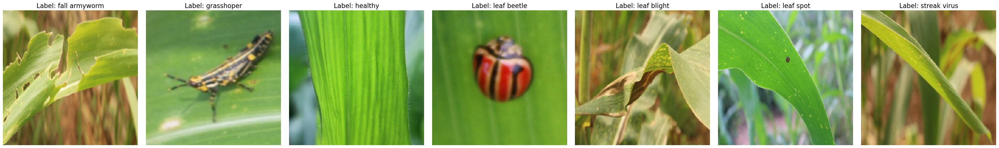

Unique image dimensions: {(93, 107), (400, 400), (207, 205), (188, 184)}
Number of channels: 3
Unique image formats: {'.jpg'}


In [18]:
import os
import matplotlib.pyplot as plt
from keras.preprocessing import image

# Load and visualize images
def load_and_visualize_images(df, img_size=(224, 224), title_fontsize=16):
    unique_labels = df['label'].unique()
    
    # Create a subplot with a single row and a number of columns equal to the number of unique labels
    fig, axes = plt.subplots(1, len(unique_labels), figsize=(5 * len(unique_labels), 5))
    
    for label_idx, label in enumerate(unique_labels):
        # Select the first image for each unique label
        img_path = df[df['label'] == label]['file_path'].iloc[0]
        
        # Load and display the image
        img = image.load_img(img_path, target_size=img_size)
        axes[label_idx].imshow(img)
        axes[label_idx].set_title(f"Label: {label}", fontsize=title_fontsize)  # Increase the font size of the title
        axes[label_idx].axis('off')
    
    plt.tight_layout()
    plt.show()

# Data inspection
def inspect_data(df):
    # Check image dimensions
    dimensions = []
    for img_path in df['file_path']:
        img = image.load_img(img_path)
        dimensions.append(img.size)
    
    unique_dimensions = set(dimensions)
    print(f"Unique image dimensions: {unique_dimensions}")
    
    # Check image channels
    img = image.load_img(df['file_path'][0])
    print(f"Number of channels: {len(img.getbands())}")
    
    # Check file formats
    formats = [os.path.splitext(img_path)[1].lower() for img_path in df['file_path']]
    unique_formats = set(formats)
    print(f"Unique image formats: {unique_formats}")

# Main processing
def main(df):
    # Visualize and inspect data
    load_and_visualize_images(df)
    inspect_data(df)

main(df)


## Findings
- Unique image dimensions:  (400, 400)
- Number of channels: 3
- Unique image formats: {'.jpg'}

## g) Dimension of each class label

In [19]:
import pandas as pd
from PIL import Image

# Function to get image dimensions
def get_image_dimensions(file_path):
    with Image.open(file_path) as img:
        return img.size  # Returns (width, height)

# Apply the function to the file_path column
df[['width', 'height']] = df['file_path'].apply(lambda x: pd.Series(get_image_dimensions(x)))

# Group by label and aggregate dimensions
dimensions_by_label = df.groupby('label').agg({
    'width': ['min', 'max', 'mean'],
    'height': ['min', 'max', 'mean']
})

# Print the dimensions for each class label
print(dimensions_by_label)


              width                  height                 
                min  max        mean    min  max        mean
label                                                       
fall armyworm   400  400  400.000000    400  400  400.000000
grasshoper      400  400  400.000000    400  400  400.000000
healthy         400  400  400.000000    400  400  400.000000
leaf beetle     400  400  400.000000    400  400  400.000000
leaf blight     400  400  400.000000    400  400  400.000000
leaf spot        93  400  399.319962    107  400  399.327603
streak virus    400  400  400.000000    400  400  400.000000


In [20]:
#Check the data type and size 
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5037 entries, 0 to 5036
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   file_path  5037 non-null   object
 1   label      5037 non-null   object
 2   width      5037 non-null   int64 
 3   height     5037 non-null   int64 
dtypes: int64(2), object(2)
memory usage: 157.5+ KB


## h) Plot the width and height of images for each class

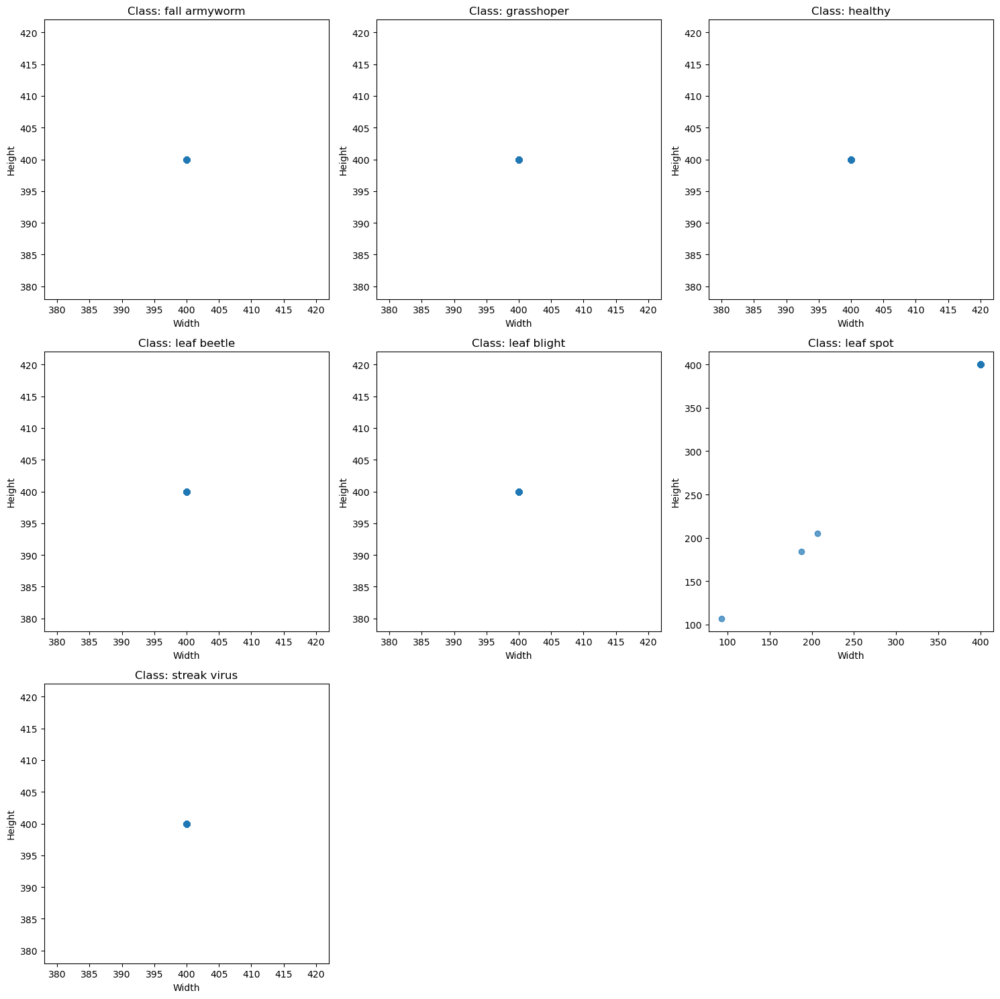

In [21]:
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt

# Function to get image dimensions
def get_image_dimensions(file_path):
    with Image.open(file_path) as img:
        return img.size  # Returns (width, height)

# Apply the function to the file_path column
df[['width', 'height']] = df['file_path'].apply(lambda x: pd.Series(get_image_dimensions(x)))

# Get unique class labels
class_labels = df['label'].unique()

# Create a figure with subplots
num_classes = len(class_labels)
fig, axes = plt.subplots(nrows=(num_classes // 3) + 1, ncols=3, figsize=(15, 5 * ((num_classes // 3) + 1)))

# Flatten axes array
axes = axes.flatten()

for i, label in enumerate(class_labels):
    ax = axes[i]
    subset = df[df['label'] == label]
    ax.scatter(subset['width'], subset['height'], alpha=0.7)
    ax.set_title(f'Class: {label}')
    ax.set_xlabel('Width')
    ax.set_ylabel('Height')

# Remove any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


## I) Pixel intensity distribution for each label

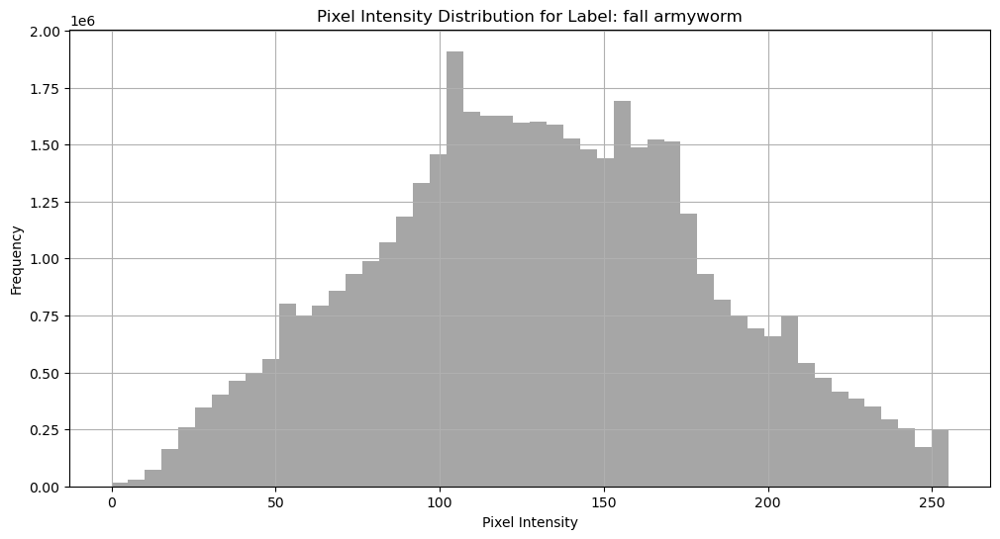

Label: fall armyworm
  Mean Pixel Intensity: 130.54
  Median Pixel Intensity: 130.00
  Standard Deviation of Pixel Intensity: 51.21



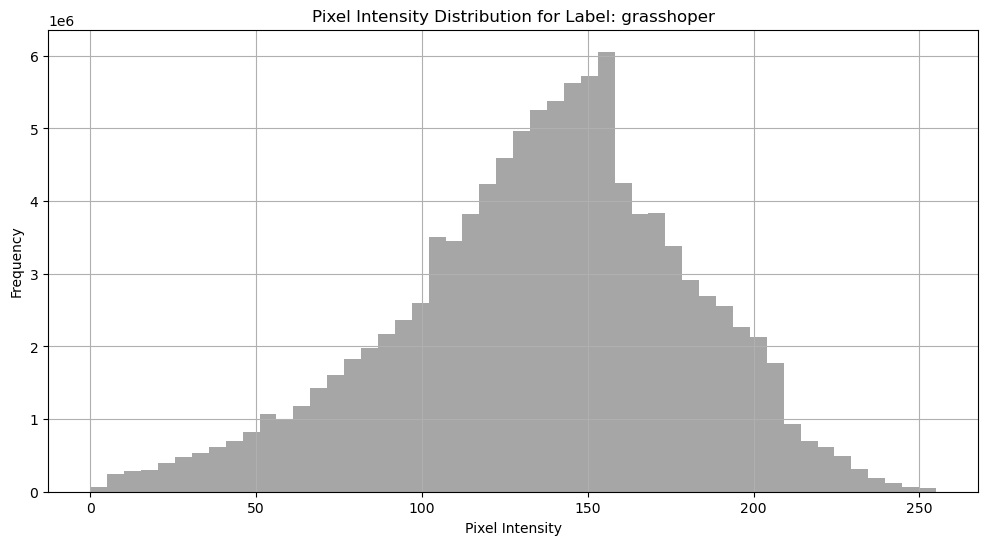

Label: grasshoper
  Mean Pixel Intensity: 136.25
  Median Pixel Intensity: 140.00
  Standard Deviation of Pixel Intensity: 43.75



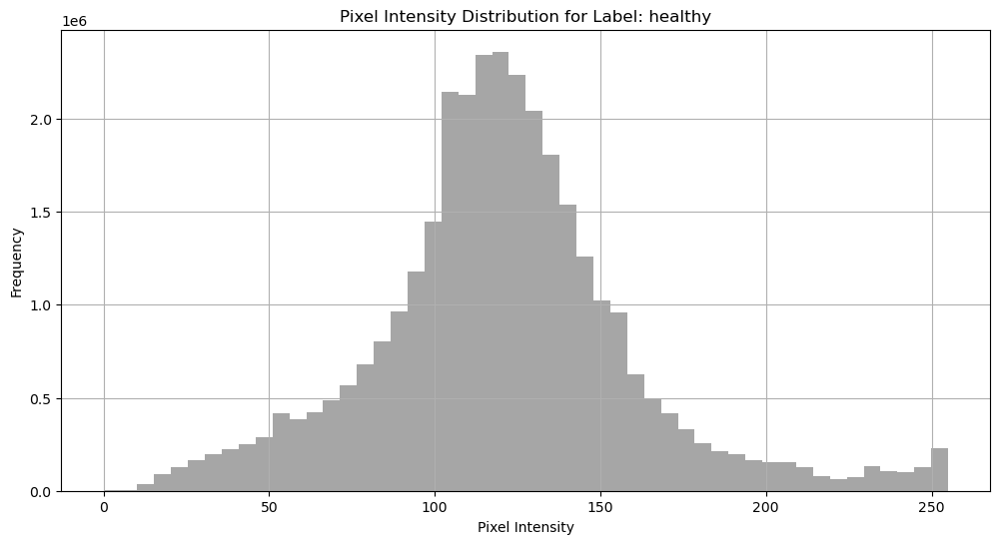

Label: healthy
  Mean Pixel Intensity: 120.63
  Median Pixel Intensity: 120.00
  Standard Deviation of Pixel Intensity: 39.52



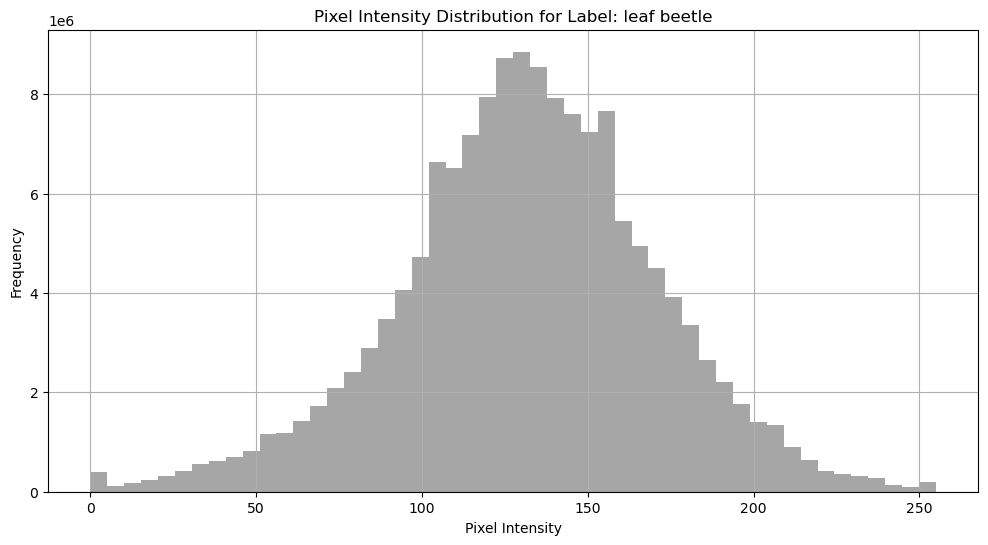

Label: leaf beetle
  Mean Pixel Intensity: 131.60
  Median Pixel Intensity: 132.00
  Standard Deviation of Pixel Intensity: 39.09



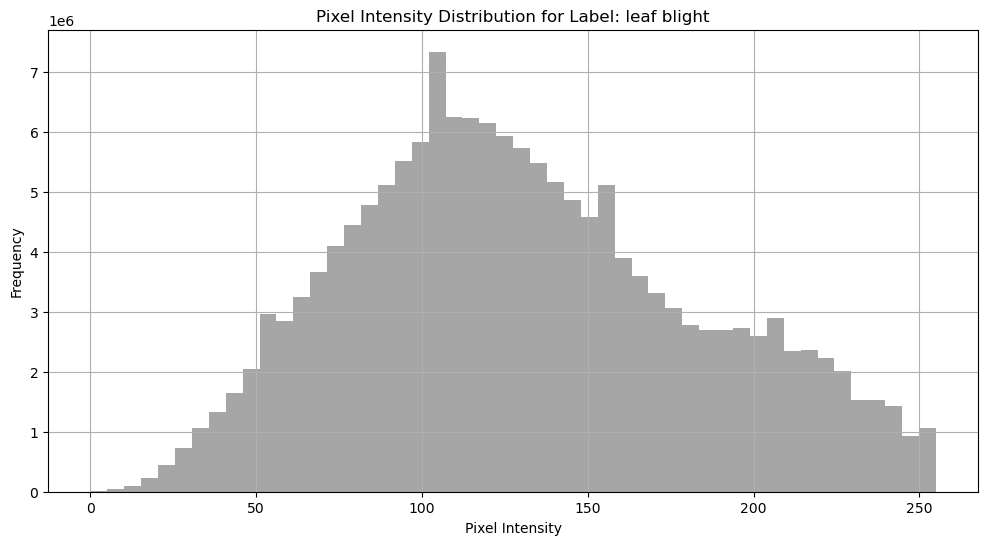

Label: leaf blight
  Mean Pixel Intensity: 130.86
  Median Pixel Intensity: 125.00
  Standard Deviation of Pixel Intensity: 52.44



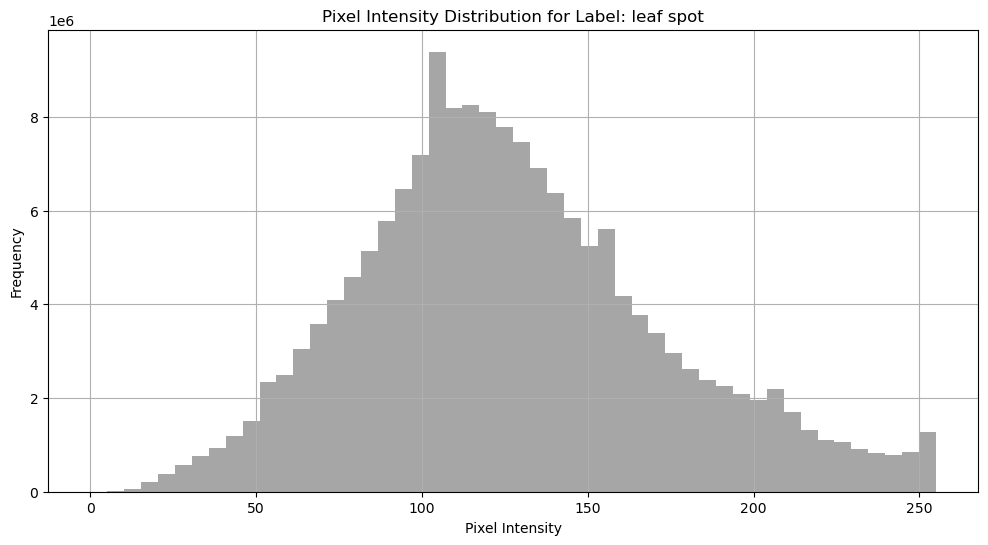

Label: leaf spot
  Mean Pixel Intensity: 126.87
  Median Pixel Intensity: 122.00
  Standard Deviation of Pixel Intensity: 46.13



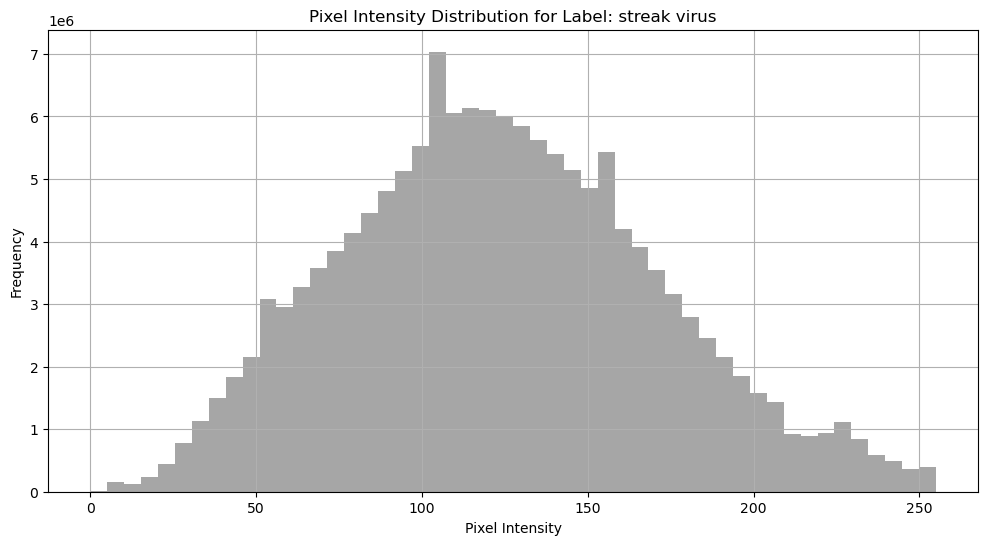

Label: streak virus
  Mean Pixel Intensity: 123.40
  Median Pixel Intensity: 121.00
  Standard Deviation of Pixel Intensity: 47.30



In [22]:
import numpy as np
import matplotlib.pyplot as plt
from keras.preprocessing import image
import seaborn as sns

def analyze_pixel_intensity_by_label(df):
    # Get unique labels
    labels = df['label'].unique()
    
    for label in labels:
        # Filter images by label
        label_df = df[df['label'] == label]
        all_pixels = []

        for img_path in label_df['file_path']:
            img = image.load_img(img_path, color_mode='grayscale')  # Load image in grayscale mode
            img_array = image.img_to_array(img).flatten()  # Flatten the image array
            all_pixels.extend(img_array)

        all_pixels = np.array(all_pixels)

        # Plot histogram of pixel intensities for the current label
        plt.figure(figsize=(12, 6))
        plt.hist(all_pixels, bins=50, color='gray', alpha=0.7)
        plt.title(f'Pixel Intensity Distribution for Label: {label}')
        plt.xlabel('Pixel Intensity')
        plt.ylabel('Frequency')
        plt.grid(True)
        plt.show()

        # Compute summary statistics
        mean_intensity = np.mean(all_pixels)
        median_intensity = np.median(all_pixels)
        std_intensity = np.std(all_pixels)

        print(f"Label: {label}")
        print(f"  Mean Pixel Intensity: {mean_intensity:.2f}")
        print(f"  Median Pixel Intensity: {median_intensity:.2f}")
        print(f"  Standard Deviation of Pixel Intensity: {std_intensity:.2f}")
        print()

analyze_pixel_intensity_by_label(df)


# 2 Quality Checks:
- Blurriness and Noise: Assess image quality, looking for blurriness, noise, or other quality issues.
- Duplicate Images: Detect and handle duplicate images.

## 2a. Assessing Blurriness and Noise for each class

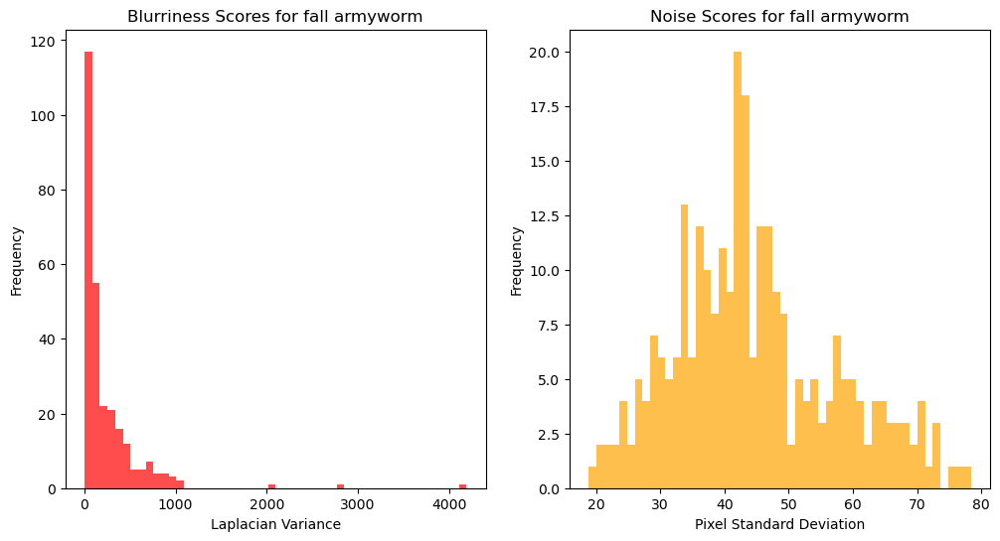

Label: fall armyworm
Mean Blurriness: 236.29
Median Blurriness: 107.54
Standard Deviation of Blurriness: 384.18

Mean Noise Level: 44.69
Median Noise Level: 42.74
Standard Deviation of Noise Level: 12.48

------------------------------



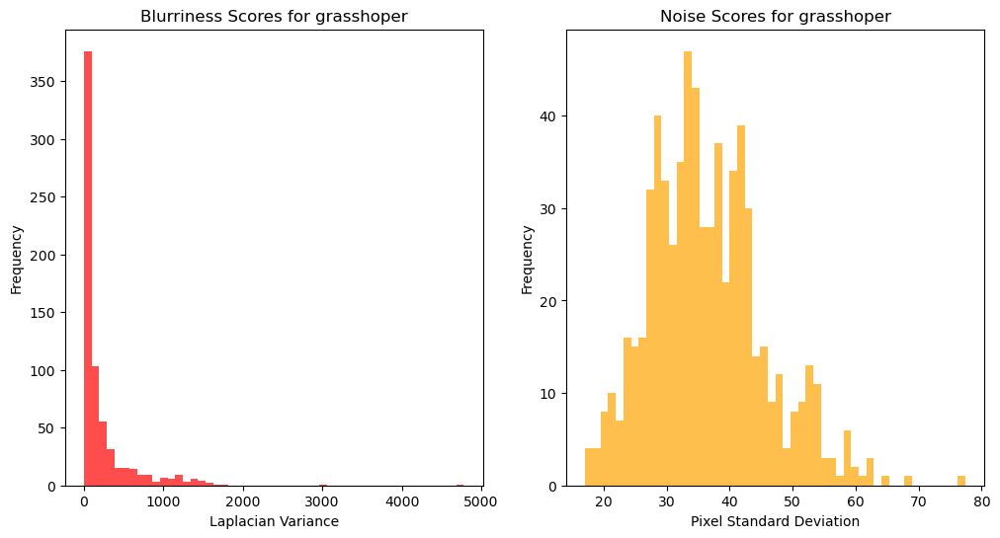

Label: grasshoper
Mean Blurriness: 218.03
Median Blurriness: 79.57
Standard Deviation of Blurriness: 382.41

Mean Noise Level: 36.35
Median Noise Level: 35.14
Standard Deviation of Noise Level: 9.07

------------------------------



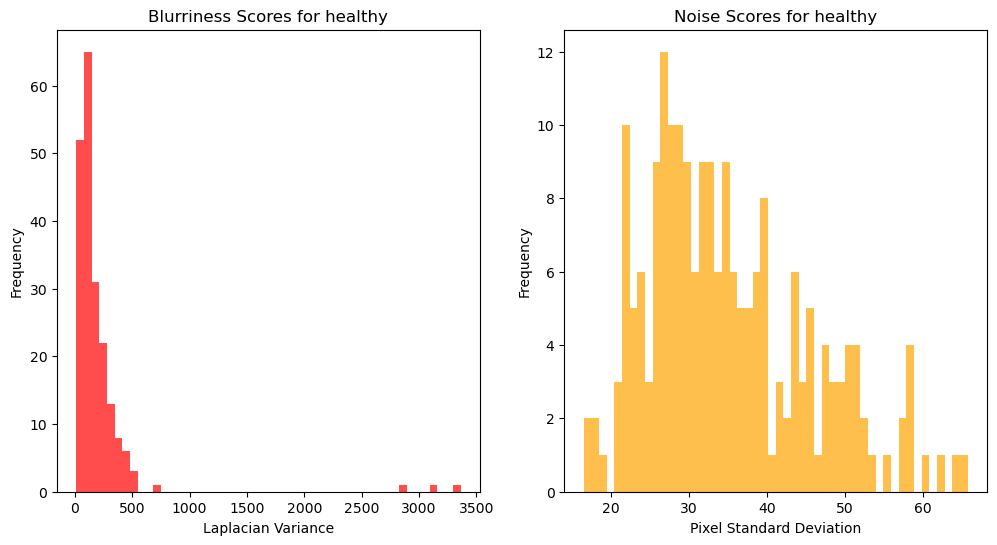

Label: healthy
Mean Blurriness: 205.66
Median Blurriness: 120.91
Standard Deviation of Blurriness: 375.98

Mean Noise Level: 34.97
Median Noise Level: 32.80
Standard Deviation of Noise Level: 10.41

------------------------------



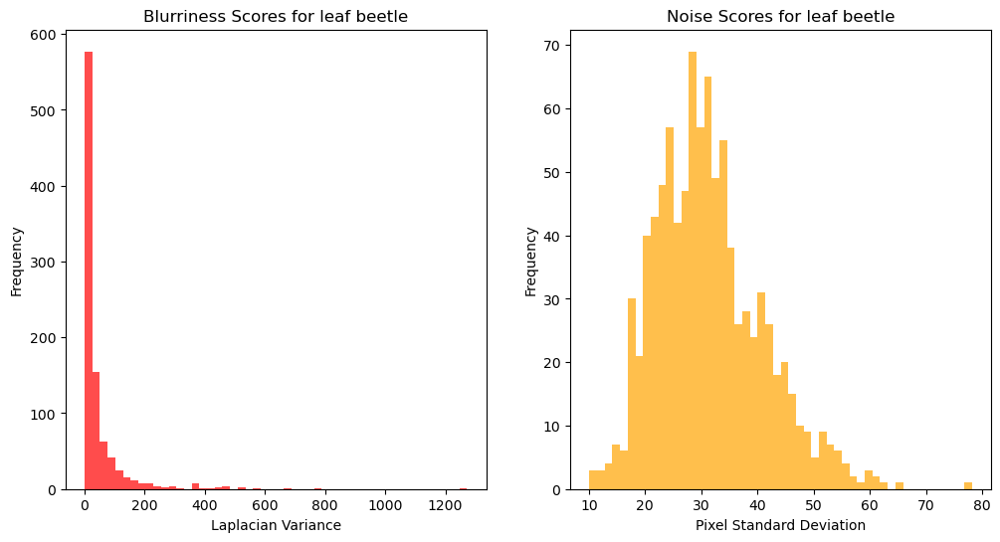

Label: leaf beetle
Mean Blurriness: 45.22
Median Blurriness: 18.16
Standard Deviation of Blurriness: 88.02

Mean Noise Level: 31.39
Median Noise Level: 30.33
Standard Deviation of Noise Level: 9.49

------------------------------



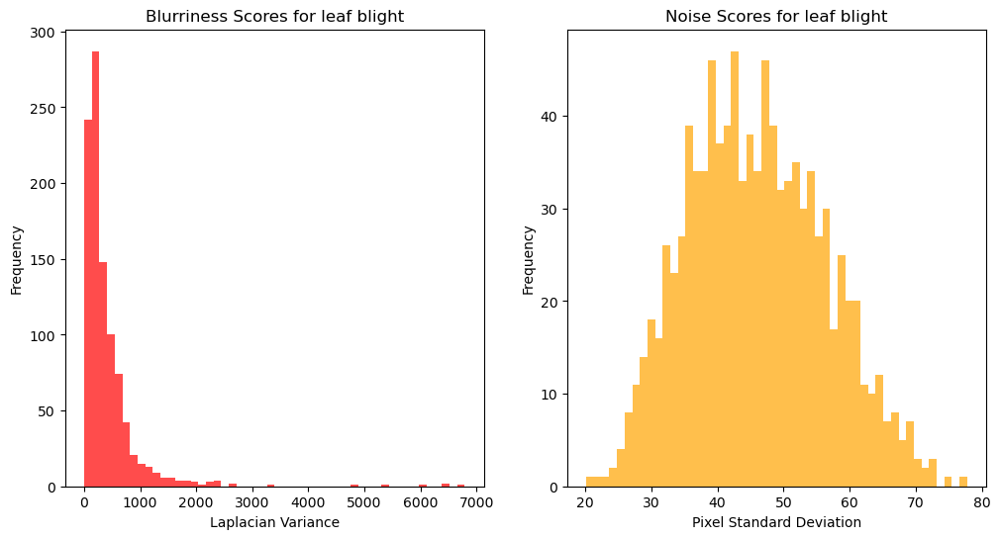

Label: leaf blight
Mean Blurriness: 418.90
Median Blurriness: 256.17
Standard Deviation of Blurriness: 588.96

Mean Noise Level: 45.96
Median Noise Level: 45.39
Standard Deviation of Noise Level: 10.31

------------------------------



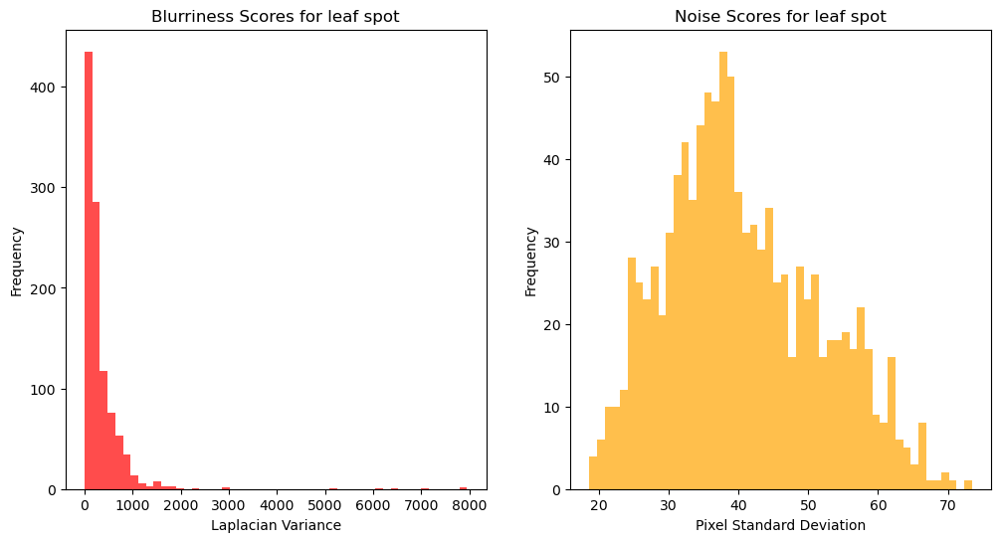

Label: leaf spot
Mean Blurriness: 342.33
Median Blurriness: 203.44
Standard Deviation of Blurriness: 588.89

Mean Noise Level: 40.51
Median Noise Level: 38.92
Standard Deviation of Noise Level: 10.90

------------------------------



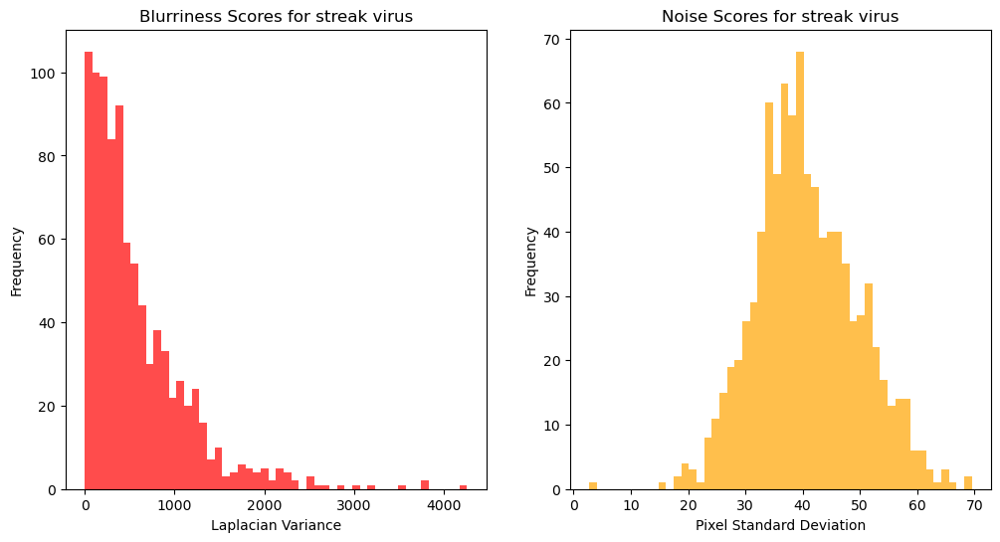

Label: streak virus
Mean Blurriness: 576.12
Median Blurriness: 404.24
Standard Deviation of Blurriness: 559.66

Mean Noise Level: 40.67
Median Noise Level: 39.79
Standard Deviation of Noise Level: 8.94

------------------------------



In [23]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from keras.preprocessing import image

def image_quality_metrics_by_label(df):
    # Get unique labels
    unique_labels = df['label'].unique()

    for label in unique_labels:
        # Filter the DataFrame for the current label
        df_label = df[df['label'] == label]

        # Initialize lists to store blurriness and noise scores for the current label
        blurriness_scores = []
        noise_scores = []

        for img_path in df_label['file_path']:
            # Load the image in grayscale
            img = image.load_img(img_path, color_mode='grayscale')
            img_array = image.img_to_array(img).astype(np.uint8).squeeze()

            # Calculate the Laplacian variance for blurriness
            laplacian_var = cv2.Laplacian(img_array, cv2.CV_64F).var()
            blurriness_scores.append(laplacian_var)

            # Calculate noise level using standard deviation
            noise_level = np.std(img_array)
            noise_scores.append(noise_level)

        # Convert lists to numpy arrays for statistics
        blurriness_scores = np.array(blurriness_scores)
        noise_scores = np.array(noise_scores)

        # Plot histograms for the current label
        plt.figure(figsize=(12, 6))

        plt.subplot(1, 2, 1)
        plt.hist(blurriness_scores, bins=50, color='red', alpha=0.7)
        plt.title(f'Blurriness Scores for {label}')
        plt.xlabel('Laplacian Variance')
        plt.ylabel('Frequency')

        plt.subplot(1, 2, 2)
        plt.hist(noise_scores, bins=50, color='orange', alpha=0.7)
        plt.title(f'Noise Scores for {label}')
        plt.xlabel('Pixel Standard Deviation')
        plt.ylabel('Frequency')

        plt.show()

        # Print statistics for the current label
        print(f"Label: {label}")
        print(f"Mean Blurriness: {np.mean(blurriness_scores):.2f}")
        print(f"Median Blurriness: {np.median(blurriness_scores):.2f}")
        print(f"Standard Deviation of Blurriness: {np.std(blurriness_scores):.2f}")

        print(f"\nMean Noise Level: {np.mean(noise_scores):.2f}")
        print(f"Median Noise Level: {np.median(noise_scores):.2f}")
        print(f"Standard Deviation of Noise Level: {np.std(noise_scores):.2f}")
        print("\n" + "-"*30 + "\n")

# Perform image quality metrics analysis by label
image_quality_metrics_by_label(df)

## 3.) Label Distribution

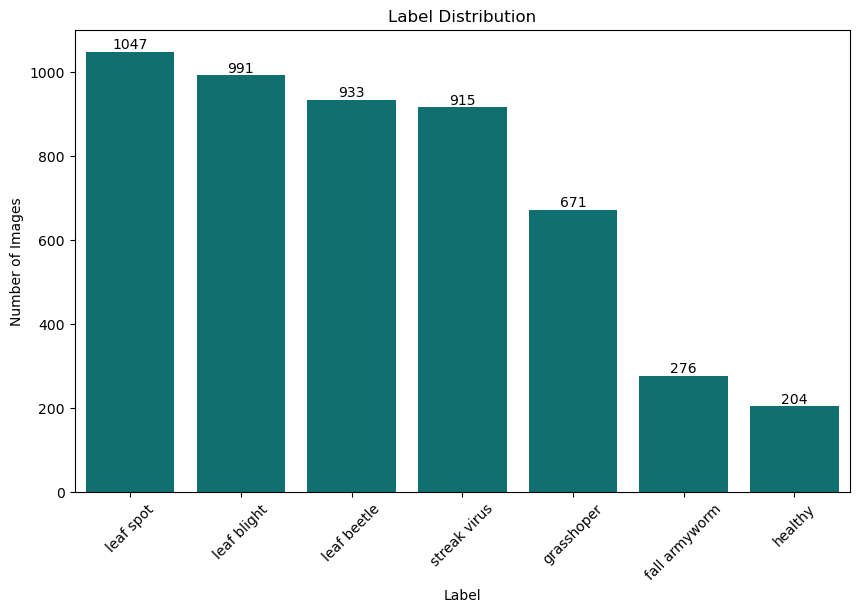

In [24]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def label_distribution(df):
    # Calculate the count of each label
    label_counts = df['label'].value_counts()

    # Create a bar plot
    plt.figure(figsize=(10, 6))
    ax = sns.barplot(x=label_counts.index, y=label_counts.values, color='teal')  # Using color instead of palette

    # Add titles and labels
    plt.title('Label Distribution')
    plt.xlabel('Label')
    plt.ylabel('Number of Images')
    plt.xticks(rotation=45)

    # Add frequency counts on top of each bar
    for p in ax.patches:
        ax.annotate(f'{int(p.get_height())}', 
                    (p.get_x() + p.get_width() / 2., p.get_height()), 
                    ha='center', va='center', 
                    xytext=(0, 5), 
                    textcoords='offset points')

    # Show the plot
    plt.show()

label_distribution(df)

## Findings
- There is class imbalance

## 3a) Class Imbalance Ratio

In [25]:
#Count the labels
counts = df['label'].value_counts()
counts

leaf spot        1047
leaf blight       991
leaf beetle       933
streak virus      915
grasshoper        671
fall armyworm     276
healthy           204
Name: label, dtype: int64

In [26]:
# Calculate the ratio of each maize class
total_df = len(df)
total_ratios = counts / total_df

# Print the class ratios
print("Class Ratios:")
print(total_ratios)

Class Ratios:
leaf spot        0.207862
leaf blight      0.196744
leaf beetle      0.185229
streak virus     0.181656
grasshoper       0.133214
fall armyworm    0.054795
healthy          0.040500
Name: label, dtype: float64


# 4. DATA AUGUMENTATING THE MINORITY CLASSES TO MATCH THE MAJORITY CLASS

In [27]:
import pandas as pd
from PIL import Image, ImageOps, ImageEnhance, ImageFilter
import numpy as np
import os
from sklearn.utils import resample
from scipy.ndimage import gaussian_filter

# Function to perform image augmentation, including sharpening and noise reduction
def augment_image(image):
    augmented_images = []
    
    # Flip the image horizontally
    flipped_image = ImageOps.mirror(image)
    augmented_images.append(flipped_image)
    
    # Rotate the image by a random angle
    angle = np.random.randint(-30, 30)
    rotated_image = image.rotate(angle)
    augmented_images.append(rotated_image)
    
    # Enhance the image brightness
    enhancer = ImageEnhance.Brightness(image)
    bright_image = enhancer.enhance(np.random.uniform(0.5, 1.5))
    augmented_images.append(bright_image)

    # Sharpen the image
    sharpened_image = image.filter(ImageFilter.SHARPEN)
    augmented_images.append(sharpened_image)
    
    # Convert image to numpy array for noise reduction
    image_array = np.array(image)
    
    # Apply Gaussian filter for noise reduction
    noise_reduced_image_array = gaussian_filter(image_array, sigma=1)
    
    # Convert back to PIL image
    noise_reduced_image = Image.fromarray(np.uint8(noise_reduced_image_array))
    augmented_images.append(noise_reduced_image)
    
    return augmented_images

# Get the class distribution
class_distribution = df['label'].value_counts()

# Determine the majority class size
majority_class_size = class_distribution.max()

# Directory to save augmented images
augmented_dir = 'augmented_images'
os.makedirs(augmented_dir, exist_ok=True)

# Augment images for each minority class
augmented_data = []

for label in class_distribution.index:
    class_df = df[df['label'] == label]
    class_size = class_distribution[label]
    
    if class_size < majority_class_size:
        # Need to augment
        augment_count = majority_class_size - class_size
        augmented_images = []
        
        for _, row in class_df.iterrows():
            image = Image.open(row['file_path'])
            augmented_images.extend(augment_image(image))
            
            if len(augmented_images) >= augment_count:
                break
        
        # Save augmented images and update the df
        for i, aug_image in enumerate(augmented_images[:augment_count]):
            aug_file_name = f"{label}_aug_{i}.jpg"
            aug_file_path = os.path.join(augmented_dir, aug_file_name)
            aug_image.save(aug_file_path)
            
            augmented_data.append({'file_path': aug_file_path, 'label': label})

# Append augmented data to the original df
augmented_df = pd.DataFrame(augmented_data)
df_balanced = pd.concat([df, augmented_df], ignore_index=True)

# Save the new balanced df
df_balanced.to_csv('balanced_image_labels.csv', index=False)

print("Augmentation complete. Balanced dataset saved as 'balanced_image_labels.csv'.")

Augmentation complete. Balanced dataset saved as 'balanced_image_labels.csv'.


In [1]:
#Read the balanced data back
import pandas as pd
df = pd.read_csv("balanced_image_labels.csv")

In [2]:
#View the new df
df.head(5)

,file_path,label,width,height
0,C:\Users\Diana\Downloads\Thesis stuff\Valid_Im...,fall armyworm,400.0,400.0
1,C:\Users\Diana\Downloads\Thesis stuff\Valid_Im...,fall armyworm,400.0,400.0
2,C:\Users\Diana\Downloads\Thesis stuff\Valid_Im...,fall armyworm,400.0,400.0
3,C:\Users\Diana\Downloads\Thesis stuff\Valid_Im...,fall armyworm,400.0,400.0
4,C:\Users\Diana\Downloads\Thesis stuff\Valid_Im...,fall armyworm,400.0,400.0


In [3]:
#Check the info on df
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7329 entries, 0 to 7328
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   file_path  7329 non-null   object 
 1   label      7329 non-null   object 
 2   width      5037 non-null   float64
 3   height     5037 non-null   float64
dtypes: float64(2), object(2)
memory usage: 229.2+ KB


In [4]:
#Select the only relevant variables
df = df[['file_path','label']]

In [5]:
#Check the variables present
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7329 entries, 0 to 7328
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   file_path  7329 non-null   object
 1   label      7329 non-null   object
dtypes: object(2)
memory usage: 114.6+ KB


## Visualize the Augumented Images

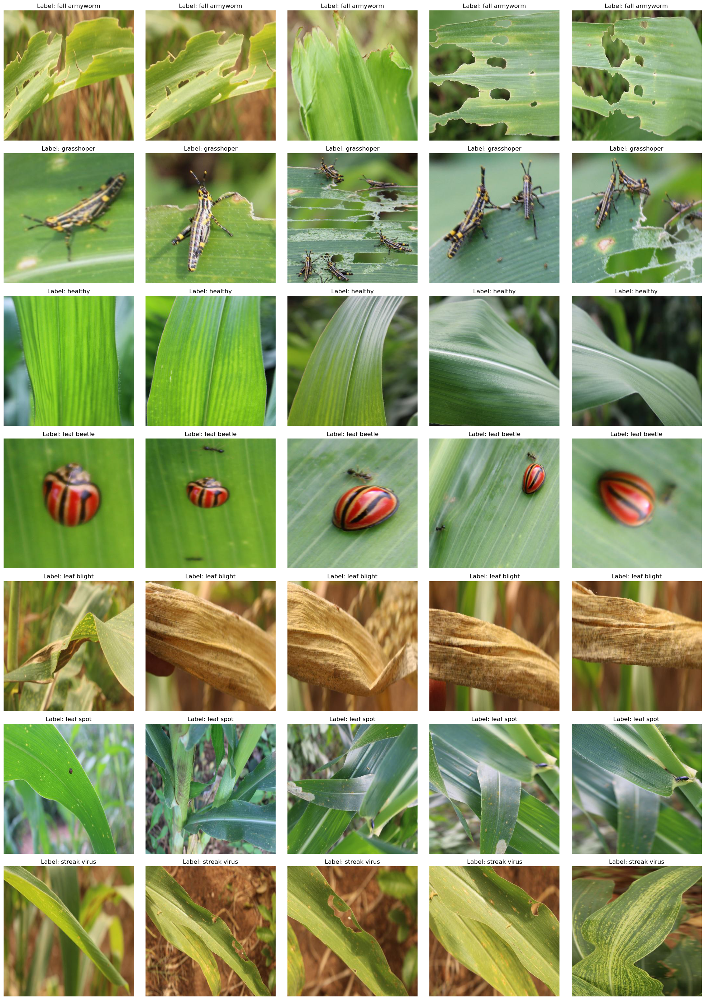

Unique image dimensions: {(93, 107), (400, 400), (207, 205), (188, 184)}
Number of channels: 3
Unique image formats: {'.jpg'}


In [6]:
#Visualize the augumented images
import os
import matplotlib.pyplot as plt
from keras.preprocessing import image

# Load and visualize images
def load_and_visualize_images(df, img_size=(400, 400)):
    unique_labels = df['label'].unique()
    fig, axes = plt.subplots(len(unique_labels), 5, figsize=(20, 4 * len(unique_labels)))
    
    for label_idx, label in enumerate(unique_labels):
        label_df = df[df['label'] == label].head(5)
        for img_idx, img_path in enumerate(label_df['file_path']):
            img = image.load_img(img_path, target_size=img_size)
            axes[label_idx, img_idx].imshow(img)
            axes[label_idx, img_idx].set_title(f"Label: {label}")
            axes[label_idx, img_idx].axis('off')
    
    plt.tight_layout()
    plt.show()

# Data inspection
def inspect_data(df):
    # Check image dimensions
    dimensions = []
    for img_path in df['file_path']:
        img = image.load_img(img_path)
        dimensions.append(img.size)
    
    unique_dimensions = set(dimensions)
    print(f"Unique image dimensions: {unique_dimensions}")
    
    # Check image channels
    img = image.load_img(df['file_path'][0])
    print(f"Number of channels: {len(img.getbands())}")
    
    # Check file formats
    formats = [os.path.splitext(img_path)[1].lower() for img_path in df['file_path']]
    unique_formats = set(formats)
    print(f"Unique image formats: {unique_formats}")

# Main processing
def main(df):
    # Visualize and inspect data
    load_and_visualize_images(df)
    inspect_data(df)
    
main(df)

In [6]:
#Count the labels
counts = df['label'].value_counts()
counts

fall armyworm    1047
grasshoper       1047
healthy          1047
leaf beetle      1047
leaf blight      1047
leaf spot        1047
streak virus     1047
Name: label, dtype: int64

In [7]:
#Check info in the df
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7329 entries, 0 to 7328
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   file_path  7329 non-null   object
 1   label      7329 non-null   object
dtypes: object(2)
memory usage: 114.6+ KB


## Check  the pixel size after augumentation

In [9]:
#Check  the pixel size after augumentation
import pandas as pd
from PIL import Image
import numpy as np

# Initialize variables to track the global min and max pixel values
global_min = float('inf')
global_max = float('-inf')

# Iterate over each file path in the dataframe
for index, row in df.iterrows():
    # Load the image using the file path
    image = Image.open(row['file_path'])
    
    # Convert the image to a numpy array
    image_array = np.array(image)
    
    # Find the min and max pixel values in this image
    local_min = image_array.min()
    local_max = image_array.max()
    
    # Update global min and max
    if local_min < global_min:
        global_min = local_min
    if local_max > global_max:
        global_max = local_max

print(f"Global minimum pixel value: {global_min}")
print(f"Global maximum pixel value: {global_max}")

Global minimum pixel value: 0
Global maximum pixel value: 255


## Check class size after augmentation

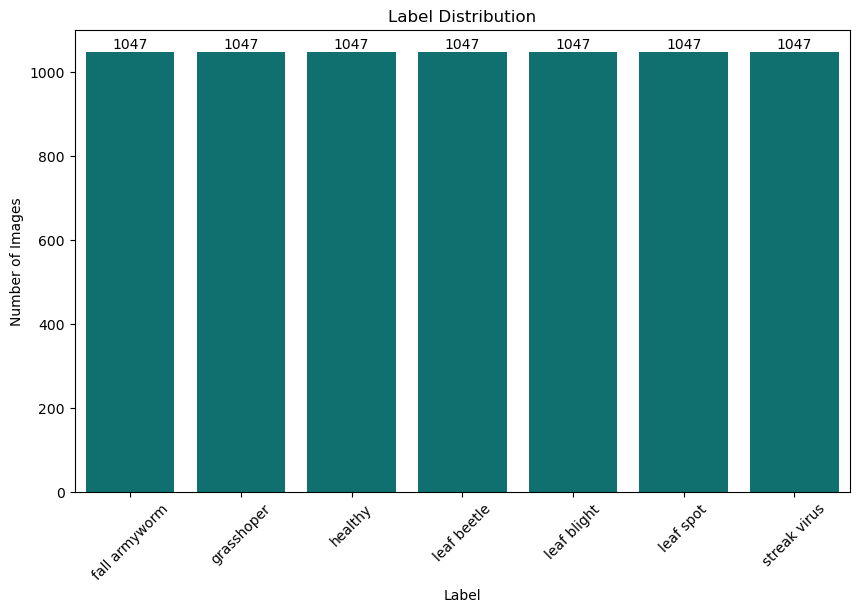

In [10]:
#Class sizes after augumentation
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def label_distribution(df):
    # Calculate the count of each label
    label_counts = df['label'].value_counts()

    # Create a bar plot
    plt.figure(figsize=(10, 6))
    ax = sns.barplot(x=label_counts.index, y=label_counts.values, color='teal')  # Using color instead of palette

    # Add titles and labels
    plt.title('Label Distribution')
    plt.xlabel('Label')
    plt.ylabel('Number of Images')
    plt.xticks(rotation=45)

    # Add frequency counts on top of each bar
    for p in ax.patches:
        ax.annotate(f'{int(p.get_height())}', 
                    (p.get_x() + p.get_width() / 2., p.get_height()), 
                    ha='center', va='center', 
                    xytext=(0, 5), 
                    textcoords='offset points')

    # Show the plot
    plt.show()

label_distribution(df)

In [8]:
#Rename the df so as to store original df
df_clean = df

In [9]:
#Check the info
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7329 entries, 0 to 7328
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   file_path  7329 non-null   object
 1   label      7329 non-null   object
dtypes: object(2)
memory usage: 114.6+ KB


In [10]:
#Check for duplicates in the newe df
df_clean.duplicated().sum()

0

In [11]:
#Check df_clean information
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7329 entries, 0 to 7328
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   file_path  7329 non-null   object
 1   label      7329 non-null   object
dtypes: object(2)
memory usage: 114.6+ KB


# 2 DCNN ARCHITECTURE FOR CLASSIFICATION

In [12]:
import os
import pandas as pd
import numpy as np
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split

In [13]:
#Check the 5 first observations of the df
df.head(5)

,file_path,label
0,C:\Users\Diana\Downloads\Thesis stuff\Valid_Im...,fall armyworm
1,C:\Users\Diana\Downloads\Thesis stuff\Valid_Im...,fall armyworm
2,C:\Users\Diana\Downloads\Thesis stuff\Valid_Im...,fall armyworm
3,C:\Users\Diana\Downloads\Thesis stuff\Valid_Im...,fall armyworm
4,C:\Users\Diana\Downloads\Thesis stuff\Valid_Im...,fall armyworm


## Define the 2DCNN model parameters

In [14]:
# Parameters
img_width, img_height = 299, 299  # image dimensions for resizing
batch_size = 32
epochs = 20
num_classes = df['label'].nunique()  # Number of unique classes/labels
print(num_classes)

7


## Encode the categorical variable label

In [15]:
# Encode labels into integers
label_encoder = LabelEncoder()
df['encoded_label'] = label_encoder.fit_transform(df['label'])

## Update the encoded variable

In [16]:
# Save the label encoder for future use
label_encoder_mapping = dict(zip(label_encoder.classes_, range(len(label_encoder.classes_))))
df.to_csv('image_labels_encoded.csv', index=False)

In [17]:
df.head(5)

,file_path,label,encoded_label
0,C:\Users\Diana\Downloads\Thesis stuff\Valid_Im...,fall armyworm,0
1,C:\Users\Diana\Downloads\Thesis stuff\Valid_Im...,fall armyworm,0
2,C:\Users\Diana\Downloads\Thesis stuff\Valid_Im...,fall armyworm,0
3,C:\Users\Diana\Downloads\Thesis stuff\Valid_Im...,fall armyworm,0
4,C:\Users\Diana\Downloads\Thesis stuff\Valid_Im...,fall armyworm,0


## Dataset size

In [18]:
# Initial count of data points
print(f"Initial data points: {df.shape[0]}")

Initial data points: 7329


## Split the data into training, test and validation sets

In [19]:
# Split the data into training (80%), validation (10%) and test (10%) sets
df_train, df_temp = train_test_split(df, test_size=0.2, random_state=42, shuffle=True, stratify=df['encoded_label'])
df_val, df_test = train_test_split(df_temp, test_size=0.5, random_state=42, shuffle=True, stratify=df_temp['encoded_label'])
print(f"Training data points: {df_train.shape[0]}")
print(f"Validation data points: {df_val.shape[0]}")
print(f"Test data points: {df_test.shape[0]}")

Training data points: 5863
Validation data points: 733
Test data points: 733


## Define the ImageDataGenerator

In [20]:
# Define the training ImageDataGenerator for data augmentation and rescaling
train_datagen = ImageDataGenerator(
    rescale=1.0/255.0        # Use 10% of the training data for validation
)

##  Training data generator

In [21]:
# Prepare training data generator
train_generator = train_datagen.flow_from_dataframe(
    dataframe=df_train,
    x_col='file_path',
    y_col='label',
    target_size=(img_width, img_height),
    batch_size=batch_size,
    class_mode='categorical',
    subset='training',          # Use the 'training' subset
    shuffle=True
)

Found 5863 validated image filenames belonging to 7 classes.


## validation data generator

In [22]:
# Define the validation ImageDataGenerator for data augmentation and rescaling 
val_datagen = ImageDataGenerator(
    rescale=1.0/255.0           # Normalize pixel values to [0, 1]
)

In [23]:
# Prepare validation data generator
val_generator = val_datagen.flow_from_dataframe(
    dataframe=df_val,
    x_col='file_path',
    y_col='label',      # Use encoded label
    target_size=(img_width, img_height),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True
)

Found 733 validated image filenames belonging to 7 classes.


## test data generator

In [24]:
# Define the test ImageDataGenerator for data augmentation and rescaling 
test_datagen = ImageDataGenerator(
    rescale=1.0/255.0           # Normalize pixel values to [0, 1]
)

In [25]:
# Prepare test data generator
test_generator = test_datagen.flow_from_dataframe(
    dataframe=df_test,
    x_col='file_path',
    y_col='label',
    target_size=(img_width, img_height),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False               # No need to shuffle test data
)

Found 733 validated image filenames belonging to 7 classes.


## Size of the 3 generators

In [26]:
# Print the number of samples in each generator for verification
print(f"Train generator samples: {train_generator.samples}")
print(f"Validation generator samples: {val_generator.samples}")
print(f"Test generator samples: {test_generator.samples}")

Train generator samples: 5863
Validation generator samples: 733
Test generator samples: 733


In [27]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.metrics import Precision, Recall
from tensorflow.keras.metrics import AUC

## DEFINE AND COMPILE THE 2DCNN  MODEL

In [28]:
# Custom callback to track test accuracy after each epoch during training
from tensorflow.keras.callbacks import Callback

class TestAccuracyCallback(Callback):
    def on_epoch_end(self, epoch, logs=None):
        test_metrics = self.model.evaluate(test_generator, verbose=0)
        test_accuracy = test_metrics[1]
        self.test_accuracies.append(test_accuracy)

    def on_train_begin(self, logs=None):
        self.test_accuracies = []

# Instantiate the callback
test_accuracy_callback = TestAccuracyCallback()


In [32]:
# Define and compile model
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(299, 299, 3)),
    MaxPooling2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(len(label_encoder.classes_), activation='softmax')
])

# Compile model with additional metrics
model.compile(optimizer=Adam(learning_rate=0.001),
              loss='categorical_crossentropy',
              metrics=['accuracy', Precision(), Recall(), AUC()])



# Define EarlyStopping callback
early_stopping = EarlyStopping(
    monitor='val_loss',                # Monitor the validation loss
    patience=5,                        # Number of epochs with no improvement to wait
    restore_best_weights=True,         # Restore model weights from the epoch with the best value of the monitored quantity
    verbose=1                          # Print messages when early stopping is triggered
)

# Train the model using the generators and early stopping
history = model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=20,
    callbacks=[early_stopping, test_accuracy_callback]
)

Epoch 1/20
184/184 [==============================] - 462s 2s/step - loss: 1.6515 - accuracy: 0.3650 - precision: 0.6212 - recall: 0.1259 - auc: 0.7627 - val_loss: 1.2700 - val_accuracy: 0.5321 - val_precision: 0.7979 - val_recall: 0.2101 - val_auc: 0.8704
Epoch 2/20
184/184 [==============================] - 446s 2s/step - loss: 1.2969 - accuracy: 0.4996 - precision: 0.7124 - recall: 0.2569 - auc: 0.8573 - val_loss: 1.1059 - val_accuracy: 0.5866 - val_precision: 0.7296 - val_recall: 0.3902 - val_auc: 0.8966
Epoch 3/20
184/184 [==============================] - 452s 2s/step - loss: 1.0983 - accuracy: 0.5895 - precision: 0.7544 - recall: 0.3856 - auc: 0.8998 - val_loss: 1.0198 - val_accuracy: 0.6221 - val_precision: 0.7673 - val_recall: 0.4543 - val_auc: 0.9124
Epoch 4/20
184/184 [==============================] - 455s 2s/step - loss: 0.9419 - accuracy: 0.6512 - precision: 0.7972 - recall: 0.4936 - auc: 0.9268 - val_loss: 1.0627 - val_accuracy: 0.5907 - val_precision: 0.7175 - val_recal

In [33]:
# Access the training history
history_dict = history.history

# Get the final values after the last epoch
final_train_loss = history_dict['loss'][-1]
final_train_accuracy = history_dict['accuracy'][-1]
final_val_loss = history_dict['val_loss'][-1]
final_val_accuracy = history_dict['val_accuracy'][-1]
final_val_precision = history_dict['val_precision'][-1]
final_val_recall = history_dict['val_recall'][-1]
final_val_auc = history_dict['val_auc'][-1]

print("Final Training Loss:", final_train_loss)
print("Final Training Accuracy:", final_train_accuracy)
print("Final Validation Loss:", final_val_loss)
print("Final Validation Accuracy:", final_val_accuracy)
print("Final Validation Precision:", final_val_precision)
print("Final Validation Recall:", final_val_recall)
print("Final Validation AUC:", final_val_auc)


Final Training Loss: 0.22037948668003082
Final Training Accuracy: 0.9242708683013916
Final Validation Loss: 1.0791807174682617
Final Validation Accuracy: 0.7421555519104004
Final Validation Precision: 0.7657142877578735
Final Validation Recall: 0.7312414646148682
Final Validation AUC: 0.9380740523338318


# Evaluate the 2DCNN Model

## Evaluate the model on test set

In [34]:
# Evaluate the model on the test set
test_loss, test_acc, test_precision, test_recall, test_auc = model.evaluate(test_generator)
print(f"Test Accuracy: {test_acc:.2f}")
print(f"Test Precision: {test_precision:.2f}")
print(f"Test Recall: {test_recall:.2f}")
print(f"Test AUC: {test_auc:.2f}")


23/23 [==============================] - 9s 384ms/step - loss: 0.6875 - accuracy: 0.7763 - precision: 0.8139 - recall: 0.7340 - auc: 0.9603
Test Accuracy: 0.78
Test Precision: 0.81
Test Recall: 0.73
Test AUC: 0.96


## Evaluate the model on validation set

In [35]:
# Evaluate the model on the validation set
val_loss, val_acc, val_precision, val_recall, val_auc = model.evaluate(val_generator)
print(f"Validation Accuracy: {val_acc:.2f}")
print(f"Validation Precision: {val_precision:.2f}")
print(f"Validation Recall: {val_recall:.2f}")
print(f"Validation AUC: {val_auc:.2f}")


23/23 [==============================] - 9s 379ms/step - loss: 0.7720 - accuracy: 0.7422 - precision: 0.7913 - recall: 0.6985 - auc: 0.9506
Validation Accuracy: 0.74
Validation Precision: 0.79
Validation Recall: 0.70
Validation AUC: 0.95


## Visualize the model outputs

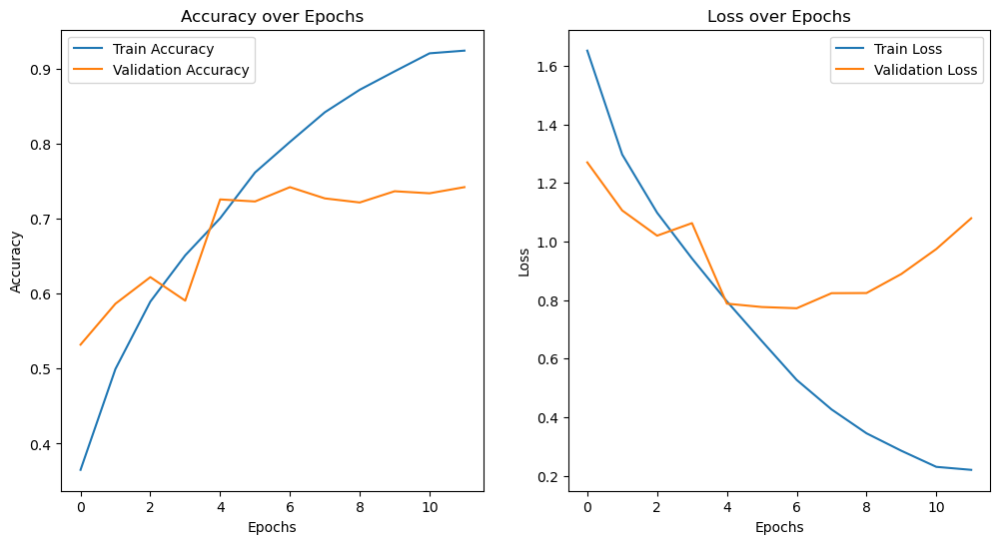

In [36]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
import numpy as np

# Accuracy and Loss Plots
plt.figure(figsize=(12, 6))

# Accuracy Plot
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Accuracy over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

# Loss Plot
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Loss over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()


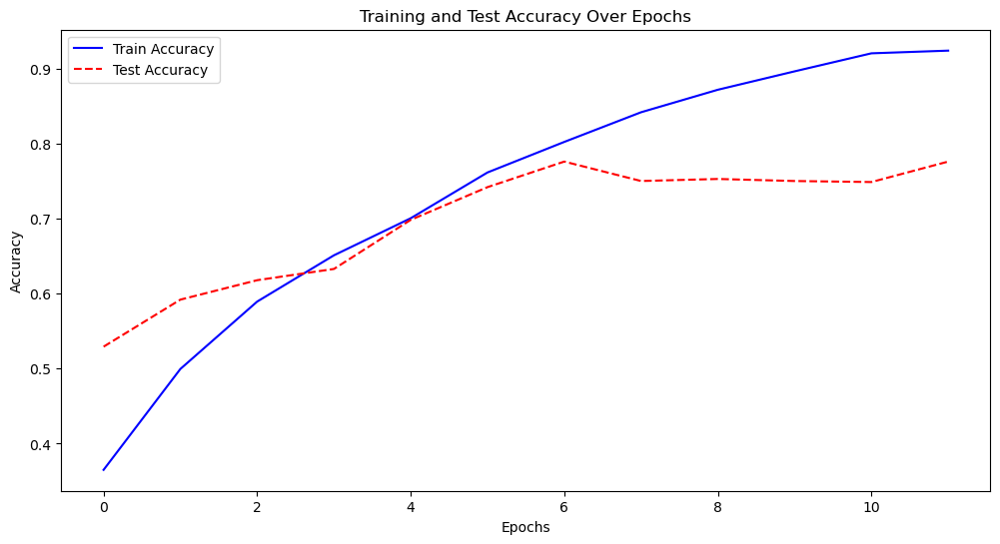

In [37]:
# Plot the training vs testting accuracy
import matplotlib.pyplot as plt

# Training accuracy
train_accuracy = history.history['accuracy']

# Test accuracy (from the callback)
test_accuracy = test_accuracy_callback.test_accuracies

# Plotting
plt.figure(figsize=(12, 6))

# Training Accuracy Plot
plt.plot(train_accuracy, label='Train Accuracy', color='blue')

# Test Accuracy Plot
plt.plot(test_accuracy, label='Test Accuracy', color='red', linestyle='--')

# Labels and Title
plt.title('Training and Test Accuracy Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.show()


# Confusion Matrix for training, test and validation sets for the 2DCNN Model

### Test Set

23/23 [==============================] - 10s 419ms/step


<Figure size 1200x1000 with 0 Axes>

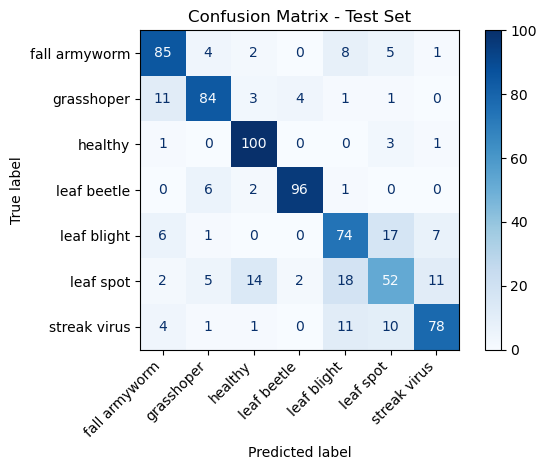

In [38]:
# Reset the test generator to start from the beginning
test_generator.reset()

# Generate predictions on the test set
test_predictions = model.predict(test_generator, verbose=1)
y_test_pred = np.argmax(test_predictions, axis=1)
y_test_true = test_generator.classes

# Compute the confusion matrix for test data
test_conf_matrix = confusion_matrix(y_test_true, y_test_pred)
test_conf_matrix_display = ConfusionMatrixDisplay(test_conf_matrix, display_labels=label_encoder.classes_)

# Plot confusion matrix for test set
plt.figure(figsize=(12, 10))
test_conf_matrix_display.plot(cmap=plt.cm.Blues, values_format='d')
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.title('Confusion Matrix - Test Set')
plt.tight_layout()
plt.show()


# Classification Reports of the 2DCNN Model

In [29]:
from sklearn.metrics import classification_report

# OPTIMIZING THE 2DCNN MODEL USING HYPER PARAMETER TUNING

In [2]:
from keras_tuner import RandomSearch
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from keras.optimizers import Adam
from keras.losses import CategoricalCrossentropy
from keras.metrics import Precision, Recall, AUC
from keras.callbacks import EarlyStopping

# Define hypermodel
def build_model(hp):
    model = Sequential()
    
    # First Conv Block
    model.add(Conv2D(filters=hp.Int('conv_1_filters', min_value=32, max_value=128, step=32), 
                     kernel_size=(3, 3), activation='relu', input_shape=(299, 299, 3)))
    model.add(MaxPooling2D((2, 2)))
    
    # Second Conv Block
    model.add(Conv2D(filters=hp.Int('conv_2_filters', min_value=32, max_value=128, step=32), 
                     kernel_size=(3, 3), activation='relu'))
    model.add(MaxPooling2D((2, 2)))
    
    # Third Conv Block
    model.add(Conv2D(filters=hp.Int('conv_3_filters', min_value=64, max_value=256, step=64), 
                     kernel_size=(3, 3), activation='relu'))
    model.add(MaxPooling2D((2, 2)))
    
    model.add(Flatten())
    
    # Dense Layer
    model.add(Dense(units=hp.Int('dense_units', min_value=64, max_value=256, step=64), activation='relu'))
    
    # Dropout
    model.add(Dropout(rate=hp.Float('dropout_rate', min_value=0.3, max_value=0.5, step=0.1)))
    
    # Output Layer
    model.add(Dense(len(label_encoder.classes_), activation='softmax'))
    
    # Compile Model
    model.compile(
        optimizer=Adam(learning_rate=hp.Float('learning_rate', min_value=0.0001, max_value=0.001, sampling='log')),
        loss=CategoricalCrossentropy(),
        metrics=['accuracy', Precision(), Recall(), AUC()])
    
    return model


In [ ]:
from keras_tuner import RandomSearch
from keras.callbacks import EarlyStopping

# Define the tuner
tuner = RandomSearch(
    build_model,  # Pass the hypermodel function
    objective='val_loss',  # Optimize for validation accuracy
    max_trials=5,  # Number of different hyperparameter sets to try
    executions_per_trial=1,  # Number of model evaluations per trial (averages results)
    directory='hyperparam_tuning',  # Directory to store logs/results
    project_name='image_classification_cnn_tuning'  # Name of the project
)

# Early stopping callback
early_stopping = EarlyStopping(
    monitor='val_accuracy',  # Stop if validation accuracy doesn't improve
    patience=5,  # Wait for 5 epochs with no improvement
    restore_best_weights=True,  # Restore model weights from the best epoch
    verbose=1
)

# Run the hyperparameter search
tuner.search(
    train_generator,  # Training data
    validation_data=val_generator,  # Validation data
    epochs=20,  # Maximum number of epochs
    callbacks=[early_stopping, test_accuracy_callback],  # Add early stopping
    verbose=1
)

# Get the best model found by the search
best_model = tuner.get_best_models(num_models=1)[0]

Reloading Tuner from hyperparam_tuning\image_classification_cnn_tuning\tuner0.json

Search: Running Trial #7

Value             |Best Value So Far |Hyperparameter
128               |96                |conv_1_filters
128               |96                |conv_2_filters
128               |128               |conv_3_filters
64                |64                |dense_units
0.5               |0.3               |dropout_rate
0.00045611        |0.00042491        |learning_rate

Epoch 1/20
184/184 [==============================] - 1776s 10s/step - loss: 1.8244 - accuracy: 0.2569 - precision: 0.6282 - recall: 0.0380 - auc: 0.6462 - val_loss: 1.6505 - val_accuracy: 0.4065 - val_precision: 0.6432 - val_recall: 0.1746 - val_auc: 0.7559
Epoch 2/20
 34/184 [====>.........................] - ETA: 24:46 - loss: 1.6455 - accuracy: 0.3697 - precision: 0.6550 - recall: 0.1232 - auc: 0.7493

In [ ]:
best_model.summary()

In [33]:
from keras_tuner import RandomSearch

# Restore the tuner
tuner = RandomSearch(
    build_model,  # Pass the hypermodel function
    objective='val_accuracy',
    max_trials=5,
    executions_per_trial=1,
    directory='hyperparam_tuning',  # Same directory used in the initial run
    project_name='image_classification_cnn_tuning'  # Same project name
)

# Get the summary of all trials
trial_summaries = tuner.oracle.get_best_trials()

# Print the summary of each trial
for trial in trial_summaries:
    print("Trial ID:", trial.trial_id)
    print("Best Hyperparameters:", trial.hyperparameters.values)

    # Accessing best value for 'val_accuracy' using get_best_value method
    best_val_accuracy = trial.metrics.get_best_value('val_accuracy')
    print("Best Value (Validation Accuracy):", best_val_accuracy)
    
    # Accessing best value for 'val_accuracy' using get_best_value method
    best_accuracy = trial.metrics.get_best_value('accuracy')
    print("Best Value (Accuracy):", best_accuracy)

    print("---------------------------------------------------------------------")

Reloading Tuner from hyperparam_tuning\image_classification_cnn_tuning\tuner0.json
Trial ID: 3
Best Hyperparameters: {'conv_1_filters': 128, 'conv_2_filters': 32, 'conv_3_filters': 192, 'dense_units': 256, 'dropout_rate': 0.3, 'learning_rate': 0.00015278006000418295}
Best Value (Validation Accuracy): 0.772851288318634
Best Value (Accuracy): 0.9286201596260071
---------------------------------------------------------------------


In [4]:
from keras_tuner import RandomSearch

# Restore the tuner
tuner = RandomSearch(
    build_model,  # Pass the hypermodel function
    objective='val_accuracy',
    max_trials=5,
    executions_per_trial=1,
    directory='hyperparam_tuning',  # Same directory used in the initial run
    project_name='image_classification_cnn_tuning'  # Same project name
)

# Get the summary of all trials
trial_summaries = tuner.oracle.get_best_trials()

# Print the summary of each trial
for trial in trial_summaries:
    print("Trial ID:", trial.trial_id)
    print("Best Hyperparameters:", trial.hyperparameters.values)
    
    # Accessing best values for the metrics
    best_val_accuracy = trial.metrics.get_best_value('val_accuracy')
    print("Best Value (Validation Accuracy):", best_val_accuracy)
    
    best_accuracy = trial.metrics.get_best_value('accuracy')
    print("Best Value (Accuracy):", best_accuracy)

    # Access precision, recall, and AUC (if tracked)
    best_val_precision = trial.metrics.get_best_value('val_precision')
    print("Best Value (Validation Precision):", best_val_precision)
    
    # Access precision, recall, and AUC (if tracked)
    best_precision = trial.metrics.get_best_value('precision')
    print("Best Value (Precision):", best_precision)
    
    best_val_recall = trial.metrics.get_best_value('val_recall')
    print("Best Value (Validation Recall):", best_val_recall)
    
    best_recall = trial.metrics.get_best_value('recall')
    print("Best Value (Recall):", best_recall)

    best_val_auc = trial.metrics.get_best_value('val_auc')
    print("Best Value (Validation AUC):", best_val_auc)
    
    best_auc = trial.metrics.get_best_value('auc')
    print("Best Value (AUC):", best_auc)

    print("---------------------------------------------------------------------")


Reloading Tuner from hyperparam_tuning\image_classification_cnn_tuning\tuner0.json
Trial ID: 3
Best Hyperparameters: {'conv_1_filters': 128, 'conv_2_filters': 32, 'conv_3_filters': 192, 'dense_units': 256, 'dropout_rate': 0.3, 'learning_rate': 0.00015278006000418295}
Best Value (Validation Accuracy): 0.772851288318634
Best Value (Accuracy): 0.9286201596260071
Best Value (Validation Precision): 0.8076450526714325
Best Value (Precision): 0.9466277658939362
Best Value (Validation Recall): 0.742155522108078
Best Value (Recall): 0.9049974381923676
Best Value (Validation AUC): 0.9552381336688995
Best Value (AUC): 0.9949888586997986
---------------------------------------------------------------------


In [34]:
#Test metrics
# Evaluate the model on the test set
test_loss, test_acc, test_precision, test_recall, test_auc = best_model.evaluate(test_generator)
print(f"Test Accuracy: {test_acc:.2f}")
print(f"Test Precision: {test_precision:.2f}")
print(f"Test Recall: {test_recall:.2f}")
print(f"Test AUC: {test_auc:.2f}")

23/23 [==============================] - 24s 1s/step - loss: 0.6853 - accuracy: 0.7708 - precision: 0.8250 - recall: 0.6944 - auc: 0.9601
Test Accuracy: 0.77
Test Precision: 0.82
Test Recall: 0.69
Test AUC: 0.96


## Confusion matrix

23/23 [==============================] - 19s 807ms/step


<Figure size 1000x800 with 0 Axes>

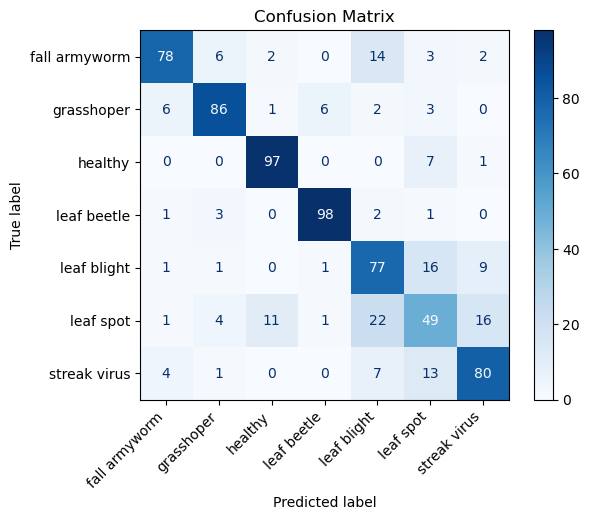

In [35]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Generate predictions
predictions = best_model.predict(test_generator)
y_pred = np.argmax(predictions, axis=1)
y_true = test_generator.classes

# Compute confusion matrix
conf_matrix = confusion_matrix(y_true, y_pred)

# Display confusion matrix
conf_matrix_display = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=label_encoder.classes_)
plt.figure(figsize=(10, 8))
conf_matrix_display.plot(cmap=plt.cm.Blues)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.title('Confusion Matrix')
plt.show()


# CLASSIFICATION USING DEEP CNN ARCHITECTURE EXTRACTED FEATURES

In [51]:
#The df_clean data
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7329 entries, 0 to 7328
Data columns (total 3 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   file_path      7329 non-null   object
 1   label          7329 non-null   object
 2   encoded_label  7329 non-null   int32 
dtypes: int32(1), object(2)
memory usage: 143.3+ KB


In [52]:
#Check for duplicates
df_clean.duplicated().sum()

0

# Feature Extraction Using the two CNN ARCHITECTURES
- EfficientNetB0
- InceptionV3

## Feature extraction Using EfficientNetBO and Dimensionality Reduction using PCA

### Feature Extraction using EfficientNetB0 when IMAGE SIZE is  224X224 and Dimensionality Reduction using PCA

In [35]:
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.applications.efficientnet import preprocess_input as preprocess_efficientnet
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D
import os

# Load and preprocess images in batches
def load_and_preprocess_images_in_batches(df, img_size=(224, 224), preprocess_func=None, batch_size=32):
    num_images = len(df)
    for start_idx in range(0, num_images, batch_size):
        end_idx = min(start_idx + batch_size, num_images)
        batch_df = df.iloc[start_idx:end_idx]
        images = np.zeros((end_idx - start_idx,) + img_size + (3,), dtype=np.float32)
        labels = []
        
        for i, img_path in enumerate(batch_df['file_path']):
            try:
                if not os.path.isfile(img_path):
                    print(f"File not found: {img_path}")
                    continue
                # Load and resize image
                img = image.load_img(img_path, target_size=img_size)
                img_array = image.img_to_array(img)
                
                # Normalize image
                if preprocess_func:
                    img_array = preprocess_func(img_array)
                
                images[i] = img_array
                labels.append(batch_df['label'].iloc[i])
            except Exception as e:
                print(f"Error loading image {img_path}: {e}")
                continue
        
        yield images[:end_idx-start_idx], np.array(labels)

# Extract features in batches
def extract_features_in_batches(model, batch_generator):
    for batch_images, batch_labels in batch_generator:
        features = model.predict(batch_images)
        yield features, batch_labels

# Accumulate features before applying PCA
def accumulate_features(features_generator):
    all_features = []
    all_labels = []
    
    for features, labels in features_generator:
        all_features.append(features)
        all_labels.extend(labels)
    
    return np.vstack(all_features), np.array(all_labels)

# Apply PCA
def apply_pca(features, variance_threshold=0.95):
    pca = PCA()
    pca.fit(features)  # Fit PCA on features
    cumulative_variance = np.cumsum(pca.explained_variance_ratio_)
    
    # Determine the number of components to retain
    n_components = np.argmax(cumulative_variance >= variance_threshold) + 1
    
    # Initialize PCA with the determined number of components
    pca = PCA(n_components=n_components)
    pca_features = pca.fit_transform(features)
    
    return pca_features, pca.explained_variance_ratio_

# Process EfficientNetB0 and save PCA results
def process_efficientnetb0(df_clean):
    # Load EfficientNetB0 model
    base_model_efficientnetb0 = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
    x_efficientnetb0 = base_model_efficientnetb0.output
    x_efficientnetb0 = GlobalAveragePooling2D()(x_efficientnetb0)
    model_efficientnetb0 = Model(inputs=base_model_efficientnetb0.input, outputs=x_efficientnetb0)
    
    # Set batch size
    batch_size = 32

    # Create a batch generator
    batch_generator = load_and_preprocess_images_in_batches(df_clean, img_size=(224, 224), preprocess_func=preprocess_efficientnet, batch_size=batch_size)

    # Extract features in batches
    features_generator = extract_features_in_batches(model_efficientnetb0, batch_generator)

    # Accumulate features
    features, labels = accumulate_features(features_generator)

    # Apply PCA
    pca_features, explained_variance_ratio = apply_pca(features, variance_threshold=0.95)
    print(f"PCA explained variance ratio for EfficientNetB0: {explained_variance_ratio}")
    
    # Create a DataFrame for PCA features along with labels
    pca_df = pd.DataFrame(pca_features)
    pca_df['label'] = labels
    
    # Save PCA features and labels to a CSV file
    pca_df.to_csv('pca_features_EfficientNetB0.csv', index=False)
    print(f"PCA features for EfficientNetB0 saved as 'pca_features_EfficientNetB0.csv'.")

# Main processing
def main():

    # Process EfficientNetB0
    process_efficientnetb0(df_clean)

if __name__ == "__main__":
    main()


1/1 [==============================] - 1s 1s/step
PCA explained variance ratio for EfficientNetB0: [0.12589234 0.06095911 0.05279715 0.04741062 0.0329578  0.02711155
 0.02542402 0.02284736 0.01870907 0.01642471 0.01581099 0.01467181
 0.01289148 0.01193479 0.01112302 0.01068009 0.01036621 0.00920651
 0.00887767 0.00845165 0.00839966 0.00755381 0.00739019 0.00696737
 0.00678225 0.00649612 0.0062238  0.00585631 0.00565696 0.00546492
 0.00537659 0.00516269 0.00499576 0.00488448 0.00475824 0.00440796
 0.00434987 0.00425898 0.00417783 0.00412563 0.00389686 0.0038035
 0.00364242 0.00356689 0.00341507 0.0032968  0.00324717 0.00319871
 0.00312122 0.00308165 0.00298243 0.00289815 0.00285362 0.0028047
 0.0027331  0.00268382 0.00260063 0.00255634 0.00253372 0.00252421
 0.00247402 0.00239971 0.00238719 0.00235732 0.00229392 0.00219776
 0.00215508 0.00212563 0.00209068 0.0020394  0.00202465 0.00196055
 0.00192832 0.00189252 0.00188921 0.00184643 0.00182968 0.00179311
 0.00176104 0.00174669 0.0017358

PCA features for EfficientNetB0 saved as 'pca_features_EfficientNetB0.csv'.


### Feature Extraction using EfficientNetB0 when IMAGE SIZE is 299X299 and Dimensionality Reduction using PCA

In [36]:
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.applications.efficientnet import preprocess_input as preprocess_efficientnet
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D
import os

# Load and preprocess images in batches
def load_and_preprocess_images_in_batches(df, img_size=(299, 299), preprocess_func=None, batch_size=32):
    num_images = len(df)
    for start_idx in range(0, num_images, batch_size):
        end_idx = min(start_idx + batch_size, num_images)
        batch_df = df.iloc[start_idx:end_idx]
        images = np.zeros((end_idx - start_idx,) + img_size + (3,), dtype=np.float32)
        labels = []
        
        for i, img_path in enumerate(batch_df['file_path']):
            try:
                if not os.path.isfile(img_path):
                    print(f"File not found: {img_path}")
                    continue
                # Load and resize image
                img = image.load_img(img_path, target_size=img_size)
                img_array = image.img_to_array(img)
                
                # Normalize image
                if preprocess_func:
                    img_array = preprocess_func(img_array)
                
                images[i] = img_array
                labels.append(batch_df['label'].iloc[i])
            except Exception as e:
                print(f"Error loading image {img_path}: {e}")
                continue
        
        yield images[:end_idx-start_idx], np.array(labels)

# Extract features in batches
def extract_features_in_batches(model, batch_generator):
    for batch_images, batch_labels in batch_generator:
        features = model.predict(batch_images)
        yield features, batch_labels

# Accumulate features before applying PCA
def accumulate_features(features_generator):
    all_features = []
    all_labels = []
    
    for features, labels in features_generator:
        all_features.append(features)
        all_labels.extend(labels)
    
    return np.vstack(all_features), np.array(all_labels)

# Apply PCA
def apply_pca(features, variance_threshold=0.95):
    pca = PCA()
    pca.fit(features)  # Fit PCA on features
    cumulative_variance = np.cumsum(pca.explained_variance_ratio_)
    
    # Determine the number of components to retain
    n_components = np.argmax(cumulative_variance >= variance_threshold) + 1
    
    # Initialize PCA with the determined number of components
    pca = PCA(n_components=n_components)
    pca_features = pca.fit_transform(features)
    
    return pca_features, pca.explained_variance_ratio_

# Process EfficientNetB0 and save PCA results
def process_efficientnetb0(df_clean):
    # Load EfficientNetB0 model with adjusted input size
    base_model_efficientnetb0 = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(299, 299, 3))
    x_efficientnetb0 = base_model_efficientnetb0.output
    x_efficientnetb0 = GlobalAveragePooling2D()(x_efficientnetb0)
    model_efficientnetb0 = Model(inputs=base_model_efficientnetb0.input, outputs=x_efficientnetb0)
    
    # Set batch size
    batch_size = 32

    # Create a batch generator with the updated image size
    batch_generator = load_and_preprocess_images_in_batches(df_clean, img_size=(299, 299), preprocess_func=preprocess_efficientnet, batch_size=batch_size)

    # Extract features in batches
    features_generator = extract_features_in_batches(model_efficientnetb0, batch_generator)

    # Accumulate features
    features, labels = accumulate_features(features_generator)

    # Apply PCA
    pca_features, explained_variance_ratio = apply_pca(features, variance_threshold=0.95)
    print(f"PCA explained variance ratio for EfficientNetB0: {explained_variance_ratio}")
    
    # Create a DataFrame for PCA features along with labels
    pca_df = pd.DataFrame(pca_features)
    pca_df['label'] = labels
    
    # Save PCA features and labels to a CSV file
    pca_df.to_csv('pca_features_EfficientNetB0299.csv', index=False)
    print(f"PCA features for EfficientNetB0 saved as 'pca_features_EfficientNetB0299.csv'.")

# Main processing
def main():

    # Process EfficientNetB0
    process_efficientnetb0(df_clean)

if __name__ == "__main__":
    main()


1/1 [==============================] - 1s 1s/step
PCA explained variance ratio for EfficientNetB0: [0.12904814 0.07210755 0.0648356  0.05201354 0.03503149 0.03034751
 0.02661765 0.02320088 0.02081977 0.01770654 0.01505854 0.0142343
 0.01340154 0.01164617 0.01103    0.01059964 0.01014781 0.00940186
 0.00919969 0.00834252 0.00788953 0.00758639 0.00737586 0.00667697
 0.00653237 0.00616693 0.00614589 0.00579109 0.00561485 0.00533526
 0.00520532 0.00498997 0.00487092 0.00469052 0.00453307 0.00430954
 0.00421281 0.00413561 0.00397052 0.0039034  0.0037759  0.00360582
 0.00346937 0.00338912 0.00325767 0.00317323 0.00315462 0.00311006
 0.00295302 0.00291884 0.00283754 0.00281957 0.00276056 0.00268877
 0.00265139 0.00256888 0.00253847 0.00248263 0.00240167 0.00239185
 0.00230106 0.00225753 0.0022173  0.00213503 0.00210788 0.00206653
 0.00202177 0.00201115 0.00196311 0.00194717 0.00189838 0.00187354
 0.00185505 0.00178456 0.0017717  0.0017374  0.00170576 0.00168089
 0.00164143 0.00159772 0.001593

## Feature extraction Using InceptionV3 and Dimensionality Reduction using PCA

In [37]:
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.applications.inception_v3 import preprocess_input as preprocess_inceptionv3
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D
import os

# Load and preprocess images in batches
def load_and_preprocess_images_in_batches(df, img_size=(299, 299), preprocess_func=None, batch_size=32):
    num_images = len(df)
    for start_idx in range(0, num_images, batch_size):
        end_idx = min(start_idx + batch_size, num_images)
        batch_df = df.iloc[start_idx:end_idx]
        images = np.zeros((end_idx - start_idx,) + img_size + (3,), dtype=np.float32)
        labels = []
        
        for i, img_path in enumerate(batch_df['file_path']):
            try:
                if not os.path.isfile(img_path):
                    print(f"File not found: {img_path}")
                    continue
                # Load and resize image
                img = image.load_img(img_path, target_size=img_size)
                img_array = image.img_to_array(img)
                
                # Normalize image
                if preprocess_func:
                    img_array = preprocess_func(img_array)
                
                images[i] = img_array
                labels.append(batch_df['label'].iloc[i])
            except Exception as e:
                print(f"Error loading image {img_path}: {e}")
                continue
        
        yield images[:end_idx-start_idx], np.array(labels)

# Extract features in batches
def extract_features_in_batches(model, batch_generator):
    for batch_images, batch_labels in batch_generator:
        features = model.predict(batch_images)
        yield features, batch_labels

# Accumulate features before applying PCA
def accumulate_features(features_generator):
    all_features = []
    all_labels = []
    
    for features, labels in features_generator:
        all_features.append(features)
        all_labels.extend(labels)
    
    return np.vstack(all_features), np.array(all_labels)

# Apply PCA
def apply_pca(features, variance_threshold=0.95):
    pca = PCA()
    pca.fit(features)  # Fit PCA on features
    cumulative_variance = np.cumsum(pca.explained_variance_ratio_)
    
    # Determine the number of components to retain
    n_components = np.argmax(cumulative_variance >= variance_threshold) + 1
    
    # Initialize PCA with the determined number of components
    pca = PCA(n_components=n_components)
    pca_features = pca.fit_transform(features)
    
    return pca_features, pca.explained_variance_ratio_

# Process InceptionV3 and save PCA results
def process_inceptionv3(df_clean):
    # Load InceptionV3 model
    base_model_inceptionv3 = InceptionV3(weights='imagenet', include_top=False, input_shape=(299, 299, 3))
    x_inceptionv3 = base_model_inceptionv3.output
    x_inceptionv3 = GlobalAveragePooling2D()(x_inceptionv3)
    model_inceptionv3 = Model(inputs=base_model_inceptionv3.input, outputs=x_inceptionv3)
    
    # Set batch size
    batch_size = 32

    # Create a batch generator
    batch_generator = load_and_preprocess_images_in_batches(df_clean, preprocess_func=preprocess_inceptionv3, batch_size=batch_size)

    # Extract features in batches
    features_generator = extract_features_in_batches(model_inceptionv3, batch_generator)

    # Accumulate features
    features, labels = accumulate_features(features_generator)

    # Apply PCA
    pca_features, explained_variance_ratio = apply_pca(features, variance_threshold=0.95)
    print(f"PCA explained variance ratio for InceptionV3: {explained_variance_ratio}")
    
    # Create a DataFrame for PCA features along with labels
    pca_df = pd.DataFrame(pca_features)
    pca_df['label'] = labels
    
    # Save PCA features and labels to a CSV file
    pca_df.to_csv('pca_features_InceptionV3.csv', index=False)
    print(f"PCA features for InceptionV3 saved as 'pca_features_InceptionV3.csv'.")

# Main processing
def main():

    # Process InceptionV3
    process_inceptionv3(df_clean)

if __name__ == "__main__":
    main()

1/1 [==============================] - 2s 2s/step
PCA explained variance ratio for InceptionV3: [0.11187497 0.06055387 0.05742481 0.03940003 0.02901543 0.02542251
 0.02142341 0.01974726 0.01670454 0.01565241 0.01467738 0.01287832
 0.01227066 0.01186107 0.01171822 0.01024679 0.00987787 0.00934215
 0.00870362 0.00840186 0.00818157 0.00756605 0.00700498 0.00672749
 0.0064881  0.00624609 0.00592727 0.00561049 0.00554018 0.00534225
 0.00515056 0.0049039  0.00485352 0.00464866 0.00447073 0.00435584
 0.00421842 0.00419407 0.00407115 0.00398819 0.00382103 0.0037442
 0.00368972 0.00358076 0.00351327 0.00344183 0.00336433 0.00332487
 0.00329564 0.00322821 0.00312968 0.00296503 0.00294895 0.00288606
 0.00284843 0.00272862 0.00268067 0.00260865 0.00257015 0.0024841
 0.00247132 0.00241693 0.00234913 0.00231398 0.00230531 0.00229944
 0.00224411 0.00219859 0.00217126 0.00215092 0.00211184 0.00208591
 0.00204092 0.00203012 0.00199727 0.00195975 0.00190807 0.00188851
 0.00186666 0.00183846 0.00182635 0

PCA features for InceptionV3 saved as 'pca_features_InceptionV3.csv'.


# READ THE THREE CSV WITH THE EXTRACTED FEATURES

### Inceptionv3 Data

In [1]:
import pandas as pd
inceptionv3_df = pd.read_csv("pca_features_InceptionV3.csv")
#View the first 5 observations
inceptionv3_df.head(5)

,0,1,2,3,4,5,6,7,8,9,...,525,526,527,528,529,530,531,532,533,label
0,2.674834,-1.048231,-3.300775,-4.424252,-0.240277,-0.554860,0.513963,1.003213,0.942153,-1.214821,...,-0.163176,0.050203,0.036631,0.125799,0.140706,-0.235751,-0.165124,-0.133340,-0.089290,fall armyworm
1,0.216014,-1.134929,-2.866783,-5.303535,-1.179029,-0.010573,1.495479,0.150148,1.638874,1.454262,...,0.016192,0.098345,0.053684,0.055336,0.080271,-0.076350,-0.120445,0.096754,0.144496,fall armyworm
2,3.040543,-2.812512,-4.510812,-1.384765,-0.082034,-0.380216,0.847802,1.155809,0.420977,-1.291425,...,0.124525,0.080862,0.146254,0.166782,-0.187375,-0.001148,0.010032,-0.030275,-0.069186,fall armyworm
3,-1.394435,-0.878762,-1.630249,-5.129542,-3.819664,0.964793,-0.499764,-0.048635,0.833204,2.218945,...,0.224869,0.016571,-0.177652,-0.202053,0.161276,-0.096207,-0.148600,0.195547,0.119450,fall armyworm
4,-0.248509,-0.528676,-3.645774,-2.999512,-2.227855,0.436413,-1.646812,0.355008,0.737893,0.190815,...,0.019969,-0.190468,-0.152032,0.002589,0.093553,0.190169,-0.033846,0.104533,0.101786,fall armyworm


In [2]:
#View the info of the df
inceptionv3_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7329 entries, 0 to 7328
Columns: 535 entries, 0 to label
dtypes: float64(534), object(1)
memory usage: 29.9+ MB


### EfficientNetB0 Image size 224x224 Data

In [3]:
efficient224_df = pd.read_csv("pca_features_EfficientNetB0.csv")
efficient224_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7329 entries, 0 to 7328
Columns: 466 entries, 0 to label
dtypes: float64(465), object(1)
memory usage: 26.1+ MB


In [4]:
#View the first 5 observations of the df
efficient224_df.head(5)

,0,1,2,3,4,5,6,7,8,9,...,456,457,458,459,460,461,462,463,464,label
0,-1.155863,-1.243869,0.823313,-3.868430,0.674977,-1.493859,-0.091633,-0.975976,0.933846,0.417164,...,-0.029120,-0.016070,-0.132780,0.105482,0.067752,-0.161540,-0.087701,0.141733,-0.206171,fall armyworm
1,-1.288002,-1.610820,0.669322,-3.397939,1.261087,-1.187041,0.677207,-0.479439,0.229077,0.809122,...,-0.010061,-0.122261,-0.039890,-0.026791,0.044808,-0.017484,0.040720,0.282292,-0.033955,fall armyworm
2,0.636971,-0.043278,0.326241,-5.510556,-0.855710,-1.588211,0.830325,-1.412194,0.702757,-0.645403,...,-0.036176,0.097718,0.128637,-0.006766,0.177759,0.148707,0.052325,0.080177,0.095795,fall armyworm
3,0.134578,1.113866,-1.317906,-1.935294,1.622334,2.256034,2.270239,0.740299,-0.596818,-0.694835,...,-0.042116,0.042477,0.120110,0.186294,0.076881,0.006913,0.024800,-0.092538,0.140248,fall armyworm
4,0.617211,0.522729,-0.900862,-3.905671,0.633093,1.065578,2.419807,-0.915995,-0.338772,-0.185392,...,-0.018801,0.069202,-0.110648,-0.033433,0.142214,0.004388,-0.144078,-0.007572,-0.002168,fall armyworm


### EfficientNetB0 Image size 299x299 Data

In [5]:
efficient299_df = pd.read_csv("pca_features_EfficientNetB0299.csv")
efficient299_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7329 entries, 0 to 7328
Columns: 407 entries, 0 to label
dtypes: float64(406), object(1)
memory usage: 22.8+ MB


In [6]:
#View the first 5 observations of df
efficient299_df.head(5)

,0,1,2,3,4,5,6,7,8,9,...,397,398,399,400,401,402,403,404,405,label
0,-1.208677,-3.476818,-2.168168,1.806489,0.320026,-1.030428,-1.255367,0.555024,0.540758,0.118577,...,0.067162,0.054788,0.052629,0.045239,0.018231,-0.062161,-0.139715,0.127256,0.008768,fall armyworm
1,-1.482006,-3.494924,-1.844526,1.005938,0.812895,-0.740629,-0.602426,0.669106,0.273010,-0.129150,...,0.167409,-0.059967,0.131406,0.010744,0.024978,-0.040765,-0.049925,0.055300,-0.006440,fall armyworm
2,-1.076653,-4.004863,-1.469786,2.457078,-0.528222,-1.595309,-0.060314,0.333911,1.120532,0.784080,...,-0.033190,0.022455,0.036596,-0.076377,0.022317,-0.116130,-0.038034,0.001564,-0.090395,fall armyworm
3,0.569669,-1.295131,-0.868243,-0.388289,1.635217,0.304171,3.538901,1.105425,0.749716,2.042618,...,0.008115,0.167421,0.012259,-0.006548,-0.243189,-0.133444,0.021437,-0.098808,-0.019019,fall armyworm
4,1.327467,-3.487233,-1.145230,0.954436,0.938742,-0.029059,1.804669,1.447836,0.357232,1.751617,...,-0.066771,-0.127204,-0.094993,0.167907,-0.056042,-0.053594,-0.103935,-0.031705,0.005567,fall armyworm


# Model 1 : EFFICIENTNETBO WITH IMAGE SIZE 224

In [7]:
import pandas as pd

# Extract features and labels
features = efficient224_df.drop(columns=['label']).values
labels = efficient224_df['label'].values

# Check feature dimensions
print("Number of features:", features.shape[1])
print("Number of samples:", features.shape[0])
print("Sample feature vector size:", features[0].shape)


Number of features: 465
Number of samples: 7329
Sample feature vector size: (465,)


### check the class balance

In [8]:
#Count the labels
counts = efficient224_df['label'].value_counts()
counts

fall armyworm    1047
grasshoper       1047
healthy          1047
leaf beetle      1047
leaf blight      1047
leaf spot        1047
streak virus     1047
Name: label, dtype: int64

### Label Encode the Label Variable in efficient224_df

In [9]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder

# Initialize Label Encoder
label_encoder = LabelEncoder()

# Apply label encoding to the 'label' column
efficient224_df['label_encoded'] = label_encoder.fit_transform(efficient224_df['label'])

print(efficient224_df.head(5))

          0         1         2         3         4         5         6  \
0 -1.155863 -1.243869  0.823313 -3.868430  0.674977 -1.493859 -0.091633   
1 -1.288002 -1.610820  0.669322 -3.397939  1.261087 -1.187041  0.677207   
2  0.636971 -0.043278  0.326241 -5.510556 -0.855710 -1.588211  0.830325   
3  0.134578  1.113866 -1.317906 -1.935294  1.622334  2.256034  2.270239   
4  0.617211  0.522729 -0.900862 -3.905671  0.633093  1.065578  2.419807   

          7         8         9  ...       457       458       459       460  \
0 -0.975976  0.933846  0.417164  ... -0.016070 -0.132780  0.105482  0.067752   
1 -0.479439  0.229077  0.809122  ... -0.122261 -0.039890 -0.026791  0.044808   
2 -1.412194  0.702757 -0.645403  ...  0.097718  0.128637 -0.006766  0.177759   
3  0.740299 -0.596818 -0.694835  ...  0.042477  0.120110  0.186294  0.076881   
4 -0.915995 -0.338772 -0.185392  ...  0.069202 -0.110648 -0.033433  0.142214   

        461       462       463       464          label  label_enco

### Split the Data into Training, Test and Validation sets

In [10]:
import pandas as pd
from sklearn.model_selection import train_test_split

# Define the dataset sizes
train_size = 0.8  # 80% for the training set
test_size = 0.1   # 10% for the test set
validation_size = 0.1  # 10% for the validation set

# Step 1: Shuffle and split the data into training (80%) and temporary (20%) sets
train_df, temp_df = train_test_split(efficient224_df, test_size=(1 - train_size), random_state=42, shuffle=True)

# Step 2: Further split the temporary set into test (10%) and validation (10%) sets
test_df, validation_df = train_test_split(temp_df, test_size=(validation_size / (test_size + validation_size)), random_state=42, shuffle=True)

# Print the size of each set to verify
print(f"Training set size: {len(train_df)} samples")
print(f"Test set size: {len(test_df)} samples")
print(f"Validation set size: {len(validation_df)} samples")


Training set size: 5863 samples
Test set size: 733 samples
Validation set size: 733 samples


In [11]:
# Extract features and labels
X_train = train_df.drop(columns=['label', 'label_encoded'])
y_train = train_df['label']
X_test = test_df.drop(columns=['label', 'label_encoded'])
y_test = test_df['label']
X_validation = validation_df.drop(columns=['label', 'label_encoded'])
y_validation = validation_df['label']

# SVM CLASSIFICATION OF EFFICIENTNETB0 WHEN IMAGE SIZE IS 224X224

## WHEN kernel='rbf', C=1, gamma='scale'

Training set accuracy: 0.99
Classification Report for Training Set:
               precision    recall  f1-score   support

fall armyworm       1.00      1.00      1.00       827
   grasshoper       1.00      1.00      1.00       849
      healthy       0.99      1.00      1.00       840
  leaf beetle       1.00      1.00      1.00       837
  leaf blight       0.98      0.95      0.97       838
    leaf spot       0.95      0.97      0.96       848
 streak virus       0.98      0.99      0.98       824

     accuracy                           0.99      5863
    macro avg       0.99      0.99      0.99      5863
 weighted avg       0.99      0.99      0.99      5863

Test set accuracy: 0.91
Classification Report for Test Set:
               precision    recall  f1-score   support

fall armyworm       0.85      1.00      0.92       117
   grasshoper       0.98      0.96      0.97        95
      healthy       0.95      0.99      0.97        97
  leaf beetle       0.98      0.93      0.9

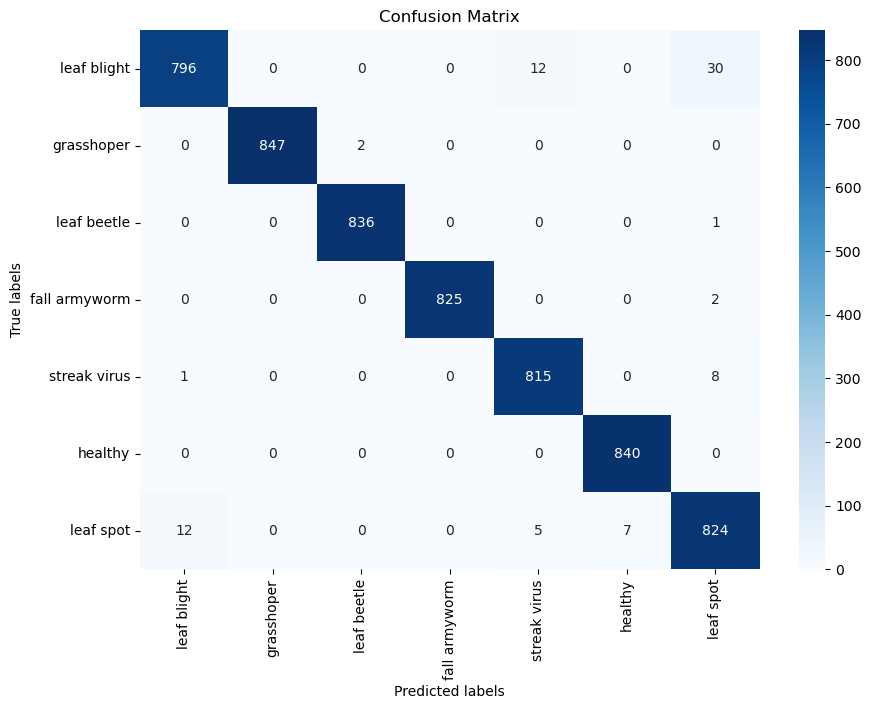

Confusion Matrix for Test Set:


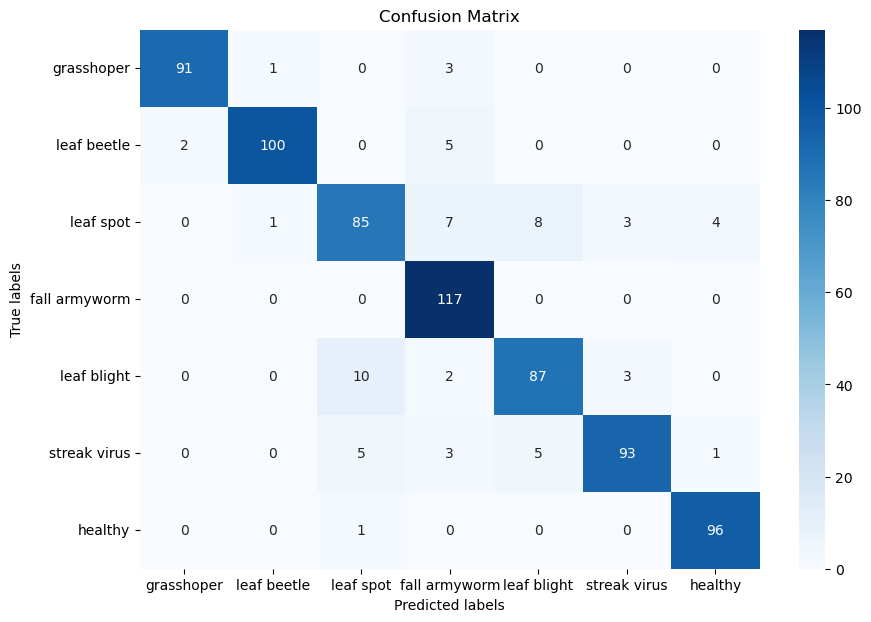

Confusion Matrix for Validation Set:


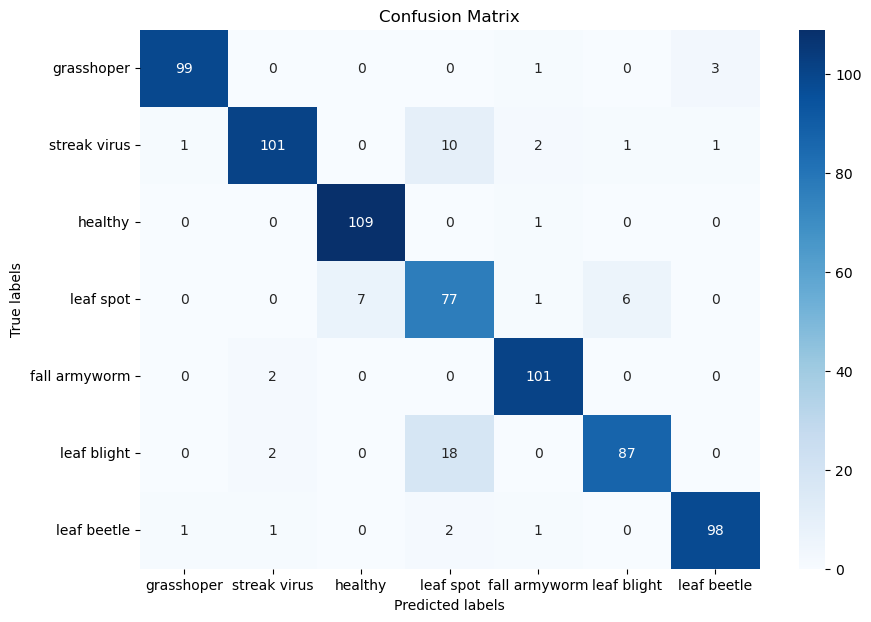

In [12]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.pipeline import make_pipeline
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import joblib


# Initialize StandardScaler
scaler = StandardScaler()

# Initialize SVM model with RBF kernel
svm_model = SVC(kernel='rbf', C=1, gamma='scale', decision_function_shape='ovo', class_weight='balanced')

# Create a pipeline that includes scaling and SVM
pipeline = make_pipeline(scaler, svm_model)

# Train the SVM model
pipeline.fit(X_train, y_train)

# Make predictions on the training set
y_pred_train = pipeline.predict(X_train)

# Make predictions on the test set
y_pred_test = pipeline.predict(X_test)

# Evaluate the model on the training set
accuracy_train = accuracy_score(y_train, y_pred_train)
print(f"Training set accuracy: {accuracy_train:.2f}")


# Print classification report for the training set
print("Classification Report for Training Set:")
print(classification_report(y_train, y_pred_train))

# Evaluate the model on the test set
accuracy_test = accuracy_score(y_test, y_pred_test)
print(f"Test set accuracy: {accuracy_test:.2f}")

# Print classification report for the test set
print("Classification Report for Test Set:")
print(classification_report(y_test, y_pred_test))

# Optionally, validate the model on the validation set
y_pred_val = pipeline.predict(X_validation)
val_accuracy = accuracy_score(y_validation, y_pred_val)
print(f"Validation set accuracy: {val_accuracy:.2f}")

# Print classification report for the validation set
print("Classification Report for Validation Set:")
print(classification_report(y_validation, y_pred_val))

# Save the trained model for future use
joblib.dump(pipeline, 'svm_model_rbf_pipeline.pkl')

print("Model saved as 'svm_model_rbf_pipeline.pkl'")

# Function to plot confusion matrix
def plot_confusion_matrix(y_true, y_pred, labels, title='Confusion Matrix'):
    cm = confusion_matrix(y_true, y_pred, labels=labels)
    plt.figure(figsize=(10, 7))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted labels')
    plt.ylabel('True labels')
    plt.title(title)
    plt.show()

# Plot confusion matrix for the training set
print("Confusion Matrix for Training Set:")
plot_confusion_matrix(y_train, y_pred_train, labels=y_train.unique())

# Plot confusion matrix for the test set
print("Confusion Matrix for Test Set:")
plot_confusion_matrix(y_test, y_pred_test, labels=y_test.unique())

# plot confusion matrix for the validation set
print("Confusion Matrix for Validation Set:")
plot_confusion_matrix(y_validation, y_pred_val, labels=y_validation.unique())


Plotting Learning Curves for the Best SVM Model


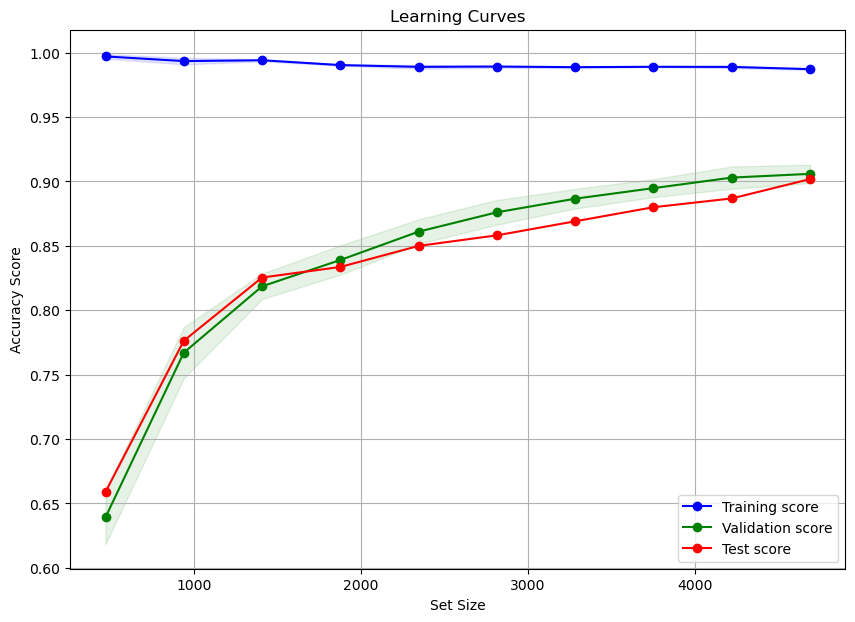

In [13]:
# Plot learning curves for training, validation, and test sets
def plot_learning_curves(estimator, X_train, y_train, X_test, y_test, title='Learning Curves'):
    train_sizes, train_scores, validation_scores = learning_curve(
        estimator, X_train, y_train, cv=5, scoring='accuracy', n_jobs=-1, train_sizes=np.linspace(0.1, 1.0, 10)
    )

    # Calculate mean and std for training and validation scores
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    validation_scores_mean = np.mean(validation_scores, axis=1)
    validation_scores_std = np.std(validation_scores, axis=1)

    # Evaluate the estimator on the test set for the different training sizes
    test_scores = []
    for train_size in train_sizes:
        estimator.fit(X_train[:int(train_size)], y_train[:int(train_size)])
        test_scores.append(estimator.score(X_test, y_test))
    test_scores = np.array(test_scores)

    # Plot learning curves
    plt.figure(figsize=(10, 7))
    plt.plot(train_sizes, train_scores_mean, 'o-', color='blue', label='Training score')
    plt.plot(train_sizes, validation_scores_mean, 'o-', color='green', label='Validation score')
    plt.plot(train_sizes, test_scores, 'o-', color='red', label='Test score')  # Test curve

    # Add shaded regions for standard deviation
    plt.fill_between(train_sizes, train_scores_mean - train_scores_std, train_scores_mean + train_scores_std, color='blue', alpha=0.1)
    plt.fill_between(train_sizes, validation_scores_mean - validation_scores_std, validation_scores_mean + validation_scores_std, color='green', alpha=0.1)

    # Plot test scores
    plt.title(title)
    plt.xlabel('Set Size')
    plt.ylabel('Accuracy Score')
    plt.legend(loc='best')
    plt.grid()
    plt.show()

# Plot learning curves for the best pipeline
print("Plotting Learning Curves for the Best SVM Model")
plot_learning_curves(pipeline, X_train, y_train, X_test, y_test)

### Findings
- The small drop between the training and test/validation accuracies suggests that the model is performing well but may still be slightly overfitted to the training data. 
- Since the test and validation accuracies are consistent, the model appears to generalize effectively, and its performance is stable on unseen data.

## HYPERPARAMETER TUNING THE SVM MODEL FOR EFFICIENTNETB0 IMAGE SIZE 224X224

Fitting 5 folds for each of 16 candidates, totalling 80 fits
Best parameters found:  {'svc__C': 1, 'svc__gamma': 0.001}
Training set accuracy: 0.96
Classification Report for Training Set:
               precision    recall  f1-score   support

fall armyworm       0.99      1.00      1.00       827
   grasshoper       1.00      0.99      0.99       849
      healthy       0.95      1.00      0.98       840
  leaf beetle       0.99      0.98      0.99       837
  leaf blight       0.95      0.90      0.93       838
    leaf spot       0.87      0.90      0.89       848
 streak virus       0.96      0.95      0.95       824

     accuracy                           0.96      5863
    macro avg       0.96      0.96      0.96      5863
 weighted avg       0.96      0.96      0.96      5863

Test set accuracy: 0.91
Classification Report for Test Set:
               precision    recall  f1-score   support

fall armyworm       0.97      0.99      0.98       117
   grasshoper       0.97      0.9

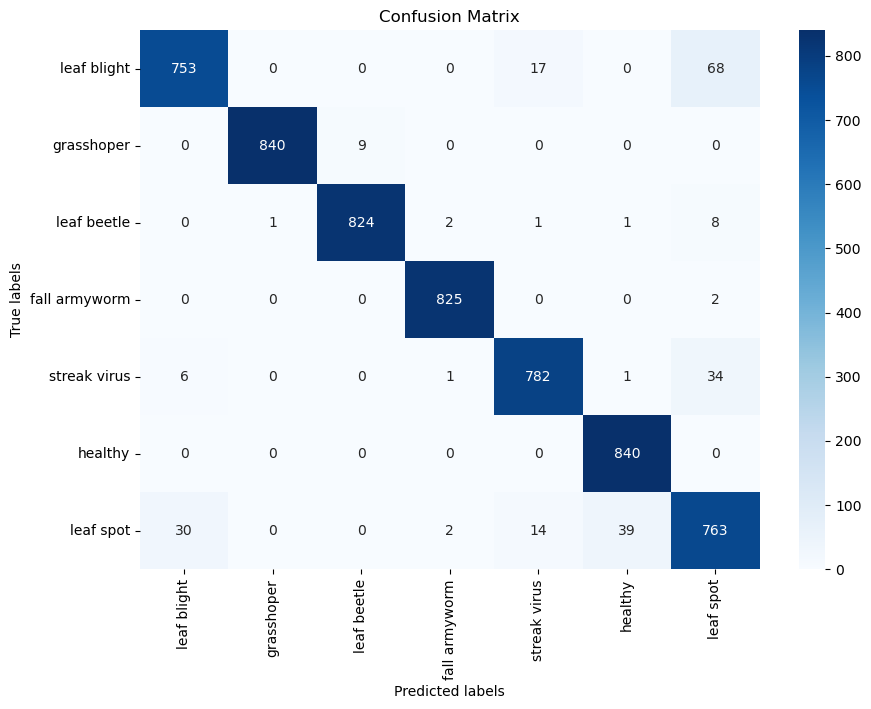

Training Set Evaluation:
Accuracy: 0.959747569503667
Precision: 0.960208176650683
Recall: 0.959747569503667
F1 Score: 0.9597373832527245
Confusion Matrix for Test Set:


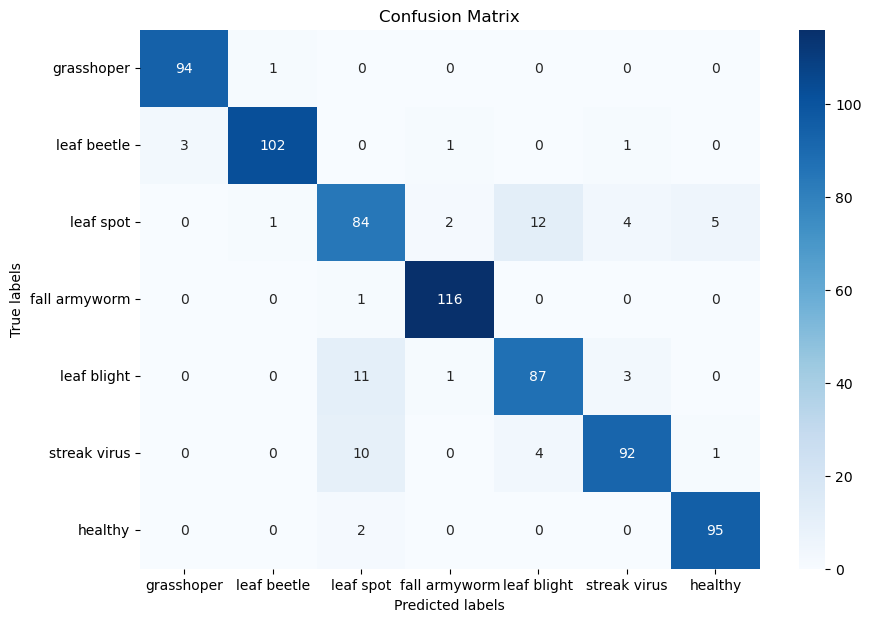

Test Set Evaluation:
Accuracy: 0.9140518417462483
Precision: 0.9139660667539048
Recall: 0.9140518417462483
F1 Score: 0.9137383967500613
Confusion Matrix for Validation Set:


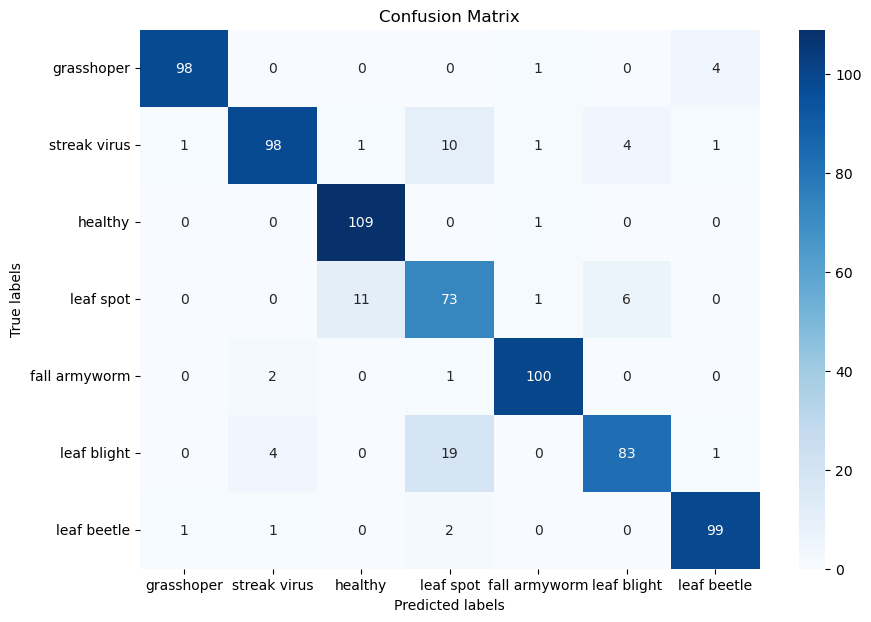

Validation Set Evaluation:
Accuracy: 0.9004092769440655
Precision: 0.9047907412454347
Recall: 0.9004092769440655
F1 Score: 0.9008135431749563
Plotting Learning Curves for the Best SVM Model


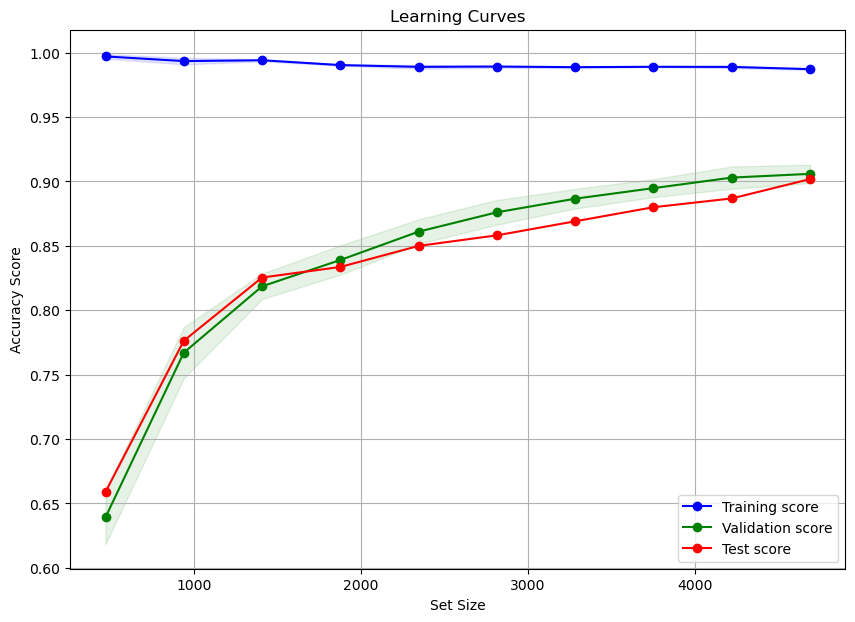

In [14]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.pipeline import make_pipeline
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix, precision_score, recall_score, f1_score
from sklearn.model_selection import GridSearchCV, learning_curve
import matplotlib.pyplot as plt
import seaborn as sns
import joblib
import numpy as np


# Initialize StandardScaler
scaler = StandardScaler()

# Initialize SVM model
svm_model = SVC(kernel ='rbf', decision_function_shape='ovo', class_weight='balanced')

# Create a pipeline that includes scaling and SVM
pipeline = make_pipeline(scaler, svm_model)

# Hyperparameter tuning with GridSearchCV
param_grid = {
    'svc__C': [0.001, 0.01,0.1,1],  # Regularization parameter
    'svc__gamma': [0.001, 0.01, 0.1, 1],  # Kernel coefficient
}

grid_search = GridSearchCV(pipeline, param_grid, cv=5, n_jobs=-1, verbose=1)
grid_search.fit(X_train, y_train)

# Best parameters from GridSearchCV
print("Best parameters found: ", grid_search.best_params_)

# Use the best estimator found by GridSearchCV
best_pipeline = grid_search.best_estimator_

# Make predictions on the training set
y_pred_train = best_pipeline.predict(X_train)

# Make predictions on the test set
y_pred_test = best_pipeline.predict(X_test)

# Evaluate the model on the training set
accuracy_train = accuracy_score(y_train, y_pred_train)
print(f"Training set accuracy: {accuracy_train:.2f}")

# Print classification report for the test set
print("Classification Report for Training Set:")
print(classification_report(y_train, y_pred_train))

# Evaluate the model on the test set
accuracy_test = accuracy_score(y_test, y_pred_test)
print(f"Test set accuracy: {accuracy_test:.2f}")

# Print classification report for the test set
print("Classification Report for Test Set:")
print(classification_report(y_test, y_pred_test))

# Optionally, validate the model on the validation set
y_pred_val = best_pipeline.predict(X_validation)
val_accuracy = accuracy_score(y_validation, y_pred_val)
print(f"Validation set accuracy: {val_accuracy:.2f}")

# Print classification report for the validation set
print("Classification Report for Validation Set:")
print(classification_report(y_validation, y_pred_val))

# Save the trained model for future use
joblib.dump(best_pipeline, 'svm_model_rbf_pipeline.pkl')
print("Model saved as 'svm_model_rbf_pipeline.pkl'")

# Function to plot confusion matrix
def plot_confusion_matrix(y_true, y_pred, labels, title='Confusion Matrix'):
    cm = confusion_matrix(y_true, y_pred, labels=labels)
    plt.figure(figsize=(10, 7))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted labels')
    plt.ylabel('True labels')
    plt.title(title)
    plt.show()

# Extended evaluation
def extended_evaluation(y_true, y_pred, labels):
    print("Accuracy:", accuracy_score(y_true, y_pred))
    print("Precision:", precision_score(y_true, y_pred, average='weighted', labels=labels))
    print("Recall:", recall_score(y_true, y_pred, average='weighted', labels=labels))
    print("F1 Score:", f1_score(y_true, y_pred, average='weighted', labels=labels))

# Plot confusion matrix for the training set
print("Confusion Matrix for Training Set:")
plot_confusion_matrix(y_train, y_pred_train, labels=y_train.unique())

# Evaluate training set
print("Training Set Evaluation:")
extended_evaluation(y_train, y_pred_train, labels=y_train.unique())

# Plot confusion matrix for the test set
print("Confusion Matrix for Test Set:")
plot_confusion_matrix(y_test, y_pred_test, labels=y_test.unique())

# Evaluate test set
print("Test Set Evaluation:")
extended_evaluation(y_test, y_pred_test, labels=y_test.unique())

# Plot confusion matrix for the validation set
print("Confusion Matrix for Validation Set:")
plot_confusion_matrix(y_validation, y_pred_val, labels=y_validation.unique())

# Evaluate validation set
print("Validation Set Evaluation:")
extended_evaluation(y_validation, y_pred_val, labels=y_validation.unique())

from sklearn.model_selection import learning_curve
import matplotlib.pyplot as plt
import numpy as np

# Plot learning curves for training, validation, and test sets
def plot_learning_curves(estimator, X_train, y_train, X_test, y_test, title='Learning Curves'):
    train_sizes, train_scores, validation_scores = learning_curve(
        estimator, X_train, y_train, cv=5, scoring='accuracy', n_jobs=-1, train_sizes=np.linspace(0.1, 1.0, 10)
    )

    # Calculate mean and std for training and validation scores
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    validation_scores_mean = np.mean(validation_scores, axis=1)
    validation_scores_std = np.std(validation_scores, axis=1)

    # Evaluate the estimator on the test set for the different training sizes
    test_scores = []
    for train_size in train_sizes:
        estimator.fit(X_train[:int(train_size)], y_train[:int(train_size)])
        test_scores.append(estimator.score(X_test, y_test))
    test_scores = np.array(test_scores)

    # Plot learning curves
    plt.figure(figsize=(10, 7))
    plt.plot(train_sizes, train_scores_mean, 'o-', color='blue', label='Training score')
    plt.plot(train_sizes, validation_scores_mean, 'o-', color='green', label='Validation score')
    plt.plot(train_sizes, test_scores, 'o-', color='red', label='Test score')  # Test curve

    # Add shaded regions for standard deviation
    plt.fill_between(train_sizes, train_scores_mean - train_scores_std, train_scores_mean + train_scores_std, color='blue', alpha=0.1)
    plt.fill_between(train_sizes, validation_scores_mean - validation_scores_std, validation_scores_mean + validation_scores_std, color='green', alpha=0.1)

    # Plot test scores
    plt.title(title)
    plt.xlabel('Set Size')
    plt.ylabel('Accuracy Score')
    plt.legend(loc='best')
    plt.grid()
    plt.show()

# Plot learning curves for the best pipeline
print("Plotting Learning Curves for the Best SVM Model")
plot_learning_curves(pipeline, X_train, y_train, X_test, y_test)


# MODEL 2: INCEPTIONV3 IMAGE SIZE 299X299

In [15]:
inceptionv3_df.head(5)

,0,1,2,3,4,5,6,7,8,9,...,525,526,527,528,529,530,531,532,533,label
0,2.674834,-1.048231,-3.300775,-4.424252,-0.240277,-0.554860,0.513963,1.003213,0.942153,-1.214821,...,-0.163176,0.050203,0.036631,0.125799,0.140706,-0.235751,-0.165124,-0.133340,-0.089290,fall armyworm
1,0.216014,-1.134929,-2.866783,-5.303535,-1.179029,-0.010573,1.495479,0.150148,1.638874,1.454262,...,0.016192,0.098345,0.053684,0.055336,0.080271,-0.076350,-0.120445,0.096754,0.144496,fall armyworm
2,3.040543,-2.812512,-4.510812,-1.384765,-0.082034,-0.380216,0.847802,1.155809,0.420977,-1.291425,...,0.124525,0.080862,0.146254,0.166782,-0.187375,-0.001148,0.010032,-0.030275,-0.069186,fall armyworm
3,-1.394435,-0.878762,-1.630249,-5.129542,-3.819664,0.964793,-0.499764,-0.048635,0.833204,2.218945,...,0.224869,0.016571,-0.177652,-0.202053,0.161276,-0.096207,-0.148600,0.195547,0.119450,fall armyworm
4,-0.248509,-0.528676,-3.645774,-2.999512,-2.227855,0.436413,-1.646812,0.355008,0.737893,0.190815,...,0.019969,-0.190468,-0.152032,0.002589,0.093553,0.190169,-0.033846,0.104533,0.101786,fall armyworm


In [16]:
#Count the labels
counts = inceptionv3_df['label'].value_counts()
counts

fall armyworm    1047
grasshoper       1047
healthy          1047
leaf beetle      1047
leaf blight      1047
leaf spot        1047
streak virus     1047
Name: label, dtype: int64

In [17]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder

# Initialize Label Encoder
label_encoder = LabelEncoder()

# Apply label encoding to the 'label' column
inceptionv3_df['label_encoded'] = label_encoder.fit_transform(inceptionv3_df['label'])

In [18]:
import pandas as pd
from sklearn.model_selection import train_test_split

# Define the datasets sizes
train_size = 0.8  # 80% for the training set
test_size = 0.10   # 10% for the test set
validation_size = 0.10  # 10% for the validation set

# Step 1: Shuffle and split the data into training (80%) and temporary (20%) sets
train_df, temp_df = train_test_split(inceptionv3_df, test_size=(1 - train_size), random_state=42, shuffle=True)

# Step 2: Further split the temporary set into test (10%) and validation (10%) sets
test_df, validation_df = train_test_split(temp_df, test_size=(validation_size / (test_size + validation_size)), random_state=42, shuffle=True)

# Print the size of each set to verify
print(f"Training set size: {len(train_df)} samples")
print(f"Test set size: {len(test_df)} samples")
print(f"Validation set size: {len(validation_df)} samples")


Training set size: 5863 samples
Test set size: 733 samples
Validation set size: 733 samples


In [19]:
# Extract features and labels
X_train = train_df.drop(columns=['label', 'label_encoded'])
y_train = train_df['label']
X_test = test_df.drop(columns=['label', 'label_encoded'])
y_test = test_df['label']
X_validation = validation_df.drop(columns=['label', 'label_encoded'])
y_validation = validation_df['label']

Training set accuracy: 0.98
Classification Report for Training Set:
               precision    recall  f1-score   support

fall armyworm       1.00      1.00      1.00       827
   grasshoper       1.00      1.00      1.00       849
      healthy       0.99      1.00      1.00       840
  leaf beetle       1.00      1.00      1.00       837
  leaf blight       0.98      0.95      0.96       838
    leaf spot       0.95      0.97      0.96       848
 streak virus       0.98      0.98      0.98       824

     accuracy                           0.98      5863
    macro avg       0.98      0.98      0.98      5863
 weighted avg       0.98      0.98      0.98      5863

Test set accuracy: 0.89
Classification Report for Test Set:
               precision    recall  f1-score   support

fall armyworm       0.85      0.98      0.91       117
   grasshoper       1.00      0.91      0.95        95
      healthy       0.91      0.99      0.95        97
  leaf beetle       0.97      0.95      0.9

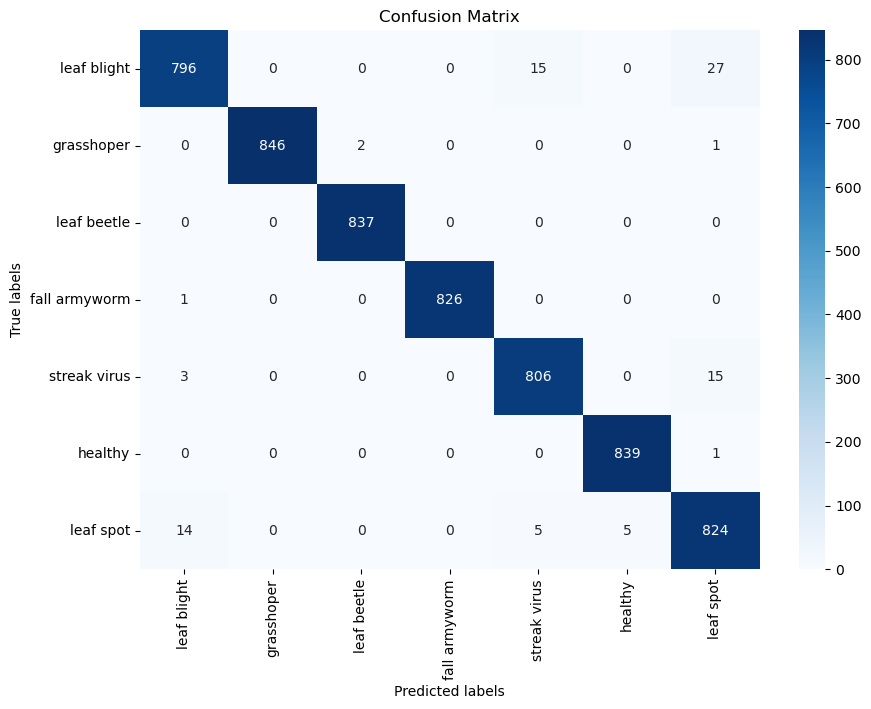

Confusion Matrix for Test Set:


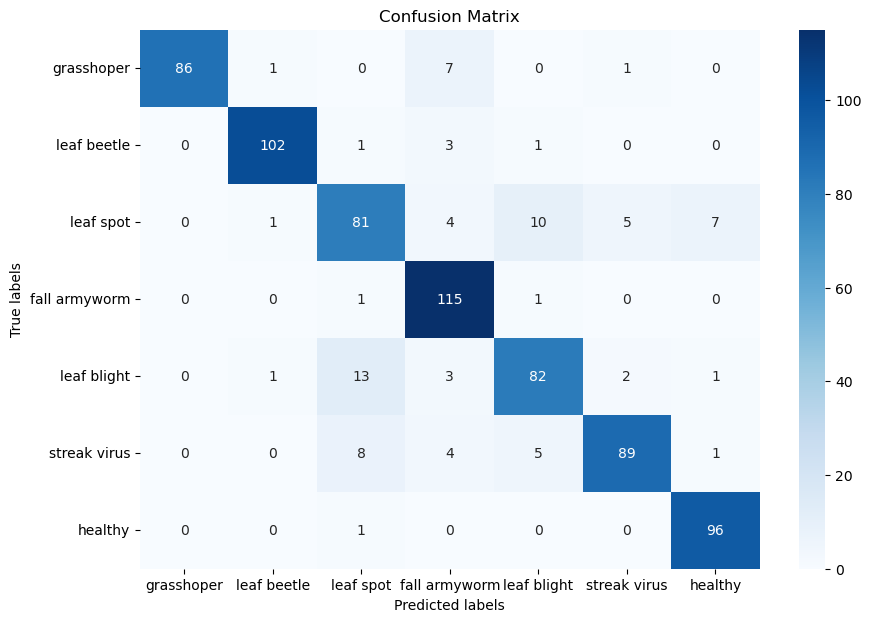

Confusion Matrix for Validation Set:


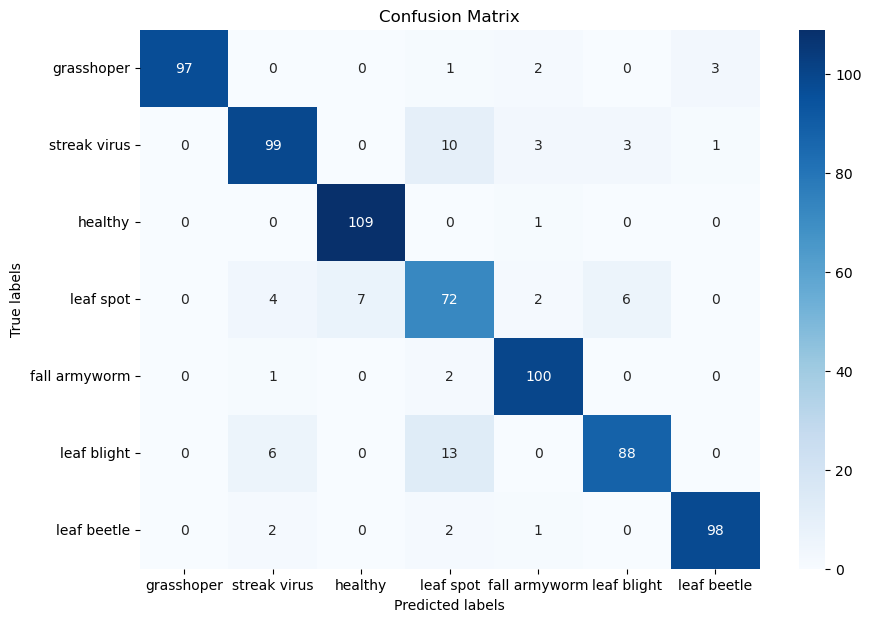

Plotting Learning Curves for the Best SVM Model


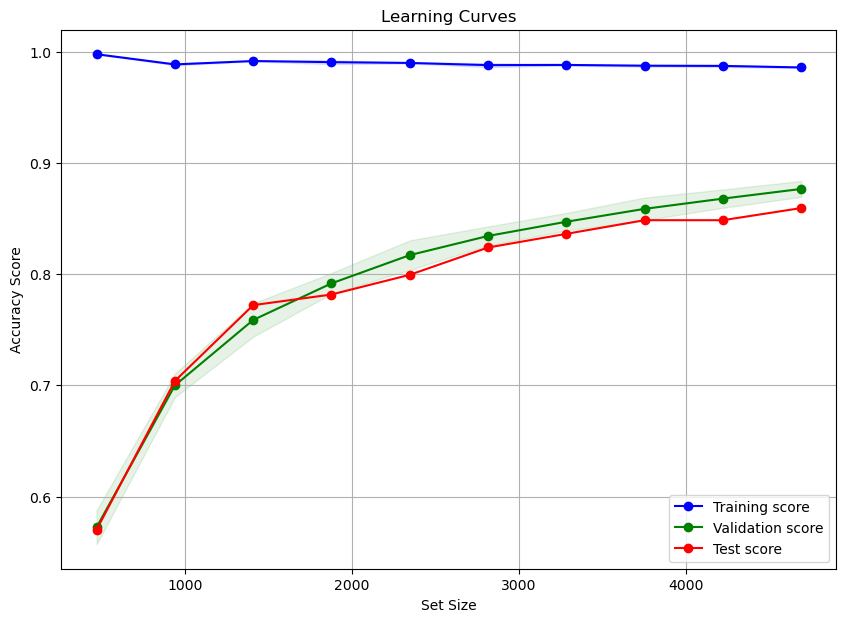

In [20]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.pipeline import make_pipeline
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import joblib


# Initialize StandardScaler
scaler = StandardScaler()

# Initialize SVM model with RBF kernel
svm_model = SVC(kernel='rbf', C=1, gamma='scale', decision_function_shape='ovo', class_weight='balanced')

# Create a pipeline that includes scaling and SVM
pipeline = make_pipeline(scaler, svm_model)

# Train the SVM model
pipeline.fit(X_train, y_train)

# Make predictions on the training set
y_pred_train = pipeline.predict(X_train)

# Make predictions on the test set
y_pred_test = pipeline.predict(X_test)

# Evaluate the model on the training set
accuracy_train = accuracy_score(y_train, y_pred_train)
print(f"Training set accuracy: {accuracy_train:.2f}")

# Print classification report for the training set
print("Classification Report for Training Set:")
print(classification_report(y_train, y_pred_train))

# Evaluate the model on the test set
accuracy_test = accuracy_score(y_test, y_pred_test)
print(f"Test set accuracy: {accuracy_test:.2f}")

# Print classification report for the test set
print("Classification Report for Test Set:")
print(classification_report(y_test, y_pred_test))

# Validate the model on the validation set
y_pred_val = pipeline.predict(X_validation)
val_accuracy = accuracy_score(y_validation, y_pred_val)
print(f"Validation set accuracy: {val_accuracy:.2f}")

# Print classification report for the validation set
print("Classification Report for Validation Set:")
print(classification_report(y_validation, y_pred_val))

# Save the trained model for future use
joblib.dump(pipeline, 'svm_model_rbf_pipeline.pkl')

print("Model saved as 'svm_model_rbf_pipeline.pkl'")

# Function to plot confusion matrix
def plot_confusion_matrix(y_true, y_pred, labels, title='Confusion Matrix'):
    cm = confusion_matrix(y_true, y_pred, labels=labels)
    plt.figure(figsize=(10, 7))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted labels')
    plt.ylabel('True labels')
    plt.title(title)
    plt.show()

# Plot confusion matrix for the training set
print("Confusion Matrix for Training Set:")
plot_confusion_matrix(y_train, y_pred_train, labels=y_train.unique())

# Plot confusion matrix for the test set
print("Confusion Matrix for Test Set:")
plot_confusion_matrix(y_test, y_pred_test, labels=y_test.unique())

# Plot confusion matrix for the validation set
print("Confusion Matrix for Validation Set:")
plot_confusion_matrix(y_validation, y_pred_val, labels=y_validation.unique())

# Plot learning curves for training, validation, and test sets
def plot_learning_curves(estimator, X_train, y_train, X_test, y_test, title='Learning Curves'):
    train_sizes, train_scores, validation_scores = learning_curve(
        estimator, X_train, y_train, cv=5, scoring='accuracy', n_jobs=-1, train_sizes=np.linspace(0.1, 1.0, 10)
    )

    # Calculate mean and std for training and validation scores
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    validation_scores_mean = np.mean(validation_scores, axis=1)
    validation_scores_std = np.std(validation_scores, axis=1)

    # Evaluate the estimator on the test set for the different training sizes
    test_scores = []
    for train_size in train_sizes:
        estimator.fit(X_train[:int(train_size)], y_train[:int(train_size)])
        test_scores.append(estimator.score(X_test, y_test))
    test_scores = np.array(test_scores)

    # Plot learning curves
    plt.figure(figsize=(10, 7))
    plt.plot(train_sizes, train_scores_mean, 'o-', color='blue', label='Training score')
    plt.plot(train_sizes, validation_scores_mean, 'o-', color='green', label='Validation score')
    plt.plot(train_sizes, test_scores, 'o-', color='red', label='Test score')  # Test curve

    # Add shaded regions for standard deviation
    plt.fill_between(train_sizes, train_scores_mean - train_scores_std, train_scores_mean + train_scores_std, color='blue', alpha=0.1)
    plt.fill_between(train_sizes, validation_scores_mean - validation_scores_std, validation_scores_mean + validation_scores_std, color='green', alpha=0.1)

    # Plot test scores
    plt.title(title)
    plt.xlabel('Set Size')
    plt.ylabel('Accuracy Score')
    plt.legend(loc='best')
    plt.grid()
    plt.show()

# Plot learning curves for the best pipeline
print("Plotting Learning Curves for the Best SVM Model")
plot_learning_curves(pipeline, X_train, y_train, X_test, y_test)

# Hyperparameter Tuning InceptionV3

Fitting 5 folds for each of 42 candidates, totalling 210 fits
Best parameters found:  {'svc__C': 1, 'svc__gamma': 0.001, 'svc__kernel': 'rbf'}
Training set accuracy: 0.96
Classification Report for Training Set:
               precision    recall  f1-score   support

fall armyworm       1.00      1.00      1.00       827
   grasshoper       1.00      0.99      0.99       849
      healthy       0.96      1.00      0.98       840
  leaf beetle       0.99      0.99      0.99       837
  leaf blight       0.95      0.91      0.93       838
    leaf spot       0.88      0.91      0.90       848
 streak virus       0.96      0.95      0.95       824

     accuracy                           0.96      5863
    macro avg       0.96      0.96      0.96      5863
 weighted avg       0.96      0.96      0.96      5863

Test set accuracy: 0.89
Classification Report for Test Set:
               precision    recall  f1-score   support

fall armyworm       0.95      0.98      0.97       117
   grassho

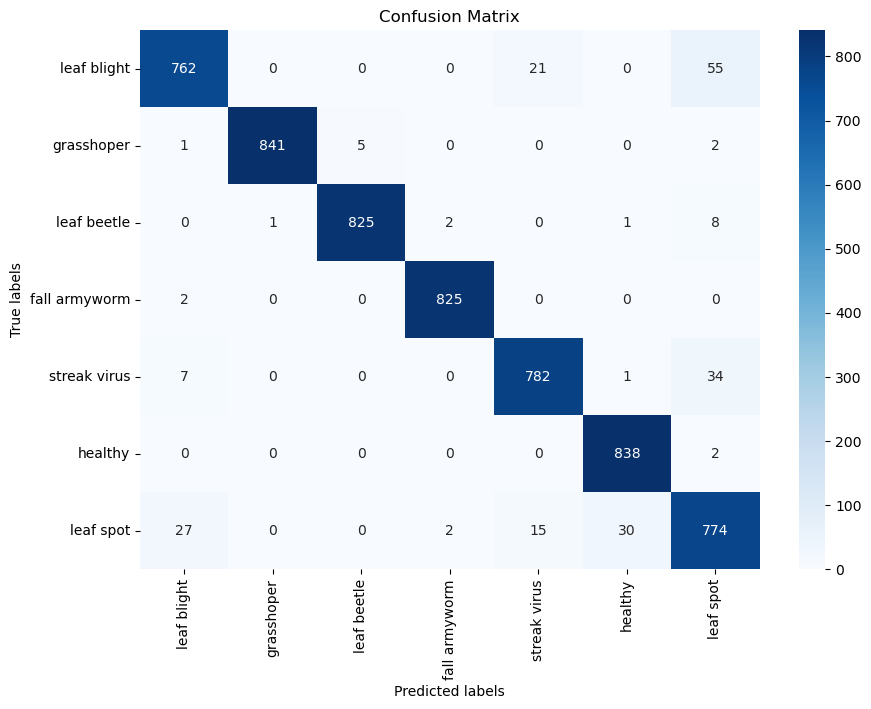

Training Set Evaluation:
Accuracy: 0.9631587924270851
Precision: 0.9635185266045352
Recall: 0.9631587924270851
F1 Score: 0.9631809882094028
Confusion Matrix for Test Set:


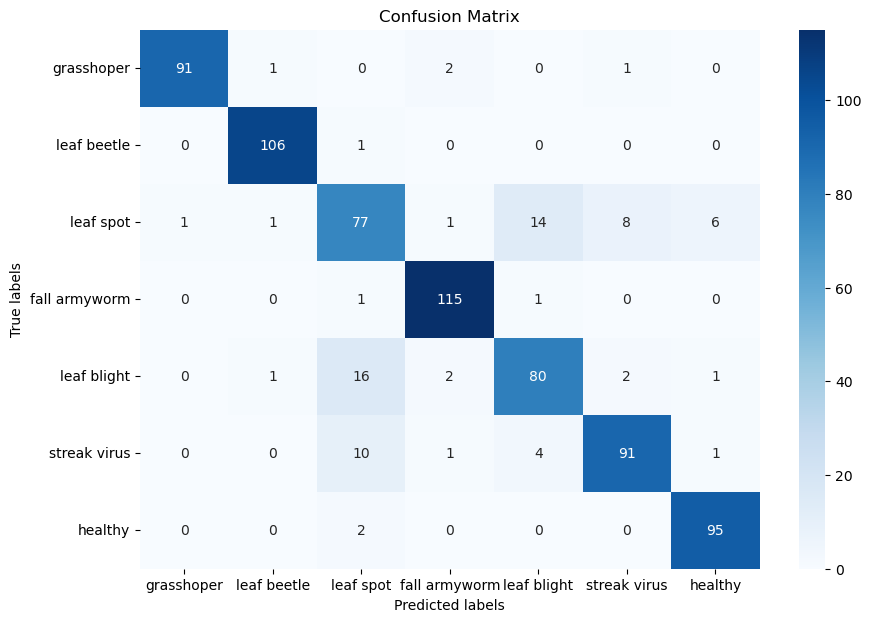

Test Set Evaluation:
Accuracy: 0.8935879945429741
Precision: 0.8926213596275764
Recall: 0.8935879945429741
F1 Score: 0.892803330608262
Confusion Matrix for Validation Set:


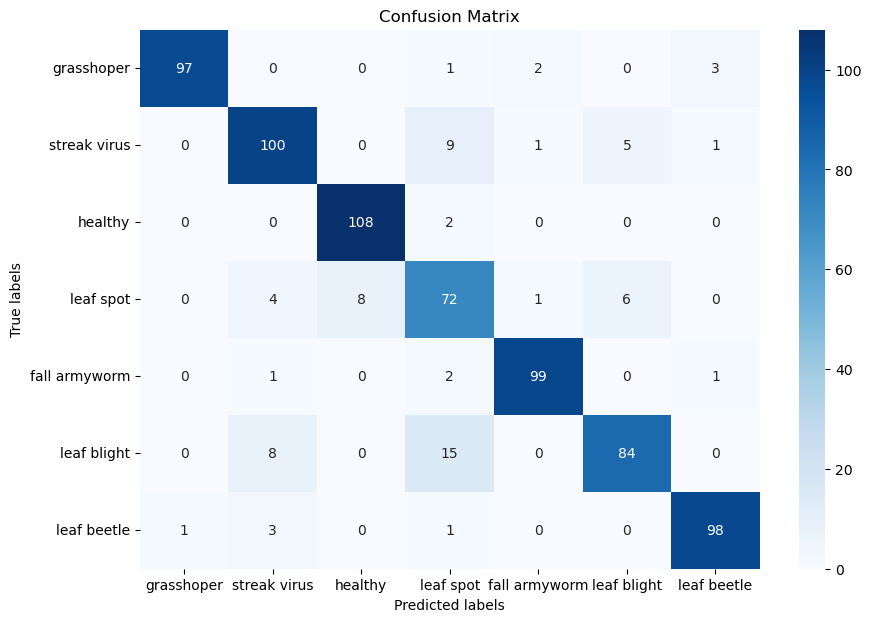

Validation Set Evaluation:
Accuracy: 0.897680763983629
Precision: 0.9006938514716528
Recall: 0.897680763983629
F1 Score: 0.8982703284489915
Plotting Learning Curves for the Best SVM Model


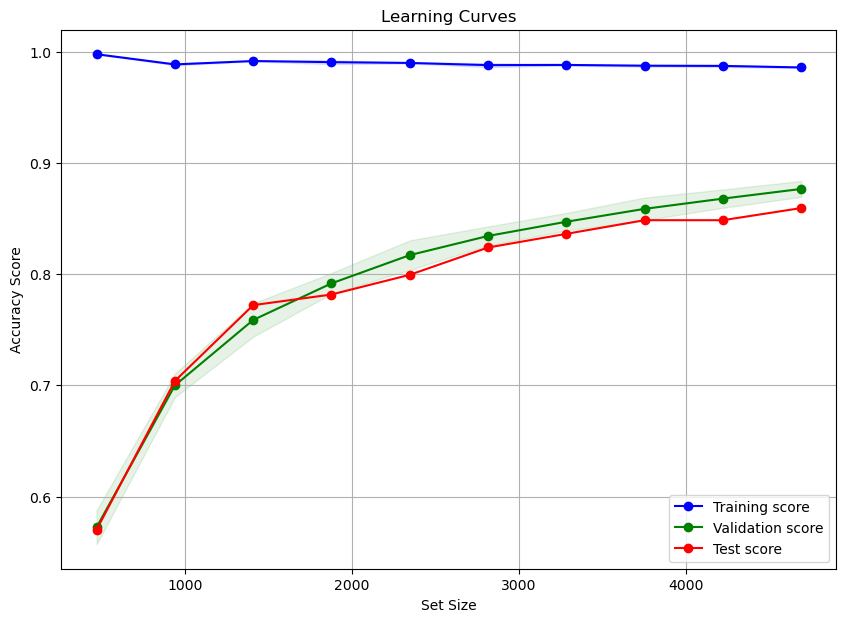

In [21]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.pipeline import make_pipeline
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix, precision_score, recall_score, f1_score
from sklearn.model_selection import GridSearchCV, learning_curve
import matplotlib.pyplot as plt
import seaborn as sns
import joblib
import numpy as np


# Initialize StandardScaler
scaler = StandardScaler()

# Initialize SVM model
svm_model = SVC(decision_function_shape='ovo', class_weight='balanced')

# Create a pipeline that includes scaling and SVM
pipeline = make_pipeline(scaler, svm_model)

# Hyperparameter tuning with GridSearchCV
param_grid = {
    'svc__C': [0.00001,0.0001, 0.001,0.1, 0.9,0.8,1],
    'svc__gamma': [0.001, 0.01, 0.1, 1, 'scale', 'auto'],
    'svc__kernel': ['rbf']
}


grid_search = GridSearchCV(pipeline, param_grid, cv=5, n_jobs=-1, verbose=1)
grid_search.fit(X_train, y_train)

# Best parameters from GridSearchCV
print("Best parameters found: ", grid_search.best_params_)

# Use the best estimator found by GridSearchCV
best_pipeline = grid_search.best_estimator_

# Make predictions on the training set
y_pred_train = best_pipeline.predict(X_train)

# Make predictions on the test set
y_pred_test = best_pipeline.predict(X_test)

# Evaluate the model on the training set
accuracy_train = accuracy_score(y_train, y_pred_train)
print(f"Training set accuracy: {accuracy_train:.2f}")

# Print classification report for the training set
print("Classification Report for Training Set:")
print(classification_report(y_train, y_pred_train))

# Evaluate the model on the test set
accuracy_test = accuracy_score(y_test, y_pred_test)
print(f"Test set accuracy: {accuracy_test:.2f}")

# Print classification report for the test set
print("Classification Report for Test Set:")
print(classification_report(y_test, y_pred_test))

# Validate the model on the validation set
y_pred_val = best_pipeline.predict(X_validation)
val_accuracy = accuracy_score(y_validation, y_pred_val)
print(f"Validation set accuracy: {val_accuracy:.2f}")

# Print classification report for the validation set
print("Classification Report for Validation Set:")
print(classification_report(y_validation, y_pred_val))

# Save the trained model for future use
joblib.dump(best_pipeline, 'svm_model_rbf_pipeline.pkl')
print("Model saved as 'svm_model_rbf_pipeline.pkl'")

# Function to plot confusion matrix
def plot_confusion_matrix(y_true, y_pred, labels, title='Confusion Matrix'):
    cm = confusion_matrix(y_true, y_pred, labels=labels)
    plt.figure(figsize=(10, 7))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted labels')
    plt.ylabel('True labels')
    plt.title(title)
    plt.show()

# Extended evaluation
def extended_evaluation(y_true, y_pred, labels):
    print("Accuracy:", accuracy_score(y_true, y_pred))
    print("Precision:", precision_score(y_true, y_pred, average='weighted', labels=labels))
    print("Recall:", recall_score(y_true, y_pred, average='weighted', labels=labels))
    print("F1 Score:", f1_score(y_true, y_pred, average='weighted', labels=labels))

# Plot confusion matrix for the training set
print("Confusion Matrix for Training Set:")
plot_confusion_matrix(y_train, y_pred_train, labels=y_train.unique())

# Evaluate training set
print("Training Set Evaluation:")
extended_evaluation(y_train, y_pred_train, labels=y_train.unique())

# Plot confusion matrix for the test set
print("Confusion Matrix for Test Set:")
plot_confusion_matrix(y_test, y_pred_test, labels=y_test.unique())

# Evaluate test set
print("Test Set Evaluation:")
extended_evaluation(y_test, y_pred_test, labels=y_test.unique())

# Plot confusion matrix for the validation set
print("Confusion Matrix for Validation Set:")
plot_confusion_matrix(y_validation, y_pred_val, labels=y_validation.unique())

# Evaluate validation set
print("Validation Set Evaluation:")
extended_evaluation(y_validation, y_pred_val, labels=y_validation.unique())

# Plot learning curves for training, validation, and test sets
def plot_learning_curves(estimator, X_train, y_train, X_test, y_test, title='Learning Curves'):
    train_sizes, train_scores, validation_scores = learning_curve(
        estimator, X_train, y_train, cv=5, scoring='accuracy', n_jobs=-1, train_sizes=np.linspace(0.1, 1.0, 10)
    )

    # Calculate mean and std for training and validation scores
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    validation_scores_mean = np.mean(validation_scores, axis=1)
    validation_scores_std = np.std(validation_scores, axis=1)

    # Evaluate the estimator on the test set for the different training sizes
    test_scores = []
    for train_size in train_sizes:
        estimator.fit(X_train[:int(train_size)], y_train[:int(train_size)])
        test_scores.append(estimator.score(X_test, y_test))
    test_scores = np.array(test_scores)

    # Plot learning curves
    plt.figure(figsize=(10, 7))
    plt.plot(train_sizes, train_scores_mean, 'o-', color='blue', label='Training score')
    plt.plot(train_sizes, validation_scores_mean, 'o-', color='green', label='Validation score')
    plt.plot(train_sizes, test_scores, 'o-', color='red', label='Test score')  # Test curve

    # Add shaded regions for standard deviation
    plt.fill_between(train_sizes, train_scores_mean - train_scores_std, train_scores_mean + train_scores_std, color='blue', alpha=0.1)
    plt.fill_between(train_sizes, validation_scores_mean - validation_scores_std, validation_scores_mean + validation_scores_std, color='green', alpha=0.1)

    # Plot test scores
    plt.title(title)
    plt.xlabel('Set Size')
    plt.ylabel('Accuracy Score')
    plt.legend(loc='best')
    plt.grid()
    plt.show()

# Plot learning curves for the best pipeline
print("Plotting Learning Curves for the Best SVM Model")
plot_learning_curves(pipeline, X_train, y_train, X_test, y_test)

# Model 3: EFFICIENTNETBO IMAGE SIZE 299X299

In [22]:
efficient299_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7329 entries, 0 to 7328
Columns: 407 entries, 0 to label
dtypes: float64(406), object(1)
memory usage: 22.8+ MB


In [23]:
#Count the labels
counts = efficient299_df['label'].value_counts()
counts

fall armyworm    1047
grasshoper       1047
healthy          1047
leaf beetle      1047
leaf blight      1047
leaf spot        1047
streak virus     1047
Name: label, dtype: int64

In [24]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder

# Initialize Label Encoder
label_encoder = LabelEncoder()

# Apply label encoding to the 'label' column
efficient299_df['label_encoded'] = label_encoder.fit_transform(efficient299_df['label'])

print(efficient299_df.head(5))

          0         1         2         3         4         5         6  \
0 -1.208677 -3.476818 -2.168168  1.806489  0.320026 -1.030428 -1.255367   
1 -1.482006 -3.494924 -1.844526  1.005938  0.812895 -0.740629 -0.602426   
2 -1.076653 -4.004863 -1.469786  2.457078 -0.528222 -1.595309 -0.060314   
3  0.569669 -1.295131 -0.868243 -0.388289  1.635217  0.304171  3.538901   
4  1.327467 -3.487233 -1.145230  0.954436  0.938742 -0.029059  1.804669   

          7         8         9  ...       398       399       400       401  \
0  0.555024  0.540758  0.118577  ...  0.054788  0.052629  0.045239  0.018231   
1  0.669106  0.273010 -0.129150  ... -0.059967  0.131406  0.010744  0.024978   
2  0.333911  1.120532  0.784080  ...  0.022455  0.036596 -0.076377  0.022317   
3  1.105425  0.749716  2.042618  ...  0.167421  0.012259 -0.006548 -0.243189   
4  1.447836  0.357232  1.751617  ... -0.127204 -0.094993  0.167907 -0.056042   

        402       403       404       405          label  label_enco

In [25]:
import pandas as pd
from sklearn.model_selection import train_test_split

# Define the dataset sizes
train_size = 0.8  # 80% for the training set
test_size = 0.1   # 10% for the test set
validation_size = 0.1  # 10% for the validation set

# Step 1: Shuffle and split the data into training (80%) and temporary (20%) sets
train_df, temp_df = train_test_split(efficient299_df, test_size=(1 - train_size), random_state=42, shuffle=True)

# Step 2: Further split the temporary set into test (10%) and validation (10%) sets
test_df, validation_df = train_test_split(temp_df, test_size=(validation_size / (test_size + validation_size)), random_state=42, shuffle=True)

# Print the size of each set to verify
print(f"Training set size: {len(train_df)} samples")
print(f"Test set size: {len(test_df)} samples")
print(f"Validation set size: {len(validation_df)} samples")


Training set size: 5863 samples
Test set size: 733 samples
Validation set size: 733 samples


In [26]:
# Extract features and labels
X_train = train_df.drop(columns=['label'])
y_train = train_df['label']
X_test = test_df.drop(columns=['label'])
y_test = test_df['label']
X_validation = validation_df.drop(columns=['label'])
y_validation = validation_df['label']

Training set accuracy: 0.99
Classification Report for Training Set:
               precision    recall  f1-score   support

fall armyworm       1.00      1.00      1.00       827
   grasshoper       1.00      1.00      1.00       849
      healthy       1.00      1.00      1.00       840
  leaf beetle       1.00      1.00      1.00       837
  leaf blight       0.99      0.97      0.98       838
    leaf spot       0.97      0.98      0.97       848
 streak virus       0.99      0.99      0.99       824

     accuracy                           0.99      5863
    macro avg       0.99      0.99      0.99      5863
 weighted avg       0.99      0.99      0.99      5863

Test set accuracy: 0.93
Classification Report for Test Set:
               precision    recall  f1-score   support

fall armyworm       0.92      1.00      0.96       117
   grasshoper       0.98      0.96      0.97        95
      healthy       0.98      1.00      0.99        97
  leaf beetle       1.00      0.96      0.9

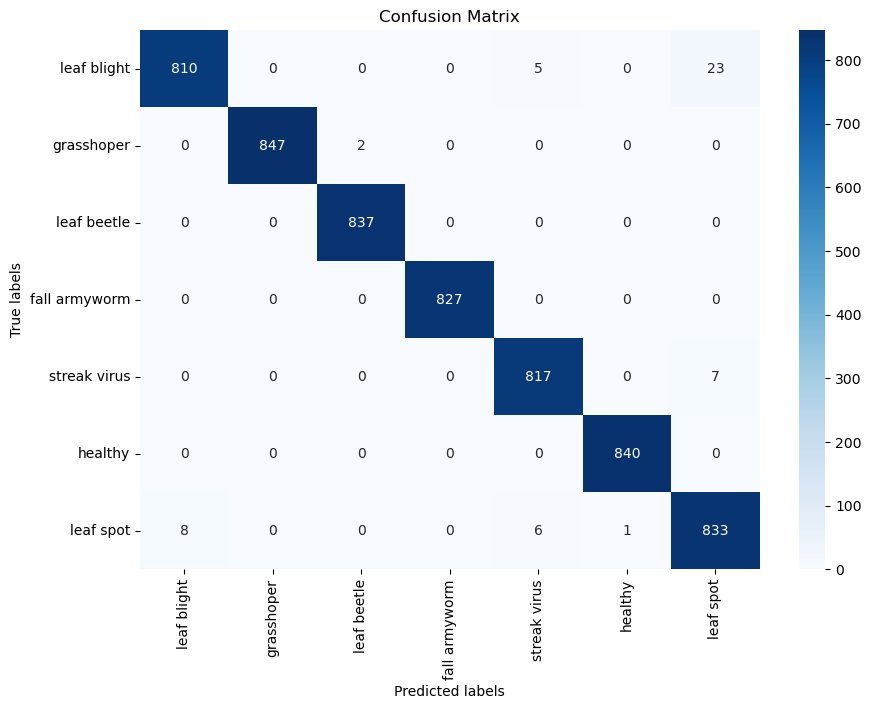

Confusion Matrix for Test Set:


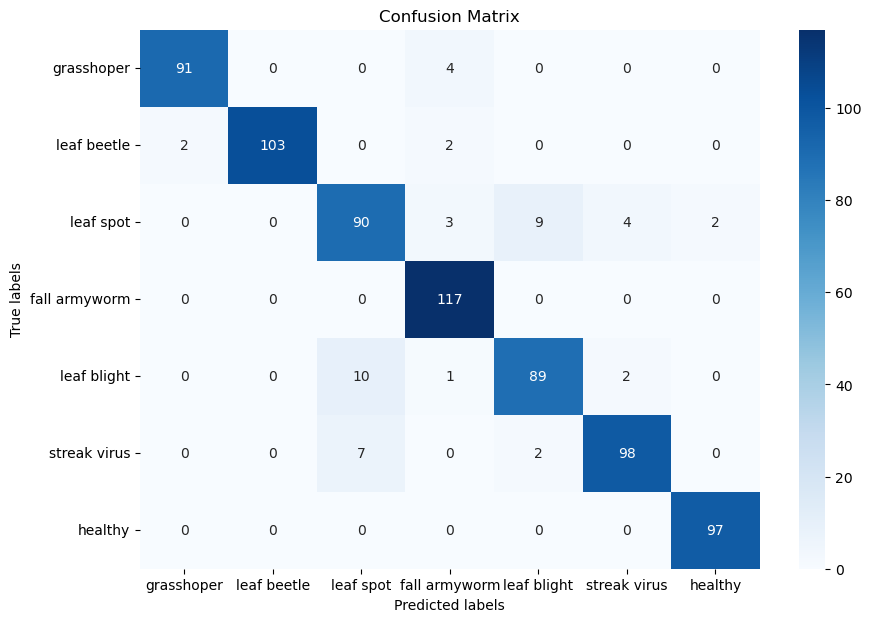

Confusion Matrix for Validation Set:


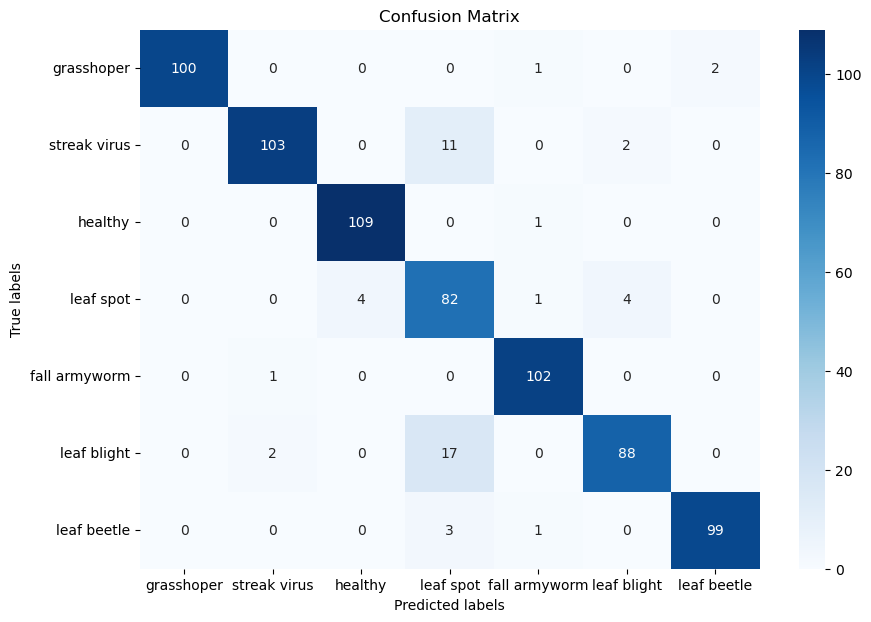

Plotting Learning Curves for the Best SVM Model


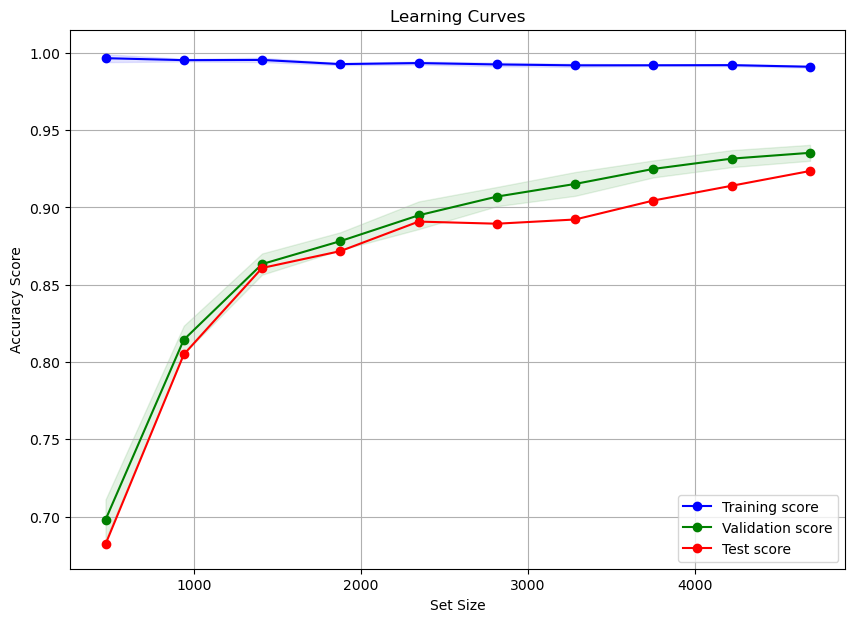

In [27]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.pipeline import make_pipeline
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import joblib


# Initialize StandardScaler
scaler = StandardScaler()

# Initialize SVM model with RBF kernel
svm_model = SVC(kernel='rbf', C=1, gamma='scale', decision_function_shape='ovo', class_weight='balanced')

# Create a pipeline that includes scaling and SVM
pipeline = make_pipeline(scaler, svm_model)

# Train the SVM model
pipeline.fit(X_train, y_train)

# Make predictions on the training set
y_pred_train = pipeline.predict(X_train)

# Make predictions on the test set
y_pred_test = pipeline.predict(X_test)

# Evaluate the model on the training set
accuracy_train = accuracy_score(y_train, y_pred_train)
print(f"Training set accuracy: {accuracy_train:.2f}")

# Print classification report for the training set
print("Classification Report for Training Set:")
print(classification_report(y_train, y_pred_train))

# Evaluate the model on the test set
accuracy_test = accuracy_score(y_test, y_pred_test)
print(f"Test set accuracy: {accuracy_test:.2f}")

# Print classification report for the test set
print("Classification Report for Test Set:")
print(classification_report(y_test, y_pred_test))

# Validate the model on the validation set
y_pred_val = pipeline.predict(X_validation)
val_accuracy = accuracy_score(y_validation, y_pred_val)
print(f"Validation set accuracy: {val_accuracy:.2f}")

# Print classification report for the validation set
print("Classification Report for Validation Set:")
print(classification_report(y_validation, y_pred_val))

# Save the trained model for future use
joblib.dump(pipeline, 'svm_model_rbf_pipeline.pkl')

print("Model saved as 'svm_model_rbf_pipeline.pkl'")

# Function to plot confusion matrix
def plot_confusion_matrix(y_true, y_pred, labels, title='Confusion Matrix'):
    cm = confusion_matrix(y_true, y_pred, labels=labels)
    plt.figure(figsize=(10, 7))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted labels')
    plt.ylabel('True labels')
    plt.title(title)
    plt.show()

# Plot confusion matrix for the training set
print("Confusion Matrix for Training Set:")
plot_confusion_matrix(y_train, y_pred_train, labels=y_train.unique())

# Plot confusion matrix for the test set
print("Confusion Matrix for Test Set:")
plot_confusion_matrix(y_test, y_pred_test, labels=y_test.unique())

# Optionally, plot confusion matrix for the validation set
print("Confusion Matrix for Validation Set:")
plot_confusion_matrix(y_validation, y_pred_val, labels=y_validation.unique())

# Plot learning curves for training, validation, and test sets
def plot_learning_curves(estimator, X_train, y_train, X_test, y_test, title='Learning Curves'):
    train_sizes, train_scores, validation_scores = learning_curve(
        estimator, X_train, y_train, cv=5, scoring='accuracy', n_jobs=-1, train_sizes=np.linspace(0.1, 1.0, 10)
    )

    # Calculate mean and std for training and validation scores
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    validation_scores_mean = np.mean(validation_scores, axis=1)
    validation_scores_std = np.std(validation_scores, axis=1)

    #Evaluate the estimator on the test set for the different training sizes
    test_scores = []
    for train_size in train_sizes:
        estimator.fit(X_train[:int(train_size)], y_train[:int(train_size)])
        test_scores.append(estimator.score(X_test, y_test))
    test_scores = np.array(test_scores)

    # Plot learning curves
    plt.figure(figsize=(10, 7))
    plt.plot(train_sizes, train_scores_mean, 'o-', color='blue', label='Training score')
    plt.plot(train_sizes, validation_scores_mean, 'o-', color='green', label='Validation score')
    plt.plot(train_sizes, test_scores, 'o-', color='red', label='Test score')  # Test curve

    # Add shaded regions for standard deviation
    plt.fill_between(train_sizes, train_scores_mean - train_scores_std, train_scores_mean + train_scores_std, color='blue', alpha=0.1)
    plt.fill_between(train_sizes, validation_scores_mean - validation_scores_std, validation_scores_mean + validation_scores_std, color='green', alpha=0.1)

    # Plot test scores
    plt.title(title)
    plt.xlabel('Set Size')
    plt.ylabel('Accuracy Score')
    plt.legend(loc='best')
    plt.grid()
    plt.show()

# Plot learning curves for the best pipeline
print("Plotting Learning Curves for the Best SVM Model")
plot_learning_curves(pipeline, X_train, y_train, X_test, y_test)

Fitting 5 folds for each of 36 candidates, totalling 180 fits
Best parameters found:  {'svc__C': 1, 'svc__gamma': 'scale', 'svc__kernel': 'rbf'}
Training set accuracy: 0.99
Classification Report for Training Set:
               precision    recall  f1-score   support

fall armyworm       1.00      1.00      1.00       827
   grasshoper       1.00      1.00      1.00       849
      healthy       1.00      1.00      1.00       840
  leaf beetle       1.00      1.00      1.00       837
  leaf blight       0.99      0.97      0.98       838
    leaf spot       0.97      0.98      0.97       848
 streak virus       0.99      0.99      0.99       824

     accuracy                           0.99      5863
    macro avg       0.99      0.99      0.99      5863
 weighted avg       0.99      0.99      0.99      5863

Test set accuracy: 0.93
Classification Report for Test Set:
               precision    recall  f1-score   support

fall armyworm       0.92      1.00      0.96       117
   grass

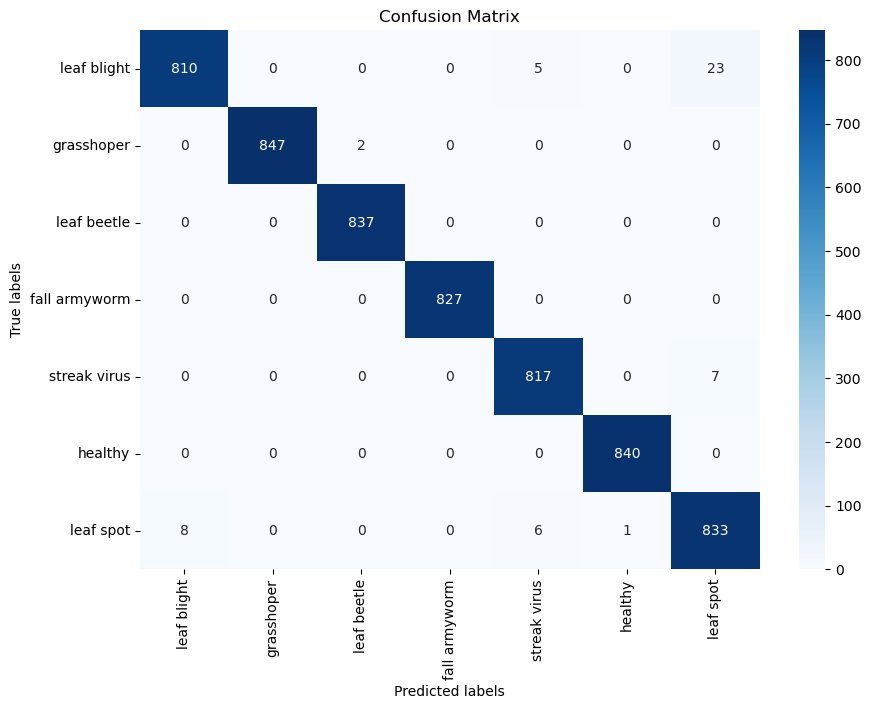

Training Set Evaluation:
Accuracy: 0.991130820399113
Precision: 0.9911964752795348
Recall: 0.991130820399113
F1 Score: 0.9911311555595642
Confusion Matrix for Test Set:


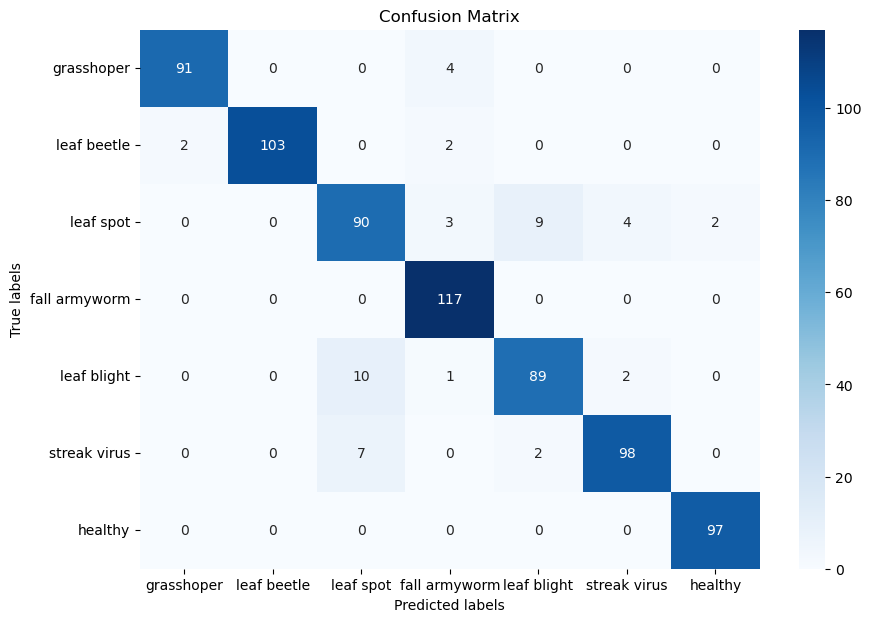

Test Set Evaluation:
Accuracy: 0.9345156889495225
Precision: 0.9348333416572567
Recall: 0.9345156889495225
F1 Score: 0.9342950473145865
Confusion Matrix for Validation Set:


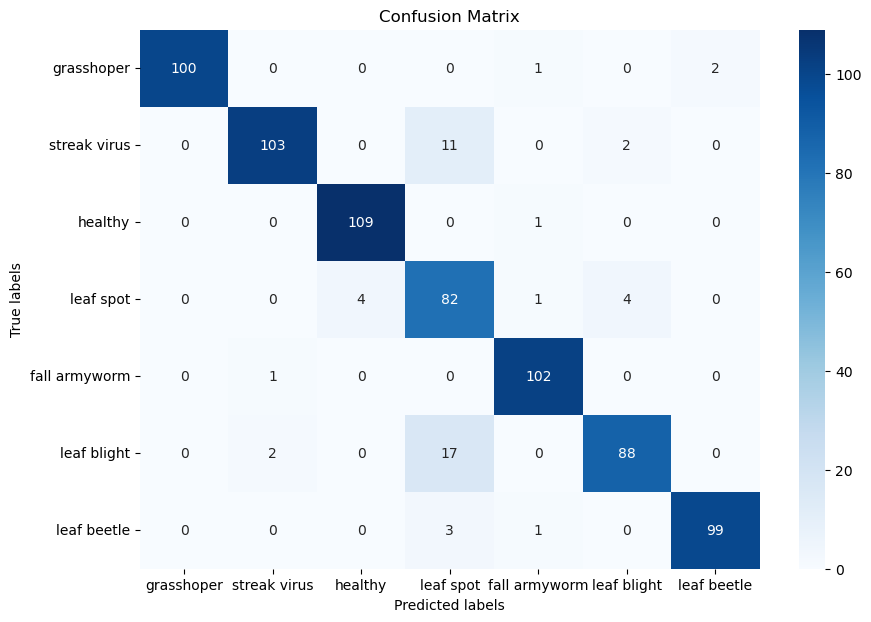

Validation Set Evaluation:
Accuracy: 0.931787175989086
Precision: 0.93874814516393
Recall: 0.931787175989086
F1 Score: 0.9331595946457899
Plotting Learning Curves for the Best SVM Model


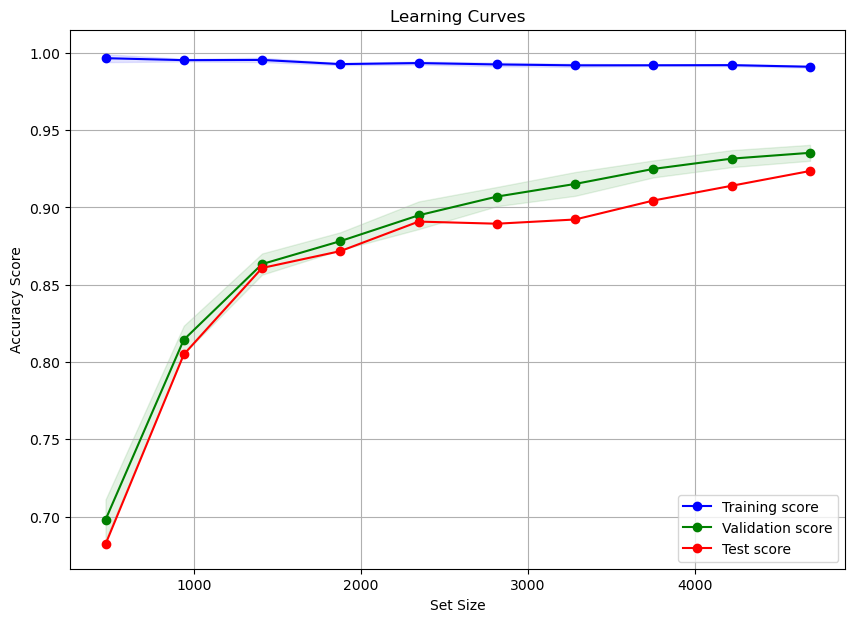

In [28]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.pipeline import make_pipeline
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix, precision_score, recall_score, f1_score
from sklearn.model_selection import GridSearchCV, learning_curve
import matplotlib.pyplot as plt
import seaborn as sns
import joblib
import numpy as np


# Initialize StandardScaler
scaler = StandardScaler()

# Initialize SVM model
svm_model = SVC(decision_function_shape='ovo',class_weight='balanced')

# Create a pipeline that includes scaling and SVM
pipeline = make_pipeline(scaler, svm_model)

# Hyperparameter tuning with GridSearchCV
param_grid = {
    'svc__C': [0.01,0.8,0.9,0.7,0.1,1],
    'svc__gamma': [0.01, 0.1, 1, 10,'scale', 'auto'],
    'svc__kernel': ['rbf']
}
grid_search = GridSearchCV(pipeline, param_grid, cv=5, n_jobs=-1, verbose=1)
grid_search.fit(X_train, y_train)

# Best parameters from GridSearchCV
print("Best parameters found: ", grid_search.best_params_)

# Use the best estimator found by GridSearchCV
best_pipeline = grid_search.best_estimator_

# Make predictions on the training set
y_pred_train = best_pipeline.predict(X_train)

# Make predictions on the test set
y_pred_test = best_pipeline.predict(X_test)

# Evaluate the model on the training set
accuracy_train = accuracy_score(y_train, y_pred_train)
print(f"Training set accuracy: {accuracy_train:.2f}")

# Print classification report for the training set
print("Classification Report for Training Set:")
print(classification_report(y_train, y_pred_train))

# Evaluate the model on the test set
accuracy_test = accuracy_score(y_test, y_pred_test)
print(f"Test set accuracy: {accuracy_test:.2f}")

# Print classification report for the test set
print("Classification Report for Test Set:")
print(classification_report(y_test, y_pred_test))

# Validate the model on the validation set
y_pred_val = best_pipeline.predict(X_validation)
val_accuracy = accuracy_score(y_validation, y_pred_val)
print(f"Validation set accuracy: {val_accuracy:.2f}")

# Print classification report for the validation set
print("Classification Report for Validation Set:")
print(classification_report(y_validation, y_pred_val))

# Save the trained model for future use
joblib.dump(best_pipeline, 'svm_model_rbf_pipeline.pkl')
print("Model saved as 'svm_model_rbf_pipeline.pkl'")

# Function to plot confusion matrix
def plot_confusion_matrix(y_true, y_pred, labels, title='Confusion Matrix'):
    cm = confusion_matrix(y_true, y_pred, labels=labels)
    plt.figure(figsize=(10, 7))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted labels')
    plt.ylabel('True labels')
    plt.title(title)
    plt.show()

# Extended evaluation
def extended_evaluation(y_true, y_pred, labels):
    print("Accuracy:", accuracy_score(y_true, y_pred))
    print("Precision:", precision_score(y_true, y_pred, average='weighted', labels=labels))
    print("Recall:", recall_score(y_true, y_pred, average='weighted', labels=labels))
    print("F1 Score:", f1_score(y_true, y_pred, average='weighted', labels=labels))

# Plot confusion matrix for the training set
print("Confusion Matrix for Training Set:")
plot_confusion_matrix(y_train, y_pred_train, labels=y_train.unique())

# Evaluate training set
print("Training Set Evaluation:")
extended_evaluation(y_train, y_pred_train, labels=y_train.unique())

# Plot confusion matrix for the test set
print("Confusion Matrix for Test Set:")
plot_confusion_matrix(y_test, y_pred_test, labels=y_test.unique())

# Evaluate test set
print("Test Set Evaluation:")
extended_evaluation(y_test, y_pred_test, labels=y_test.unique())

# Plot confusion matrix for the validation set
print("Confusion Matrix for Validation Set:")
plot_confusion_matrix(y_validation, y_pred_val, labels=y_validation.unique())

# Evaluate validation set
print("Validation Set Evaluation:")
extended_evaluation(y_validation, y_pred_val, labels=y_validation.unique())

# Plot learning curves for training, validation, and test sets
def plot_learning_curves(estimator, X_train, y_train, X_test, y_test, title='Learning Curves'):
    train_sizes, train_scores, validation_scores = learning_curve(
        estimator, X_train, y_train, cv=5, scoring='accuracy', n_jobs=-1, train_sizes=np.linspace(0.1, 1.0, 10)
    )

    # Calculate mean and std for training and validation scores
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    validation_scores_mean = np.mean(validation_scores, axis=1)
    validation_scores_std = np.std(validation_scores, axis=1)

    # Evaluate the estimator on the test set for the different training sizes
    test_scores = []
    for train_size in train_sizes:
        estimator.fit(X_train[:int(train_size)], y_train[:int(train_size)])
        test_scores.append(estimator.score(X_test, y_test))
    test_scores = np.array(test_scores)

    # Plot learning curves
    plt.figure(figsize=(10, 7))
    plt.plot(train_sizes, train_scores_mean, 'o-', color='blue', label='Training score')
    plt.plot(train_sizes, validation_scores_mean, 'o-', color='green', label='Validation score')
    plt.plot(train_sizes, test_scores, 'o-', color='red', label='Test score')  # Test curve

    # Add shaded regions for standard deviation
    plt.fill_between(train_sizes, train_scores_mean - train_scores_std, train_scores_mean + train_scores_std, color='blue', alpha=0.1)
    plt.fill_between(train_sizes, validation_scores_mean - validation_scores_std, validation_scores_mean + validation_scores_std, color='green', alpha=0.1)

    # Plot test scores
    plt.title(title)
    plt.xlabel('Set Size')
    plt.ylabel('Accuracy Score')
    plt.legend(loc='best')
    plt.grid()
    plt.show()

# Plot learning curves for the best pipeline
print("Plotting Learning Curves for the Best SVM Model")
plot_learning_curves(pipeline, X_train, y_train, X_test, y_test)

###### 